In [1]:
import os
import polars as pl
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [2]:
def read_parquet_by_type(train_path: str):
    # Lấy tất cả các file parquet trong thư mục
    files = [os.path.join(train_path, f) for f in os.listdir(train_path) if f.endswith('.parquet')]
    
    # Phân loại các file theo loại tên
    user_chunk_files = [file for file in files if 'user_chunk' in file]
    purchase_history_chunk_files = [file for file in files if 'purchase_history_daily_chunk' in file]
    item_chunk_files = [file for file in files if 'item_chunk' in file]
    
    # Đọc các file riêng biệt thành DataFrame
    user_chunk_df = pl.concat([pl.read_parquet(file) for file in user_chunk_files]) if user_chunk_files else None
    purchase_history_chunk_df = pl.concat([pl.read_parquet(file) for file in purchase_history_chunk_files]) if purchase_history_chunk_files else None
    item_chunk_df = pl.concat([pl.read_parquet(file) for file in item_chunk_files]) if item_chunk_files else None
    
    # Trả về một dictionary chứa các DataFrame
    return {
        "user_chunk": user_chunk_df,
        "purchase_history_chunk": purchase_history_chunk_df,
        "item_chunk": item_chunk_df
    }

In [3]:
train_path = './recommendation_dataset'
dataframes = read_parquet_by_type(train_path)

df_user = dataframes["user_chunk"]
df_purchase = dataframes["purchase_history_chunk"]
df_item = dataframes["item_chunk"]

# Phân Tích Đa Biến

## User Chunk

In [4]:
import polars as pl
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def detect_column_types(df: pl.DataFrame):
    numeric_cols = []
    category_cols = []

    numeric_types = {
        pl.Int8, pl.Int16, pl.Int32, pl.Int64,
        pl.UInt8, pl.UInt16, pl.UInt32, pl.UInt64,
        pl.Float32, pl.Float64, pl.Decimal
    }

    for name, dtype in df.schema.items():
        # Kiểm tra kiểu số
        if dtype in numeric_types or isinstance(dtype, pl.Decimal):
            numeric_cols.append(name)
        # Kiểu chuỗi (categorical)
        elif dtype == pl.Utf8:
            category_cols.append(name)

    return numeric_cols, category_cols



In [5]:
numeric_cols, category_cols = detect_column_types(df_user)

In [6]:
print("numeric_cols:", numeric_cols)
print("category_cols:", category_cols)

numeric_cols: ['customer_id', 'location', 'timestamp', 'sync_status_id', 'install_date']
category_cols: ['gender', 'province', 'membership', 'sync_error_message', 'region', 'location_name', 'install_app', 'district', 'user_id']


In [7]:
category_cols = ['gender', 'province', 'membership', 'sync_error_message', 'region', 'location_name', 'install_app', 'district']

### Numeric-Numeric

#### Statistic
Sử dụng
1. Correlation
2. Regression

In [11]:
import polars as pl
import pandas as pd
import numpy as np
from scipy import stats
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

def perform_multivariate_analysis(df_item, numeric_cols):
    # Giữ lại các cột có tồn tại trong DataFrame
    df_num = df_item.select([pl.col(c).cast(pl.Float64).alias(c) for c in numeric_cols if c in df_item.columns])

    # Chuyển sang pandas và loại bỏ giá trị null
    df_num_pd = df_num.to_pandas().dropna()

    if df_num_pd.shape[0] < 2:
        print("⚠️ Không đủ dữ liệu để phân tích.")
        return

    # ==================================================
    # 1️⃣ TƯƠNG QUAN (CORRELATION)
    # ==================================================
    for i in range(len(numeric_cols)):
        for j in range(i + 1, len(numeric_cols)):  # Tính toán cho các cặp cột khác nhau
            col_x = numeric_cols[i]
            col_y = numeric_cols[j]

            pearson_corr, pearson_p = stats.pearsonr(df_num_pd[col_x], df_num_pd[col_y])
            spearman_corr, spearman_p = stats.spearmanr(df_num_pd[col_x], df_num_pd[col_y])
            kendall_corr, kendall_p = stats.kendalltau(df_num_pd[col_x], df_num_pd[col_y])

            print(f"=== 📊 CORRELATION ANALYSIS between {col_x} and {col_y} ===")
            print(f"Pearson  r = {pearson_corr:.4f} (p={pearson_p:.4e})")
            print(f"Spearman r = {spearman_corr:.4f} (p={spearman_p:.4e})")
            print(f"Kendall  τ = {kendall_corr:.4f} (p={kendall_p:.4e})")

            # Nhận xét nhanh về tương quan
            def interpret_corr(r):
                r_abs = abs(r)
                if r_abs < 0.1:
                    return "Không có tương quan"
                elif r_abs < 0.3:
                    return "Tương quan yếu"
                elif r_abs < 0.5:
                    return "Tương quan vừa"
                elif r_abs < 0.7:
                    return "Tương quan mạnh"
                else:
                    return "Tương quan rất mạnh"

            print(f"🔹 Đánh giá: {interpret_corr(pearson_corr)} giữa {col_x} và {col_y}\n")

    # ==================================================
    # 2️⃣ HỒI QUY TUYẾN TÍNH (LINEAR REGRESSION)
    # ==================================================
    for i in range(len(numeric_cols)):
        for j in range(i + 1, len(numeric_cols)):  # Tính toán cho các cặp cột khác nhau
            col_x = numeric_cols[i]
            col_y = numeric_cols[j]

            X = df_num_pd[[col_x]].values
            y = df_num_pd[col_y].values

            model = LinearRegression()
            model.fit(X, y)

            y_pred = model.predict(X)

            # Hệ số hồi quy
            coef = model.coef_[0]
            intercept = model.intercept_
            r2 = r2_score(y, y_pred)
            mae = mean_absolute_error(y, y_pred)
            rmse = np.sqrt(mean_squared_error(y, y_pred))

            print(f"=== 📈 LINEAR REGRESSION ANALYSIS between {col_x} and {col_y} ===")
            print(f"Phương trình: {col_y} = {coef:.4f} * {col_x} + {intercept:.4f}")
            print(f"R² (Explained variance): {r2:.4f}")
            print(f"MAE: {mae:.4f}")
            print(f"RMSE: {rmse:.4f}")

            # Diễn giải
            direction = "tăng" if coef > 0 else "giảm"
            print(f"🔹 Khi {col_x} tăng 1 đơn vị, {col_y} trung bình {direction} {abs(coef):.4f} đơn vị.\n")


In [19]:
perform_multivariate_analysis(df_user, numeric_cols)

=== 📊 CORRELATION ANALYSIS between customer_id and location ===
Pearson  r = 0.1616 (p=0.0000e+00)
Spearman r = 0.1649 (p=0.0000e+00)
Kendall  τ = 0.1125 (p=0.0000e+00)
🔹 Đánh giá: Tương quan yếu giữa customer_id và location

=== 📊 CORRELATION ANALYSIS between customer_id and timestamp ===
Pearson  r = 0.9877 (p=0.0000e+00)
Spearman r = 1.0000 (p=0.0000e+00)
Kendall  τ = 1.0000 (p=0.0000e+00)
🔹 Đánh giá: Tương quan rất mạnh giữa customer_id và timestamp



C:\Users\huynh\AppData\Local\Temp\ipykernel_16676\664225969.py:27: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  pearson_corr, pearson_p = stats.pearsonr(df_num_pd[col_x], df_num_pd[col_y])
C:\Users\huynh\AppData\Local\Temp\ipykernel_16676\664225969.py:28: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = stats.spearmanr(df_num_pd[col_x], df_num_pd[col_y])


=== 📊 CORRELATION ANALYSIS between customer_id and sync_status_id ===
Pearson  r = nan (p=nan)
Spearman r = nan (p=nan)
Kendall  τ = nan (p=nan)
🔹 Đánh giá: Tương quan rất mạnh giữa customer_id và sync_status_id

=== 📊 CORRELATION ANALYSIS between customer_id and install_date ===
Pearson  r = 0.8281 (p=0.0000e+00)
Spearman r = 0.8339 (p=0.0000e+00)
Kendall  τ = 0.7890 (p=0.0000e+00)
🔹 Đánh giá: Tương quan rất mạnh giữa customer_id và install_date

=== 📊 CORRELATION ANALYSIS between location and timestamp ===
Pearson  r = 0.1549 (p=0.0000e+00)
Spearman r = 0.1649 (p=0.0000e+00)
Kendall  τ = 0.1125 (p=0.0000e+00)
🔹 Đánh giá: Tương quan yếu giữa location và timestamp

=== 📊 CORRELATION ANALYSIS between location and sync_status_id ===
Pearson  r = nan (p=nan)
Spearman r = nan (p=nan)
Kendall  τ = nan (p=nan)
🔹 Đánh giá: Tương quan rất mạnh giữa location và sync_status_id

=== 📊 CORRELATION ANALYSIS between location and install_date ===
Pearson  r = 0.1534 (p=0.0000e+00)
Spearman r = 0.1634

#### Visualize 
Sử dụng:
1. Scatter plot
2. Pair plot
3. Correlation matrix

In [20]:
import polars as pl
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# ============================================
# MULTIVARIATE ANALYSIS — PRICE vs GP
# ============================================

def plot_multivariate_analysis(df_item, numeric_cols):
    # Giữ lại các cột số có tồn tại trong DataFrame
    df_num = df_item.select([pl.col(c).cast(pl.Float64).alias(c) for c in numeric_cols if c in df_item.columns])

    # Chuyển sang pandas và loại bỏ giá trị null
    df_num_pd = df_num.to_pandas().dropna()

    if df_num_pd.shape[0] < 2:
        print("⚠️ Không đủ dữ liệu để phân tích.")
        return

    # --- (1) Scatter plot ---
    plt.figure(figsize=(6, 4))
    for i in range(len(numeric_cols)):
        for j in range(i + 1, len(numeric_cols)):  # Tính toán cho các cặp cột khác nhau
            col_x = numeric_cols[i]
            col_y = numeric_cols[j]

            sns.scatterplot(data=df_num_pd, x=col_x, y=col_y, alpha=0.5)
            sns.regplot(data=df_num_pd, x=col_x, y=col_y, scatter=False, color="red", ci=None)
            plt.title(f"Scatter plot: {col_x} vs {col_y}")
            plt.tight_layout()
            plt.show()

    # --- (2) Pair plot ---
    sns.pairplot(df_num_pd, diag_kind="kde", corner=True)
    plt.suptitle(f"Pair Plot: {', '.join(numeric_cols)}", y=1.02)
    plt.show()

    # --- (3) Correlation matrix ---
    corr = df_num_pd.corr(numeric_only=True)
    print("\nCorrelation matrix:")
    print(corr)

    plt.figure(figsize=(4, 3))
    sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".2f", vmin=-1, vmax=1)
    plt.title(f"Correlation heatmap: {', '.join(numeric_cols)}")
    plt.tight_layout()
    plt.show()



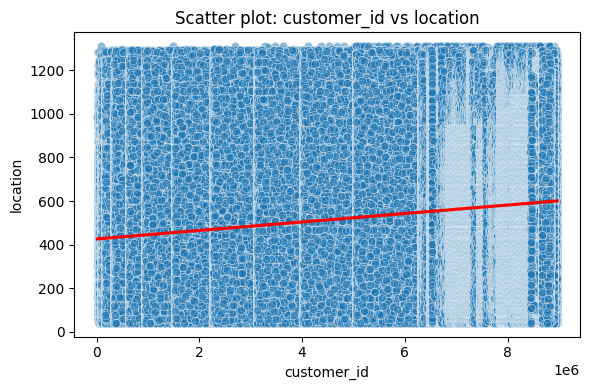

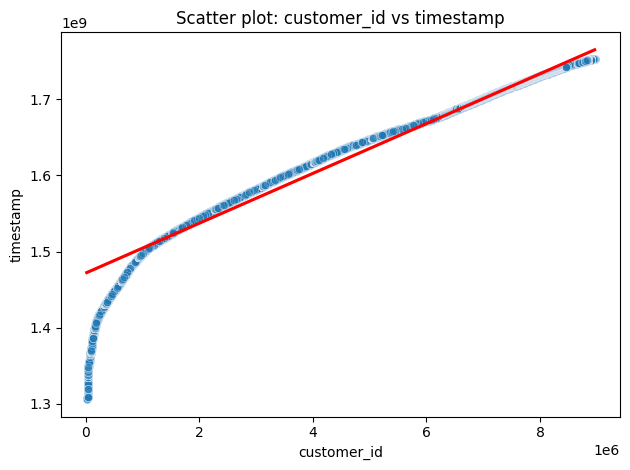

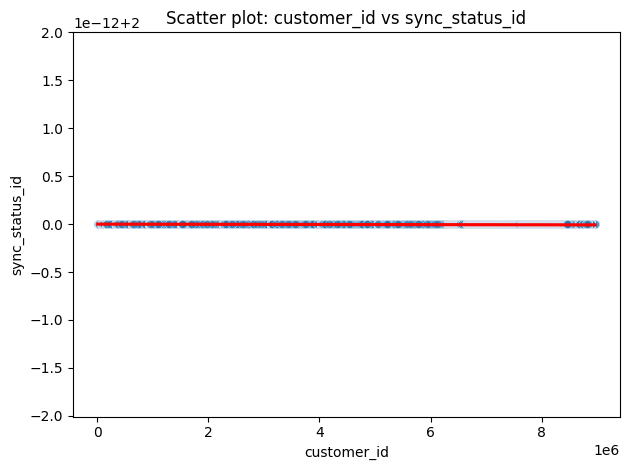

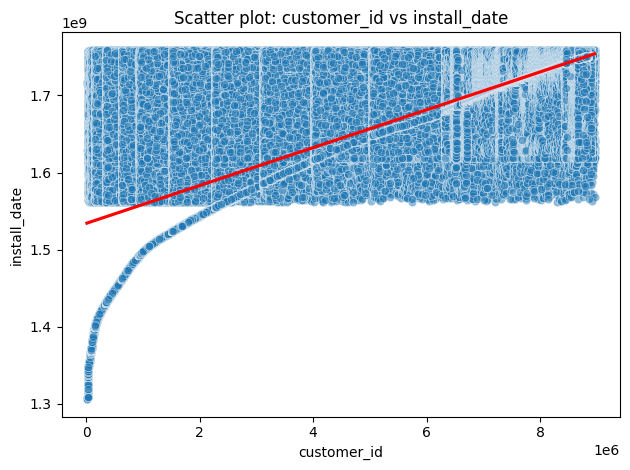

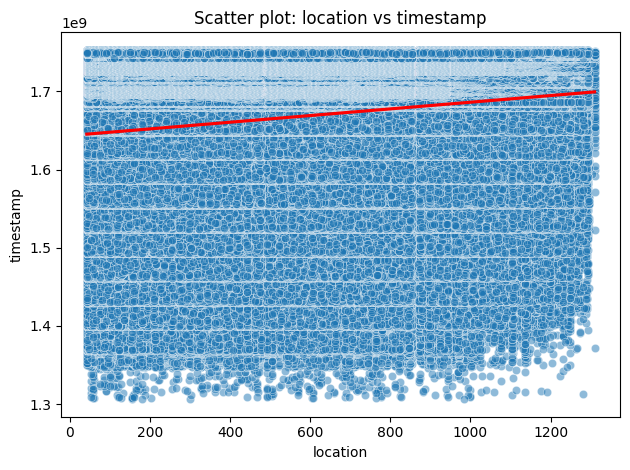

...

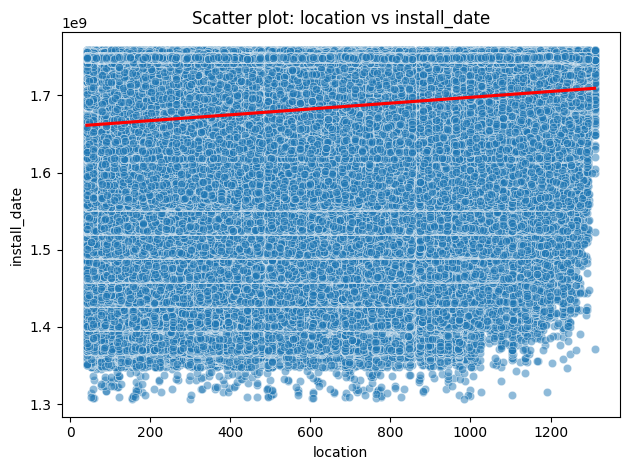

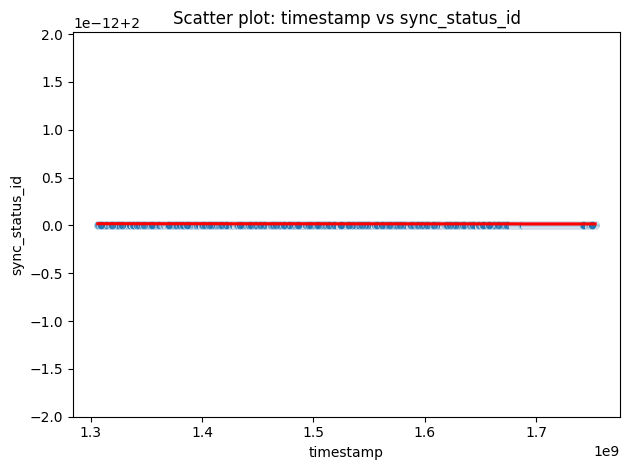

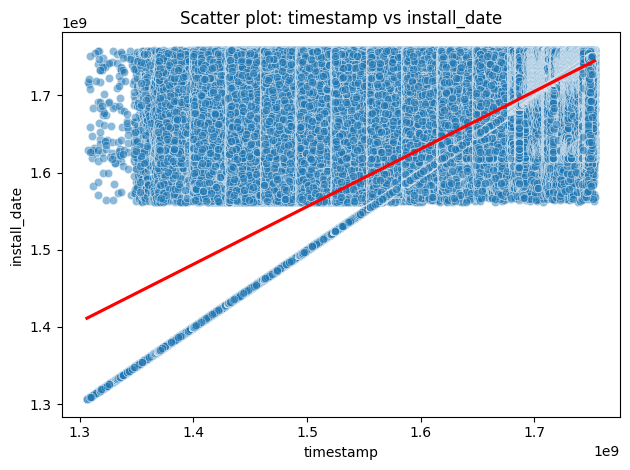

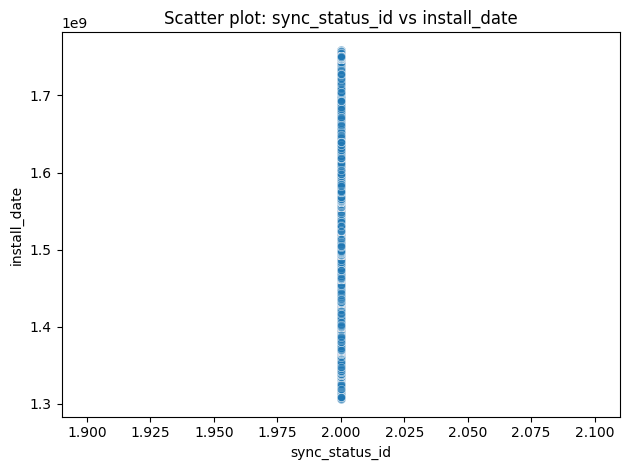

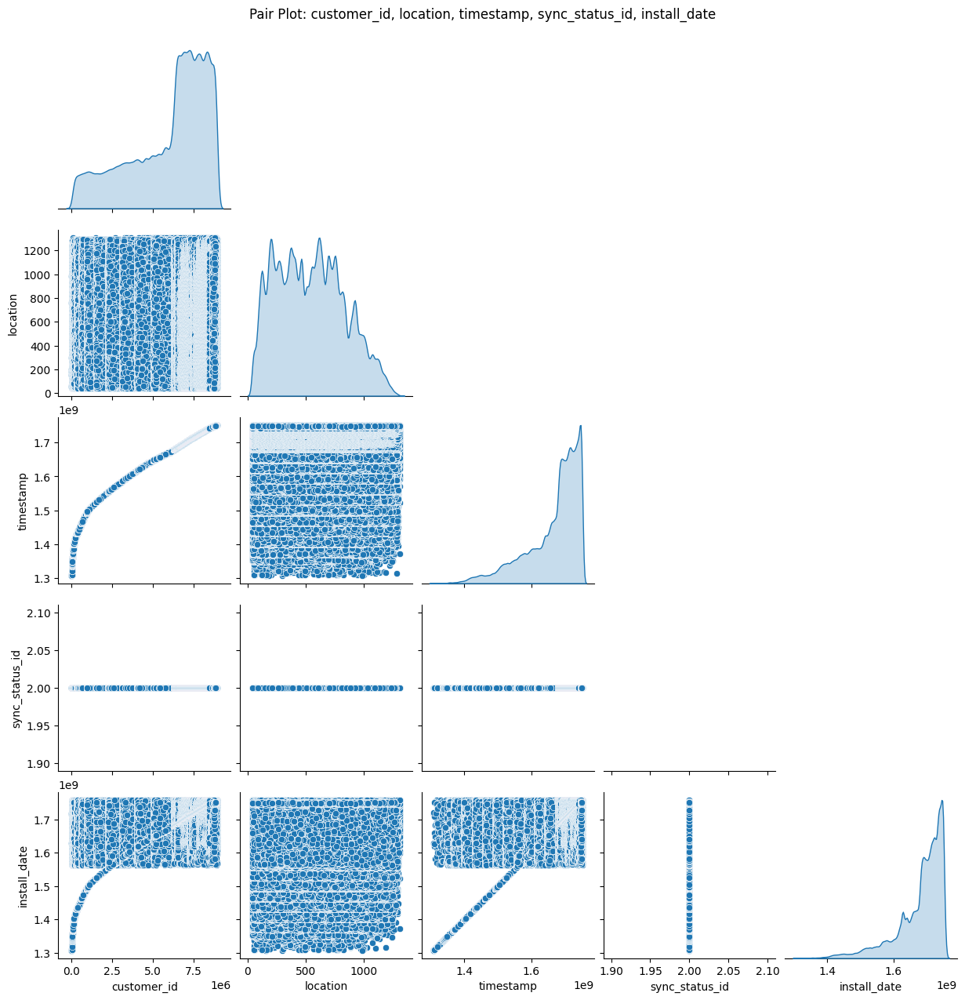


Correlation matrix:
                customer_id  location  timestamp  sync_status_id  install_date
customer_id        1.000000  0.161575   0.987722             NaN      0.828086
location           0.161575  1.000000   0.154926             NaN      0.153362
timestamp          0.987722  0.154926   1.000000             NaN      0.833599
sync_status_id          NaN       NaN        NaN             NaN           NaN
install_date       0.828086  0.153362   0.833599             NaN      1.000000


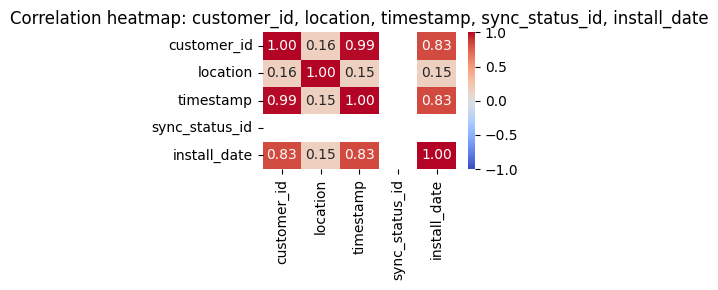

In [21]:
plot_multivariate_analysis(df_user, numeric_cols)


### Numeric-Category

#### Statistic

In [8]:
def analyze_numeric_category(df_item, cat_col, num_col, top_k=8):
    """
    Phân tích thống kê giữa 1 biến định tính (category_col)
    và 1 biến định lượng (numeric_col).
    Gồm:
        - ANOVA
        - Kruskal–Wallis
        - Thống kê mô tả nhóm
    """
    # Chuẩn bị dữ liệu
    df_plot = (
        df_item
        .with_columns([
            pl.col(num_col).cast(pl.Float64),
            pl.col(cat_col).cast(pl.Utf8)
        ])
        .drop_nulls([num_col, cat_col])
    )

    df_pd = df_plot.to_pandas()

    if df_pd.empty:
        print(f"[⚠️] Không có dữ liệu hợp lệ cho ({cat_col}, {num_col})")
        return

    # Lấy top K nhóm phổ biến
    top_cats = df_pd[cat_col].value_counts().nlargest(top_k).index
    df_top = df_pd[df_pd[cat_col].isin(top_cats)]

    # ===============================
    # 1️⃣ Thống kê mô tả theo nhóm
    # ===============================
    summary = (
        df_top.groupby(cat_col)[num_col]
        .agg(['count', 'mean', 'std', 'median', 'min', 'max'])
    )
    summary['iqr'] = (
        df_top.groupby(cat_col)[num_col].quantile(0.75)
        - df_top.groupby(cat_col)[num_col].quantile(0.25)
    )
    print(f"\n📊 Summary Statistics for ({num_col} by {cat_col}):\n", summary)

    # ===============================
    # 2️⃣ ANOVA (One-way)
    # ===============================
    groups = [group[num_col].values for _, group in df_top.groupby(cat_col)]
    p_val = np.nan
    kw_p = np.nan

    try:
        f_stat, p_val = stats.f_oneway(*groups)
        print(f"\n🔹 ANOVA: F = {f_stat:.3f}, p = {p_val:.3e}")
    except Exception as e:
        print(f"[⚠️] ANOVA không thực hiện được: {e}")

    # ===============================
    # 3️⃣ Kruskal–Wallis (phi tham số)
    # ===============================
    try:
        kw_stat, kw_p = stats.kruskal(*groups)
        print(f"🔹 Kruskal–Wallis: H = {kw_stat:.3f}, p = {kw_p:.3e}")
    except Exception as e:
        print(f"[⚠️] Kruskal–Wallis không thực hiện được: {e}")

    # ===============================
    # 4️⃣ So sánh phân phối nhóm
    # ===============================
    group_means = summary['mean']
    print("\n🔹 Group Means:")
    print(group_means.sort_values(ascending=False))

    print("\n➡️ Kết luận:")
    if (not np.isnan(p_val) and p_val < 0.05) or (not np.isnan(kw_p) and kw_p < 0.05):
        print(f"→ Có sự khác biệt có ý nghĩa thống kê giữa các nhóm của {cat_col} về {num_col}")
    else:
        print(f"→ Không có sự khác biệt đáng kể giữa các nhóm của {cat_col} về {num_col}")

# ===================================================
# 🔹 Gọi hàm cho toàn bộ cặp numeric–category
# ===================================================

print("🔢 Numeric columns:", numeric_cols)
print("🏷️ Category columns:", category_cols)

for cat_col in category_cols:
    for num_col in numeric_cols:
        print(f"\n📊 Phân tích cho cặp: ({cat_col}, {num_col})")
        analyze_numeric_category(df_user, cat_col, num_col)

🔢 Numeric columns: ['customer_id', 'location', 'timestamp', 'sync_status_id', 'install_date']
🏷️ Category columns: ['gender', 'province', 'membership', 'sync_error_message', 'region', 'location_name', 'install_app', 'district']

📊 Phân tích cho cặp: (gender, customer_id)

📊 Summary Statistics for (customer_id by gender):
           count          mean           std     median       min        max  \
gender                                                                        
Khác          8  8.987891e+05  1.105600e+05   903934.0  723263.0  1086971.0   
Nam     1149069  6.348920e+06  2.233205e+06  6928747.0   14732.0  9264154.0   
Nữ      3424887  6.052016e+06  2.502694e+06  6805257.0   15126.0  9264159.0   

               iqr  
gender              
Khác      86382.75  
Nam     2818093.00  
Nữ      3731492.00  
[⚠️] ANOVA không thực hiện được: name 'stats' is not defined
[⚠️] Kruskal–Wallis không thực hiện được: name 'stats' is not defined

🔹 Group Means:
gender
Nam     6.348920e+06


#### Visualize
Sử dụng:
1. Multiple density / histogram
2. Box-plot

🔢 Numeric columns: ['customer_id', 'location', 'timestamp', 'sync_status_id', 'install_date']
🏷️ Category columns: ['gender', 'province', 'membership', 'sync_error_message', 'region', 'location_name', 'install_app', 'district', 'user_id']

📊 Vẽ biểu đồ cho cặp: (gender, customer_id)


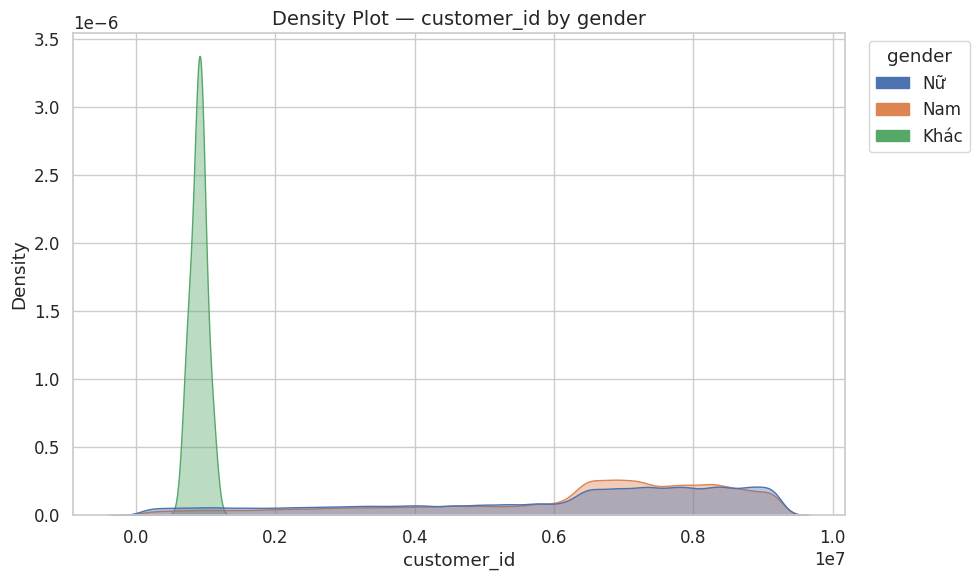

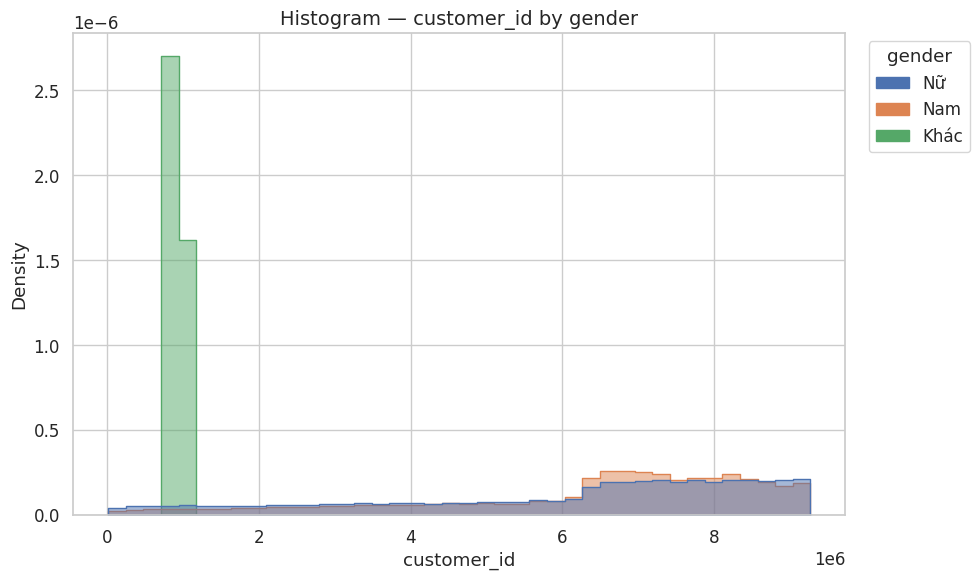

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


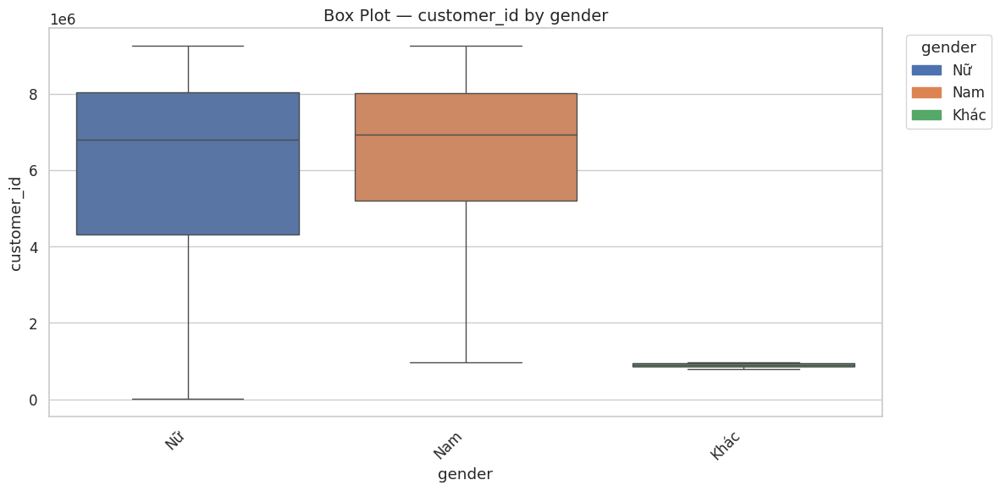


📊 Vẽ biểu đồ cho cặp: (gender, location)


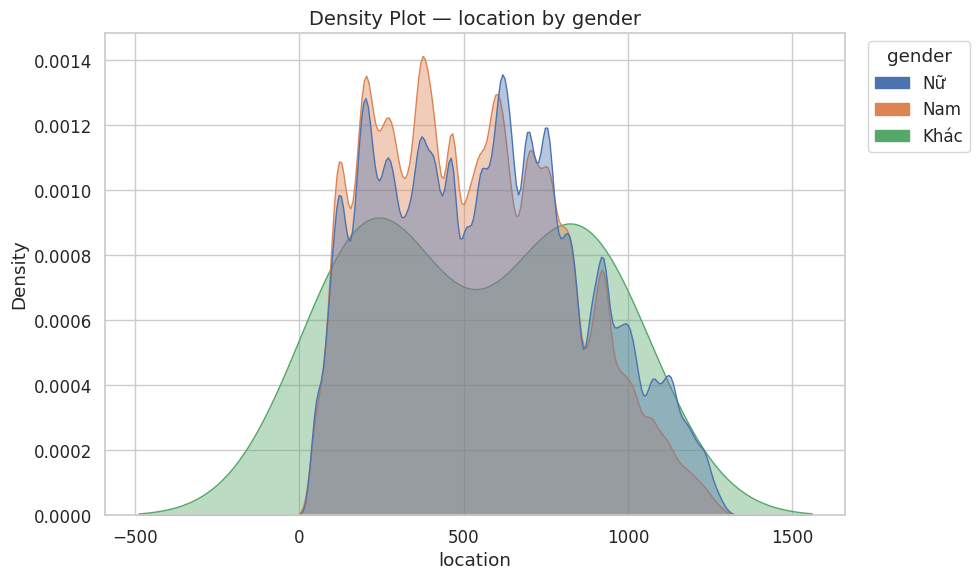

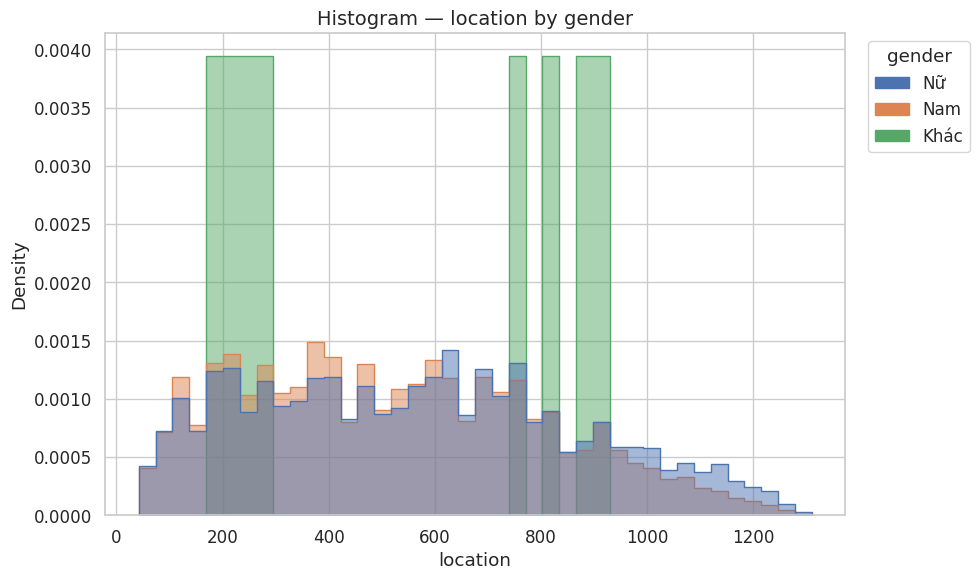

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


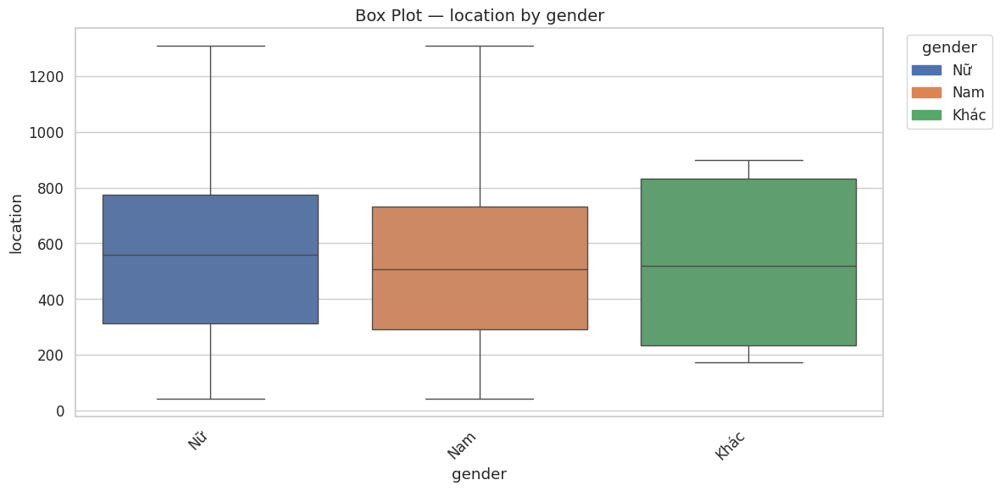


📊 Vẽ biểu đồ cho cặp: (gender, timestamp)


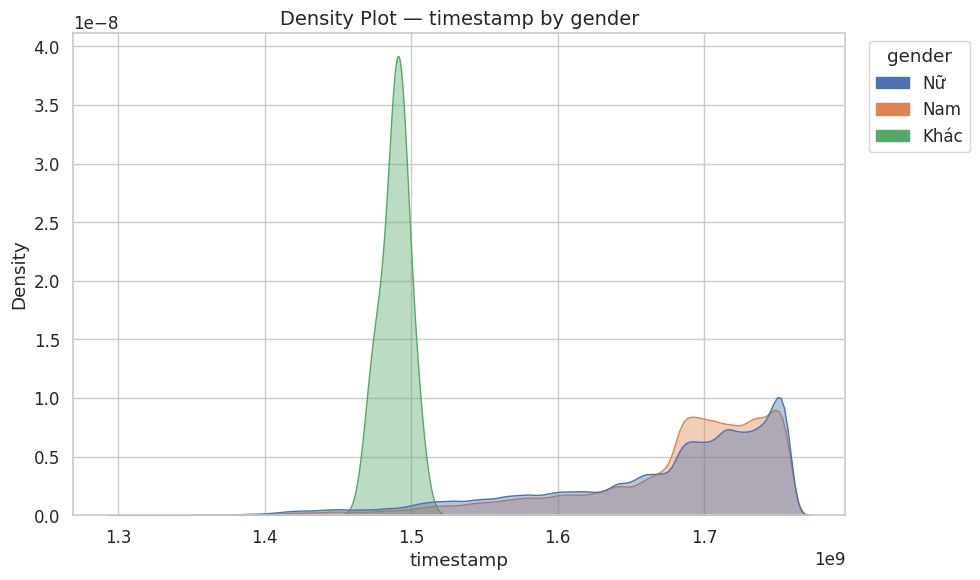

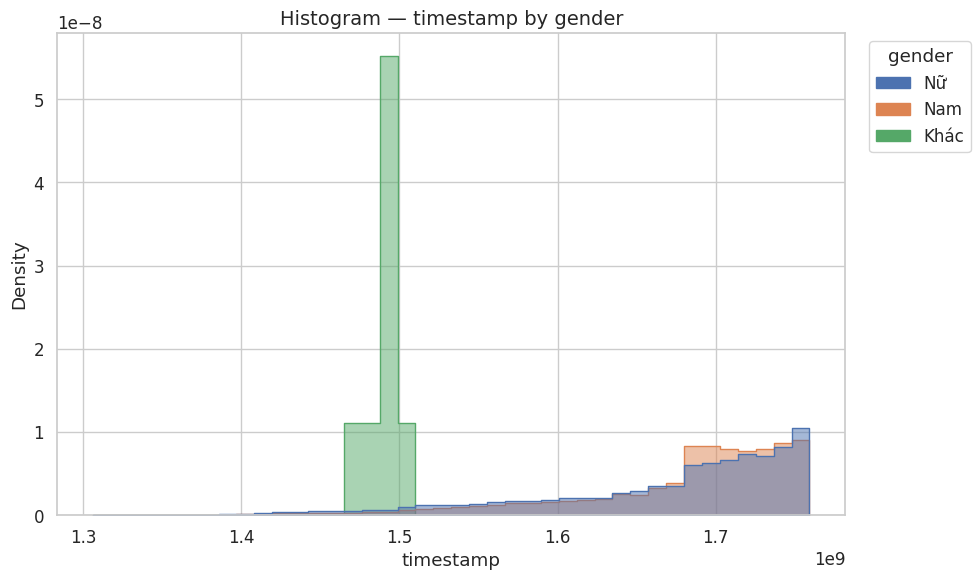

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


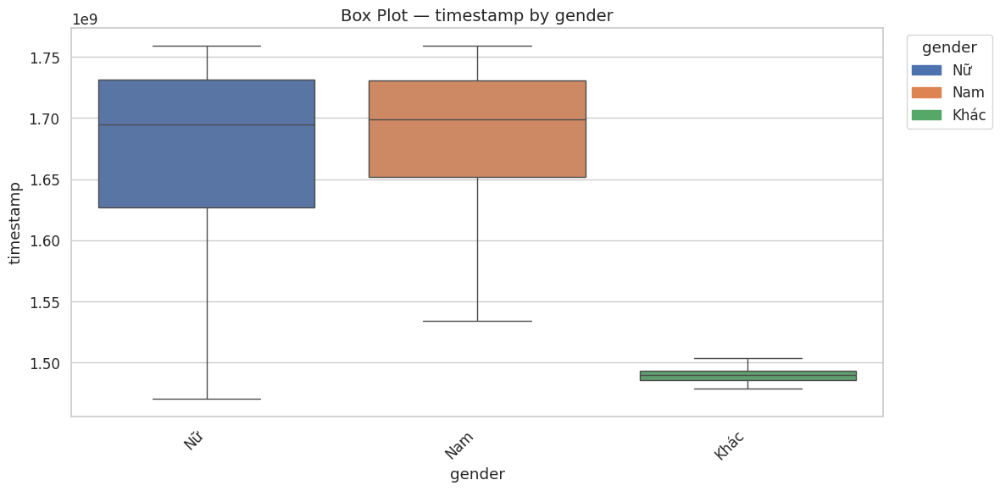


📊 Vẽ biểu đồ cho cặp: (gender, sync_status_id)


/tmp/ipykernel_2234233/31970007.py:59: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(


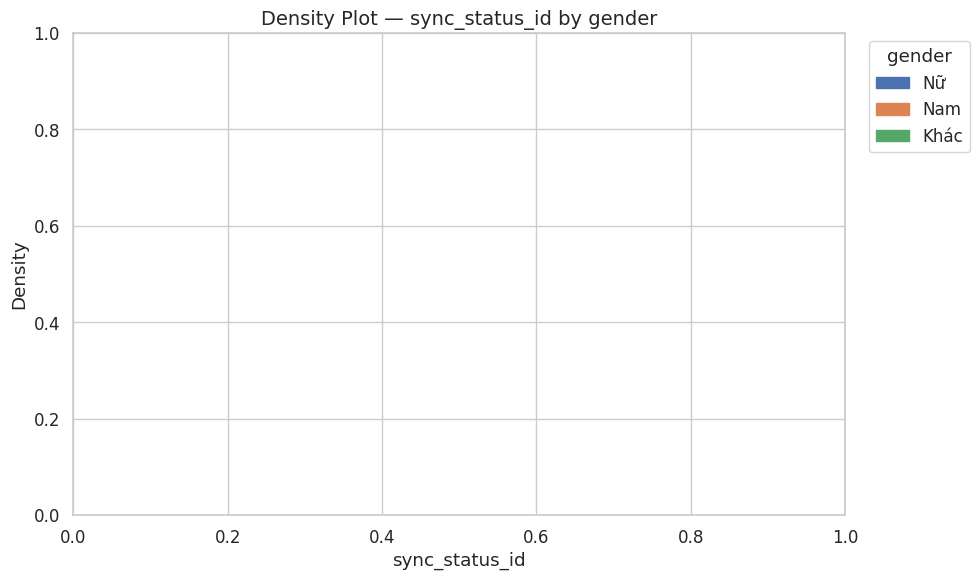

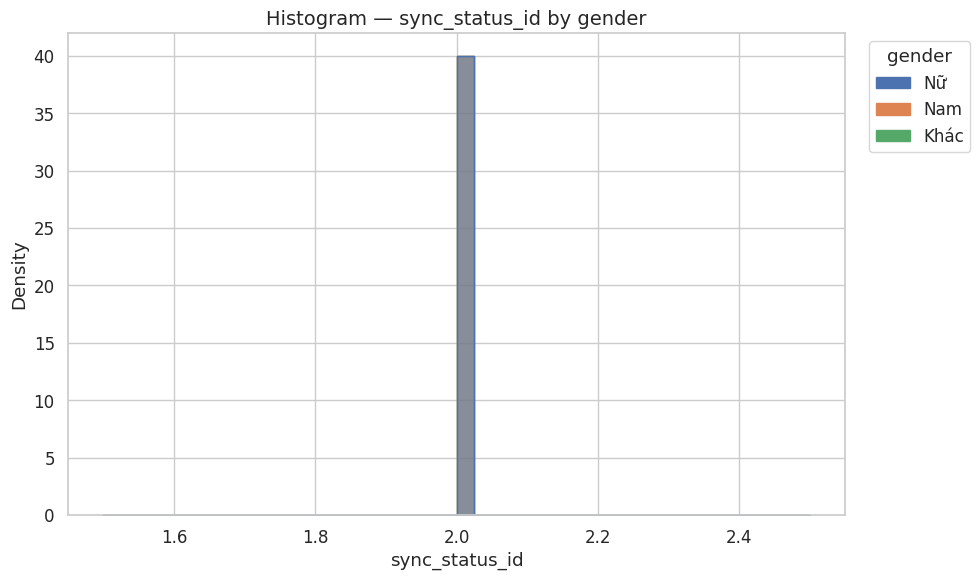

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


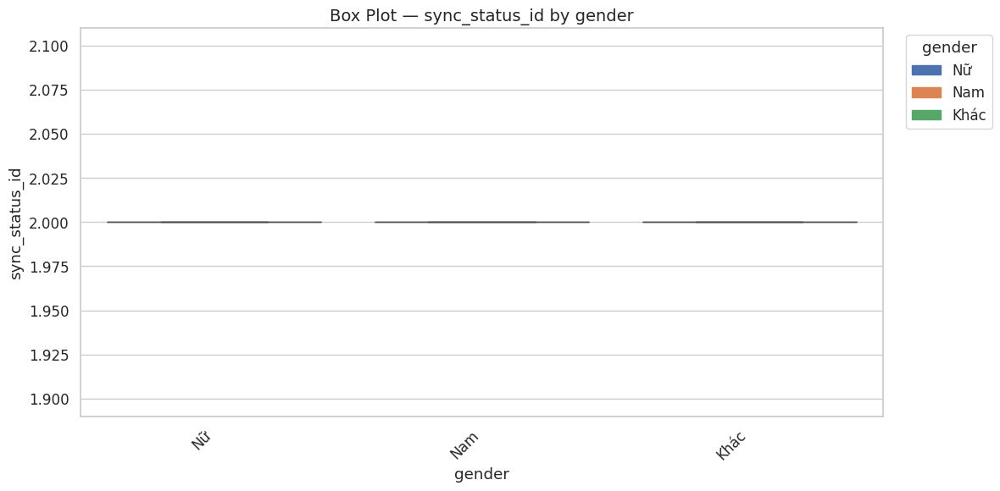


📊 Vẽ biểu đồ cho cặp: (gender, install_date)


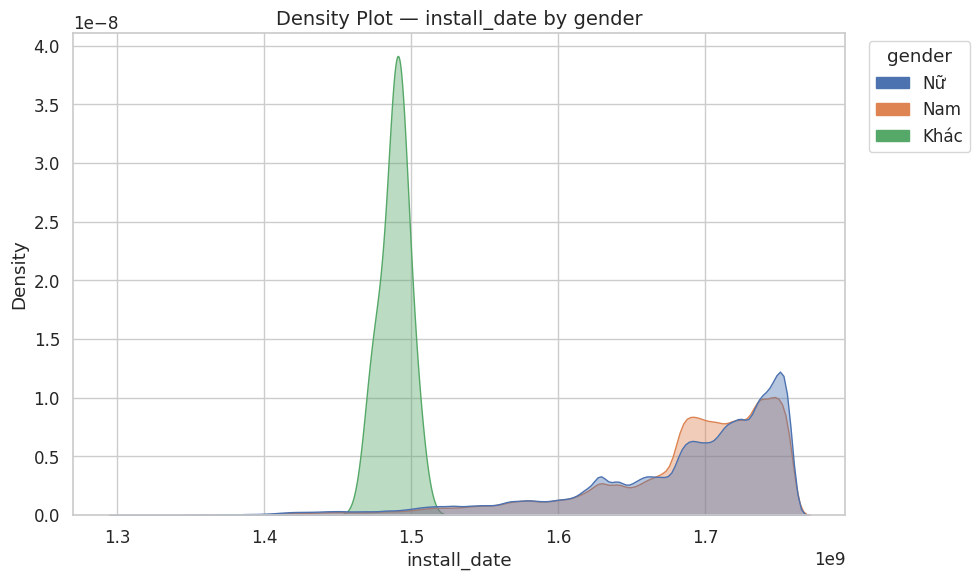

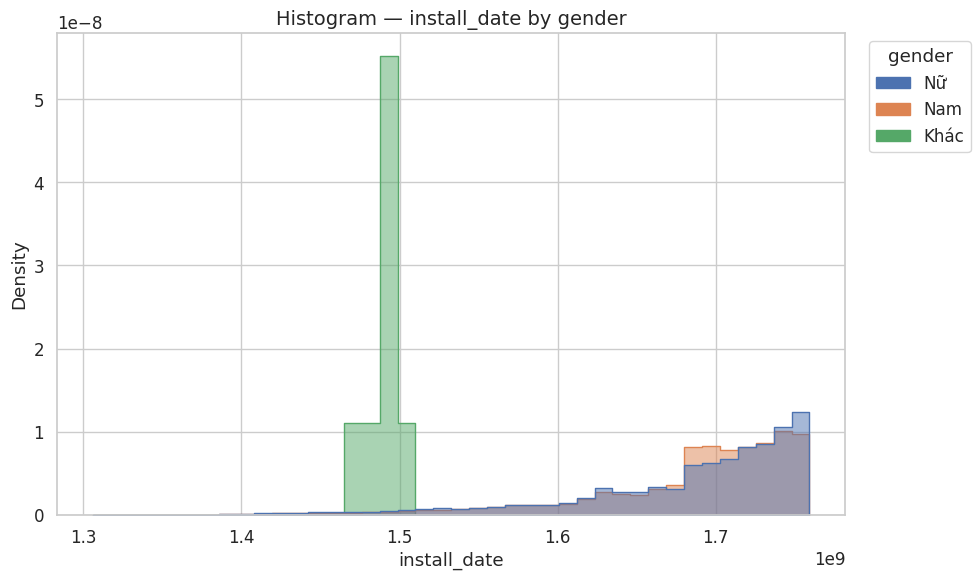

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


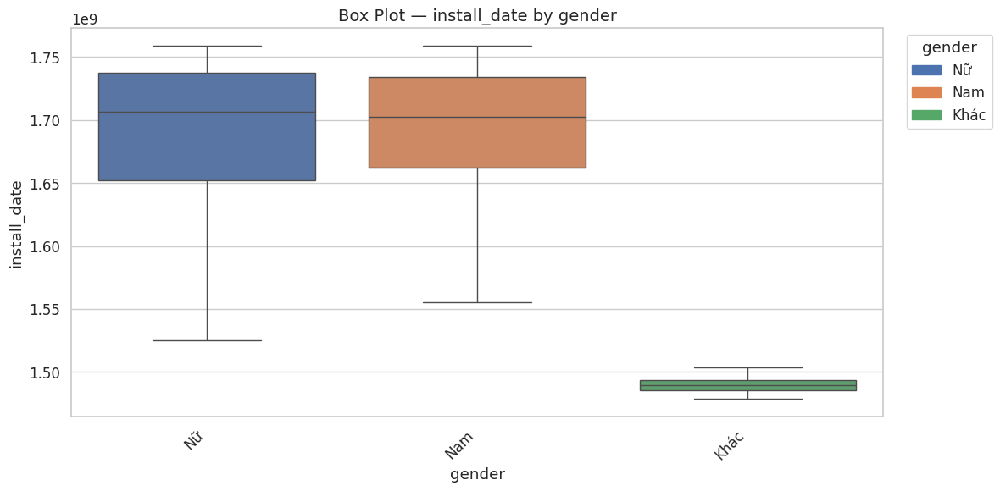


📊 Vẽ biểu đồ cho cặp: (province, customer_id)


/tmp/ipykernel_2234233/31970007.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))


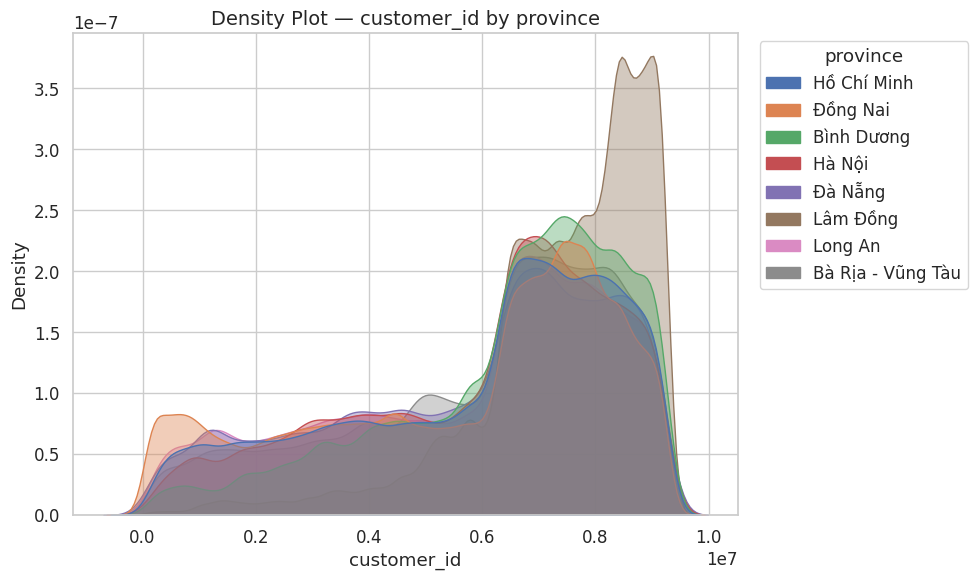

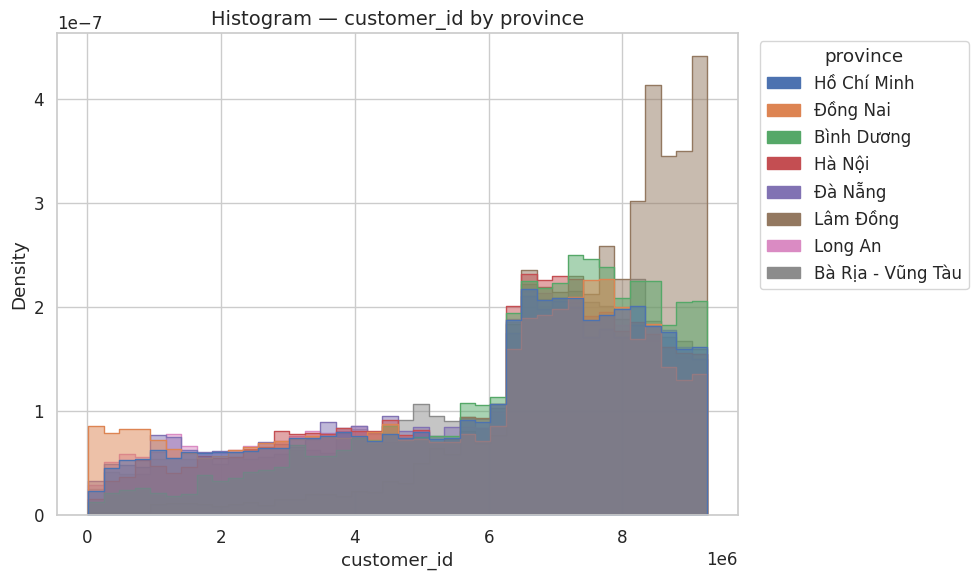

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


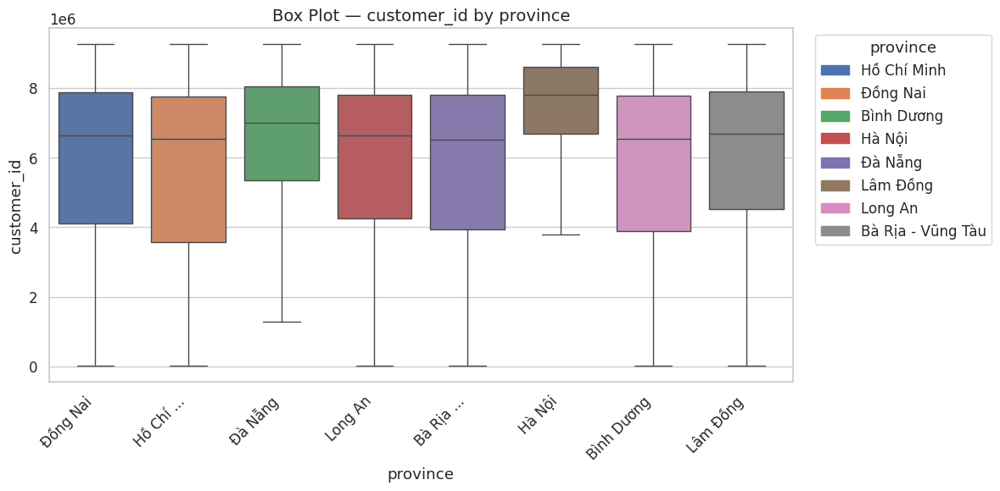


📊 Vẽ biểu đồ cho cặp: (province, location)


/tmp/ipykernel_2234233/31970007.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))


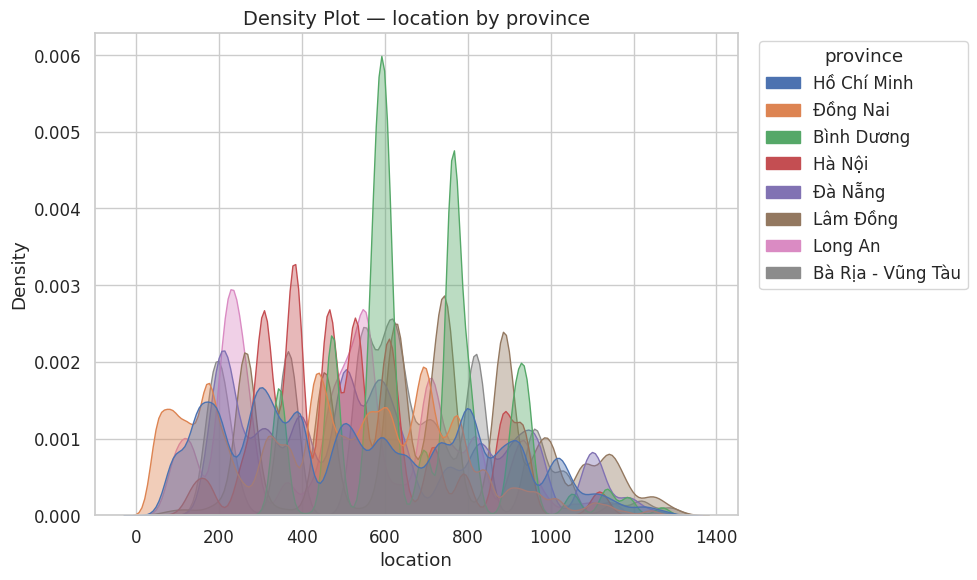

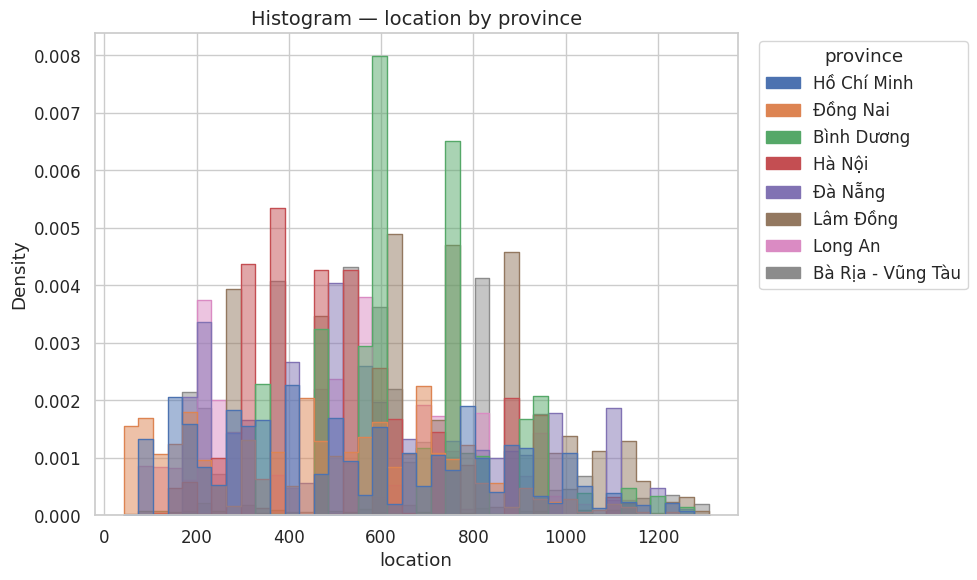

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


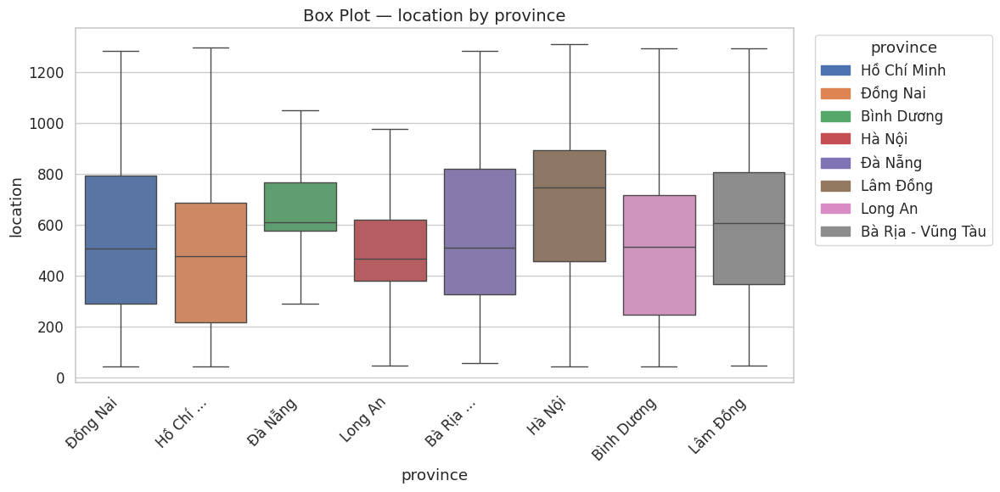


📊 Vẽ biểu đồ cho cặp: (province, timestamp)


/tmp/ipykernel_2234233/31970007.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))


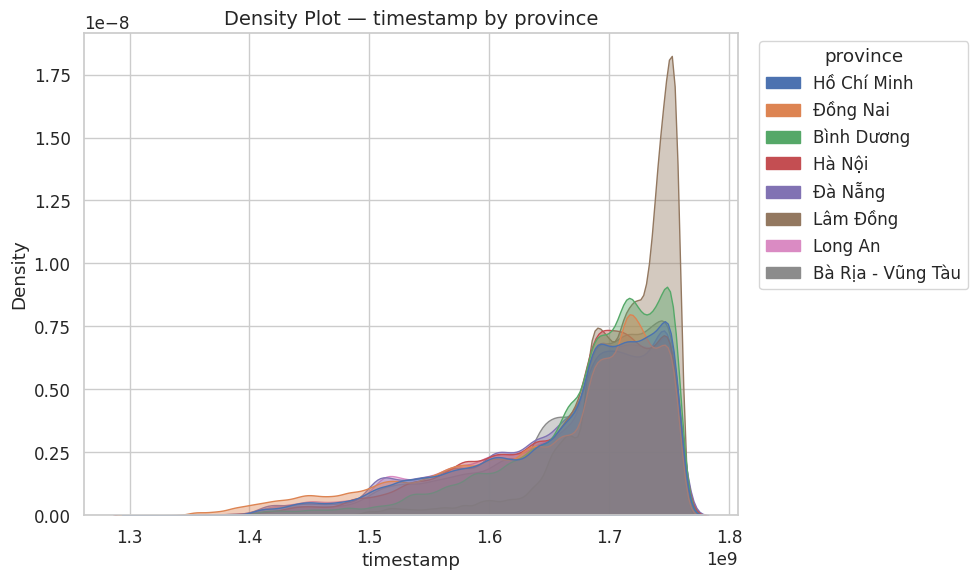

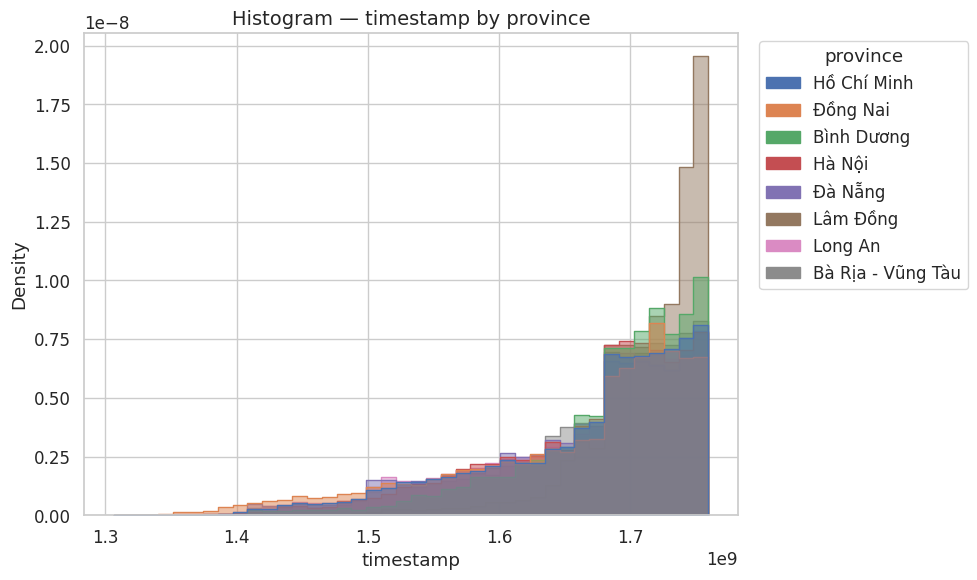

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


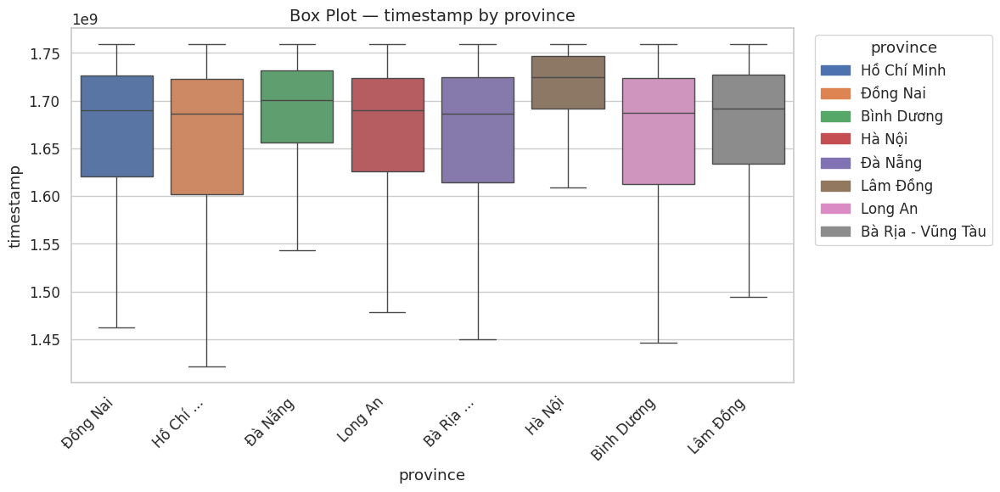


📊 Vẽ biểu đồ cho cặp: (province, sync_status_id)


/tmp/ipykernel_2234233/31970007.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))
/tmp/ipykernel_2234233/31970007.py:59: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(


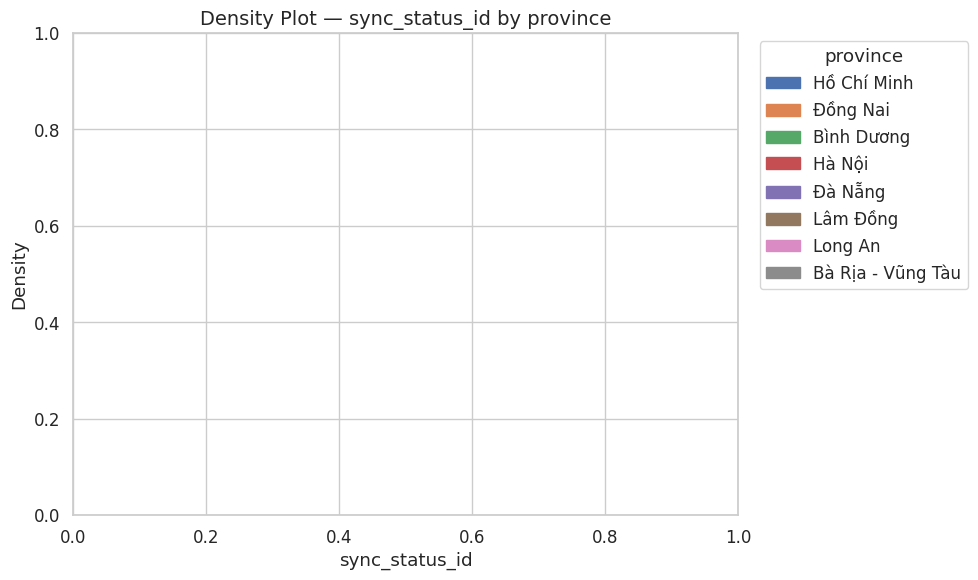

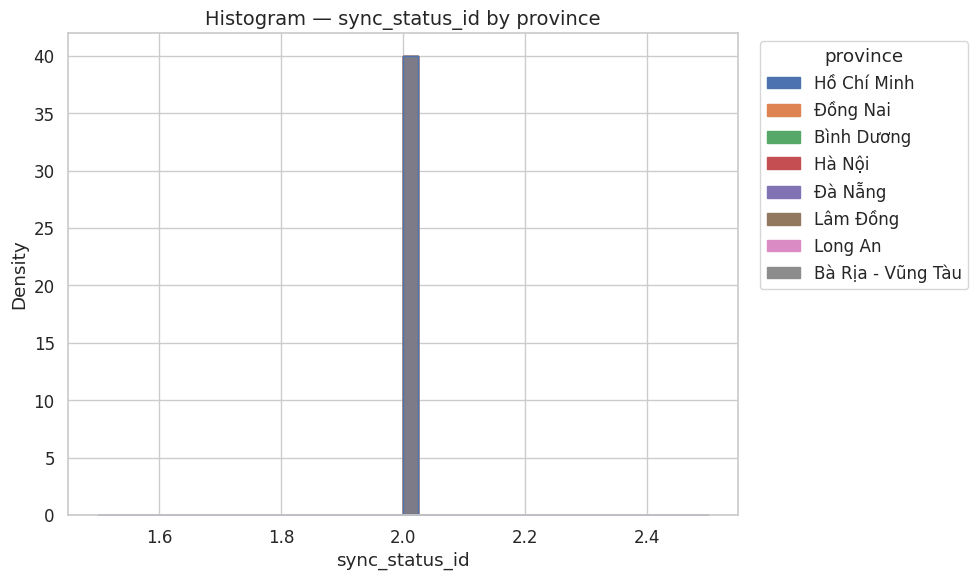

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


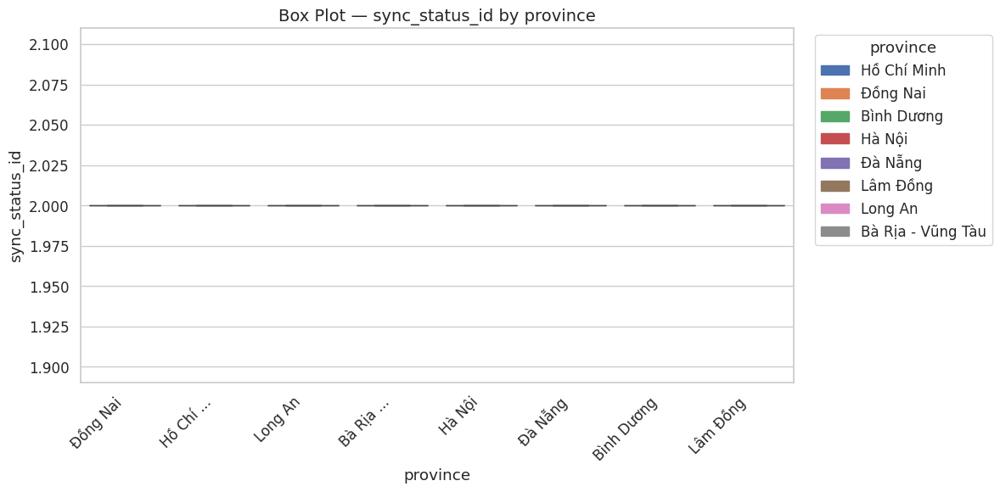


📊 Vẽ biểu đồ cho cặp: (province, install_date)


/tmp/ipykernel_2234233/31970007.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))


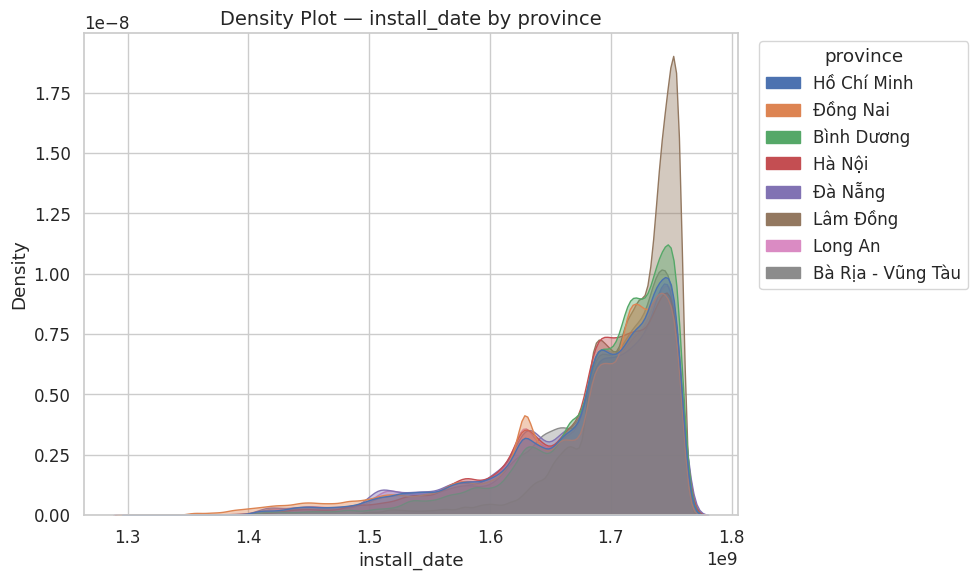

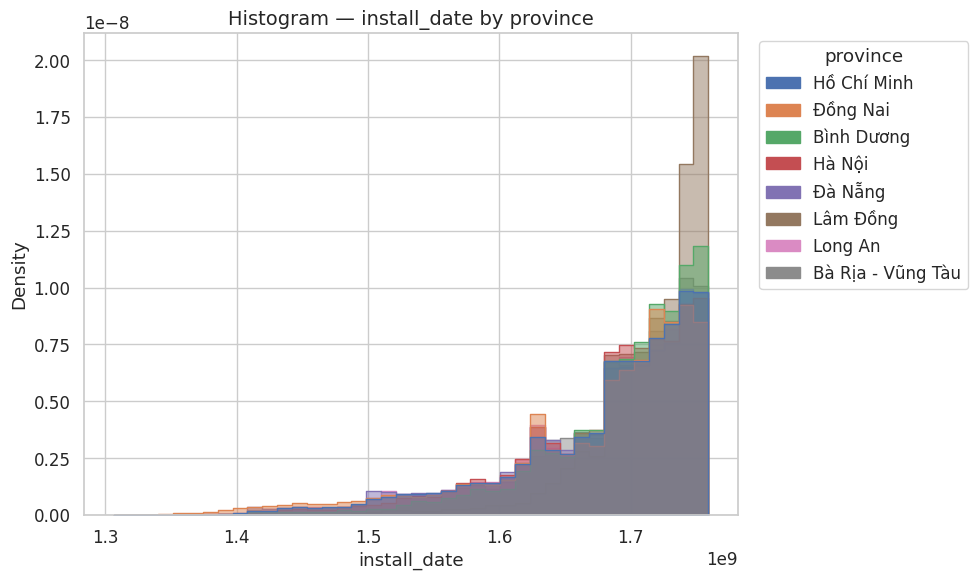

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


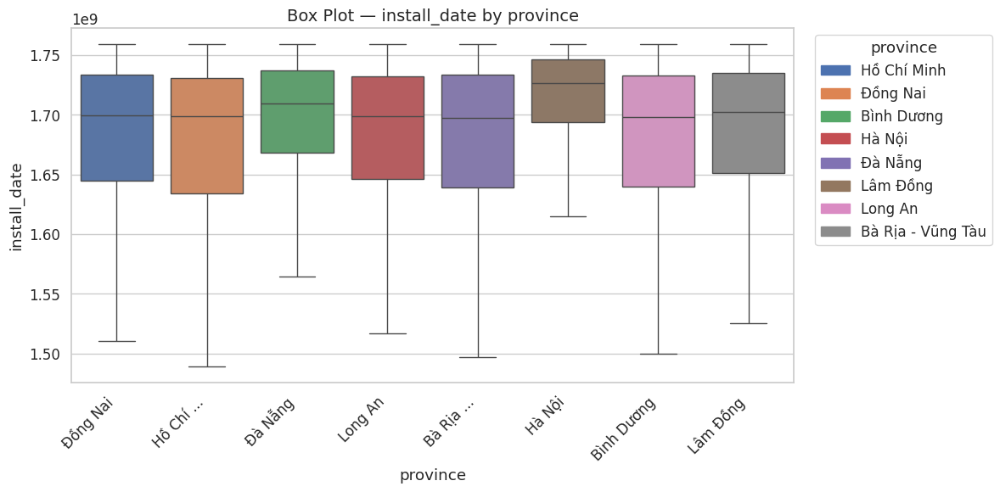


📊 Vẽ biểu đồ cho cặp: (membership, customer_id)


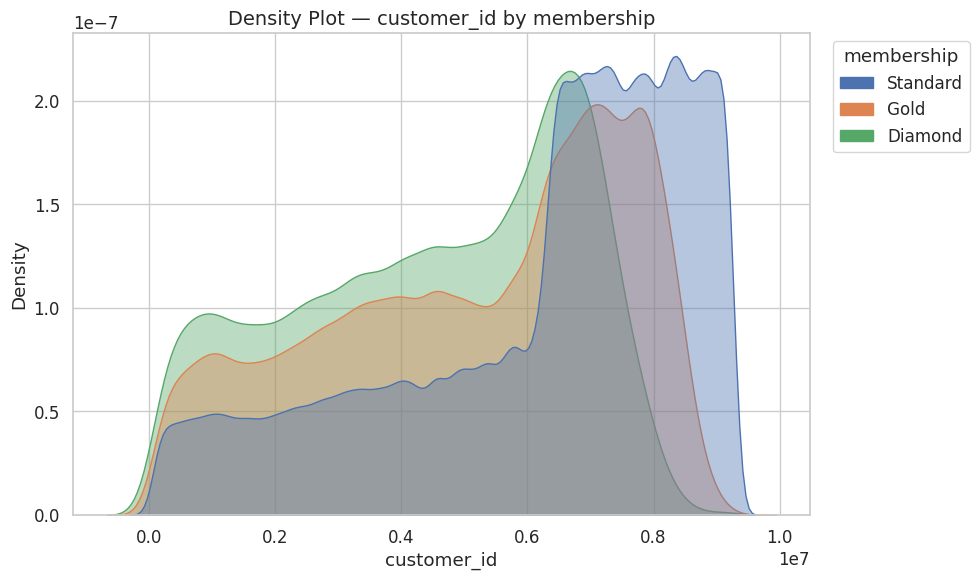

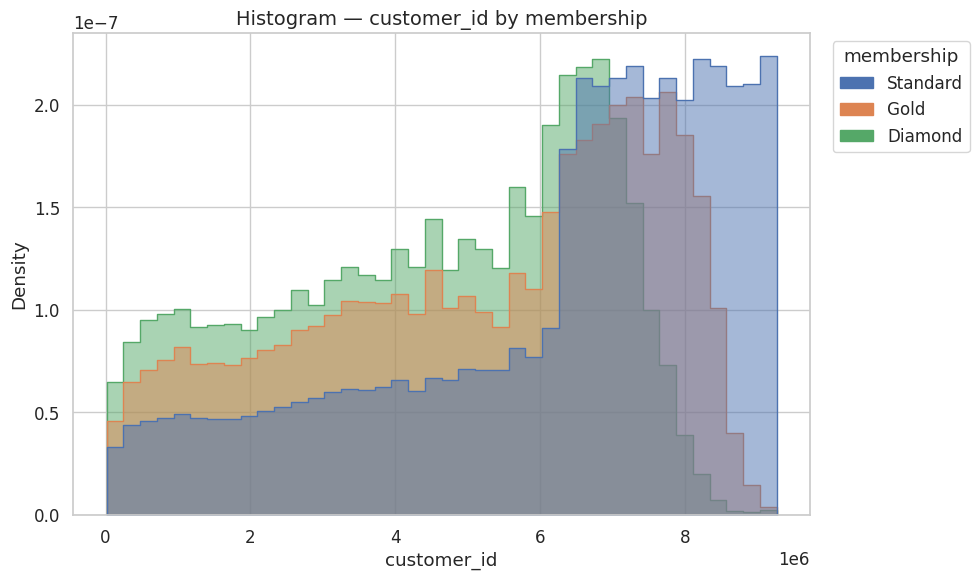

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


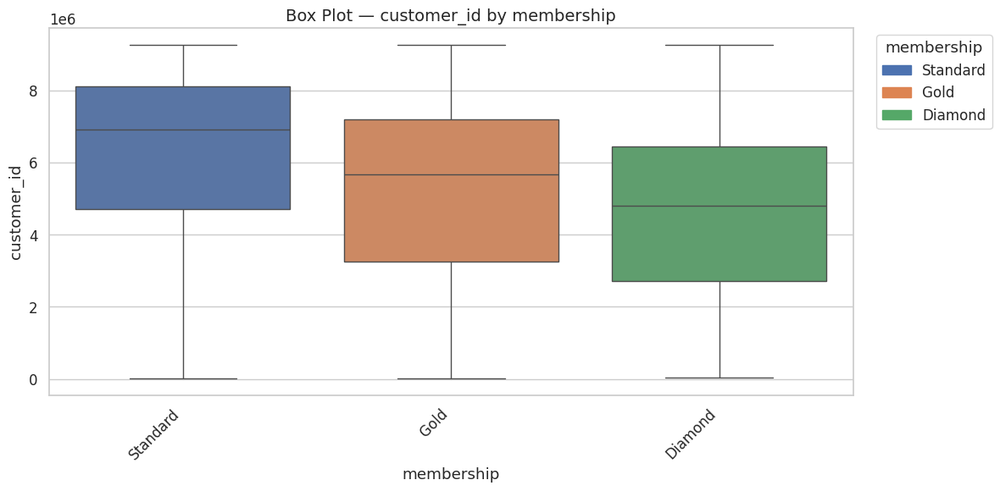


📊 Vẽ biểu đồ cho cặp: (membership, location)


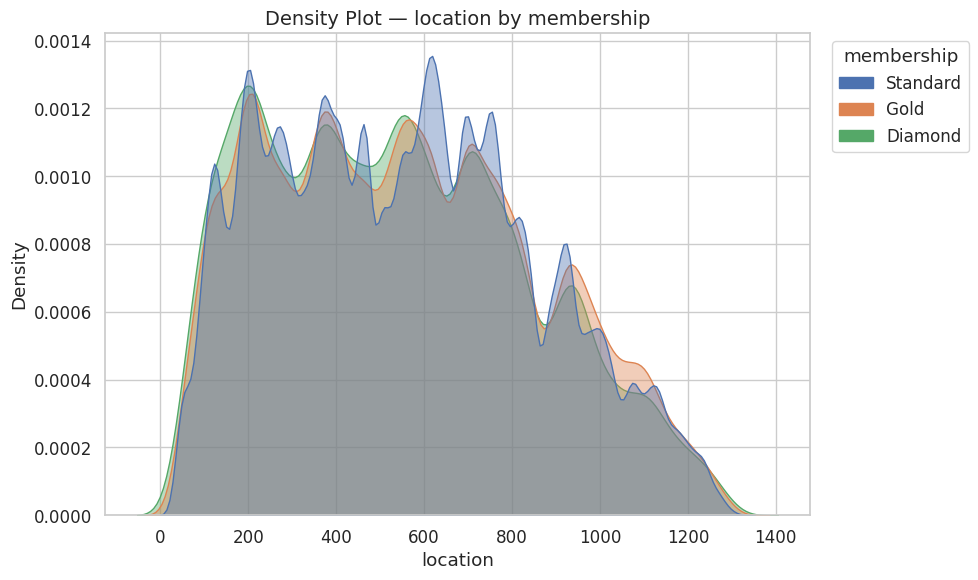

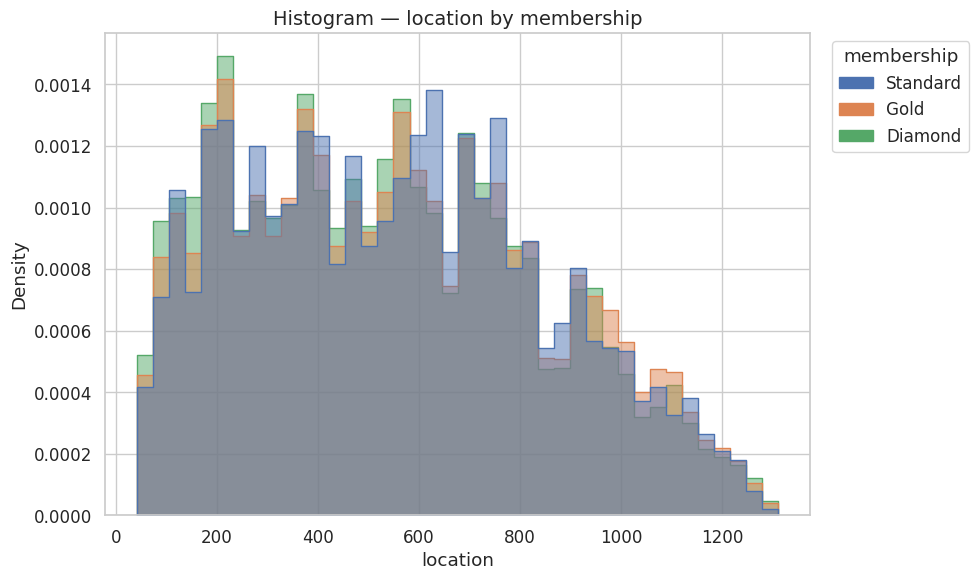

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


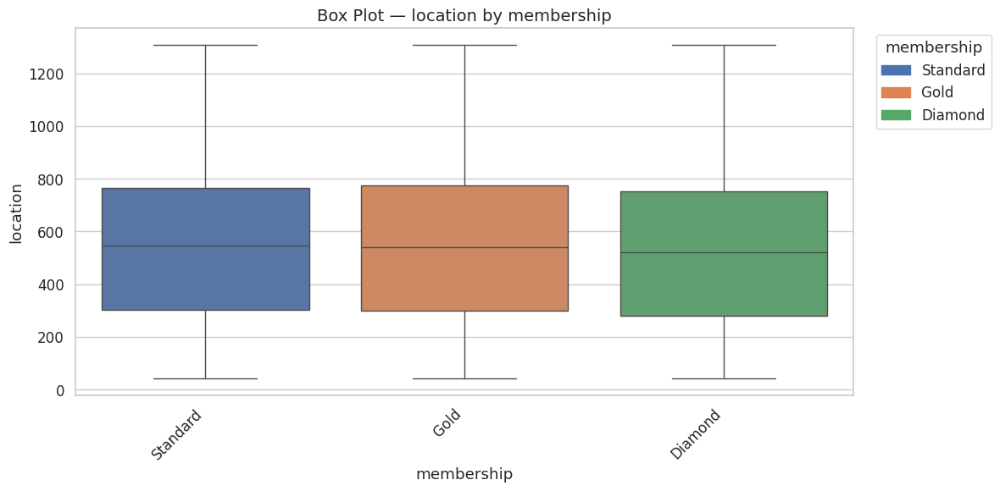


📊 Vẽ biểu đồ cho cặp: (membership, timestamp)


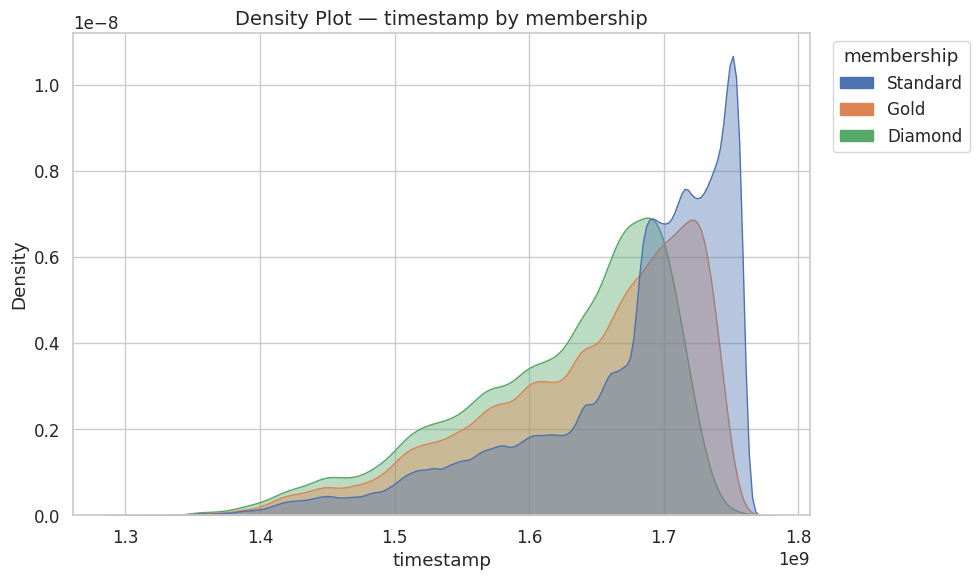

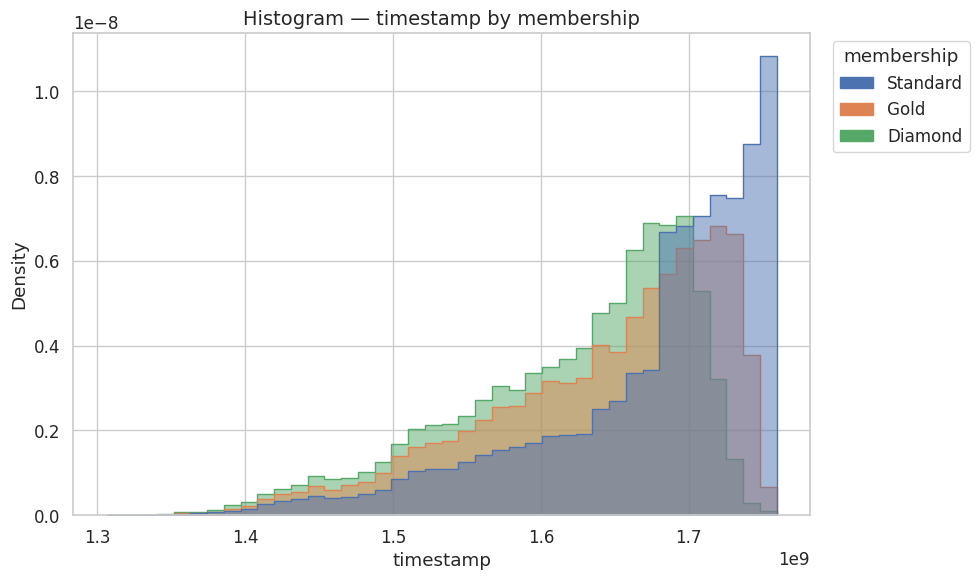

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


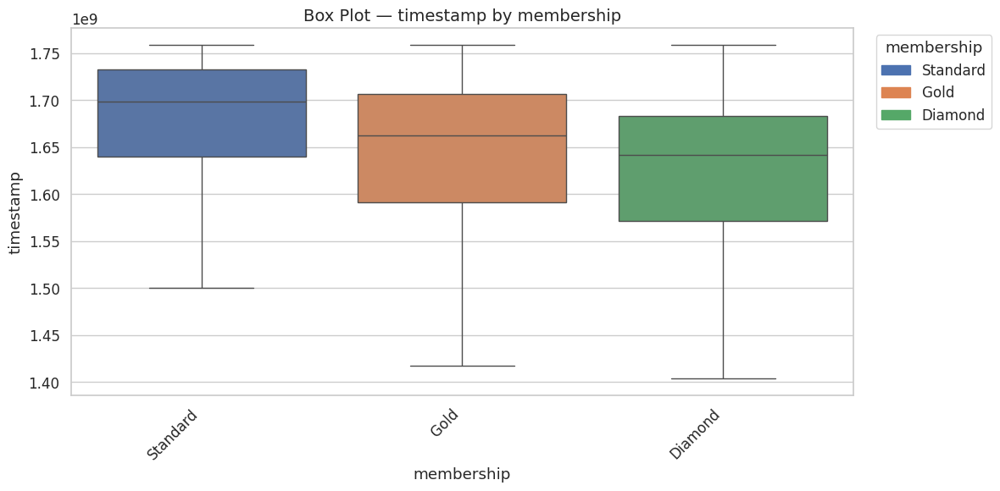


📊 Vẽ biểu đồ cho cặp: (membership, sync_status_id)


/tmp/ipykernel_2234233/31970007.py:59: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(


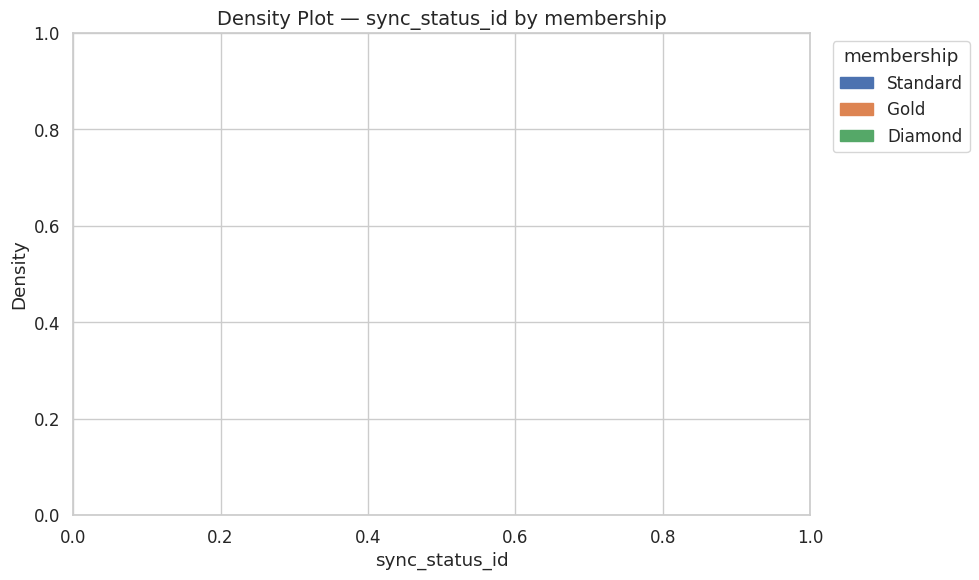

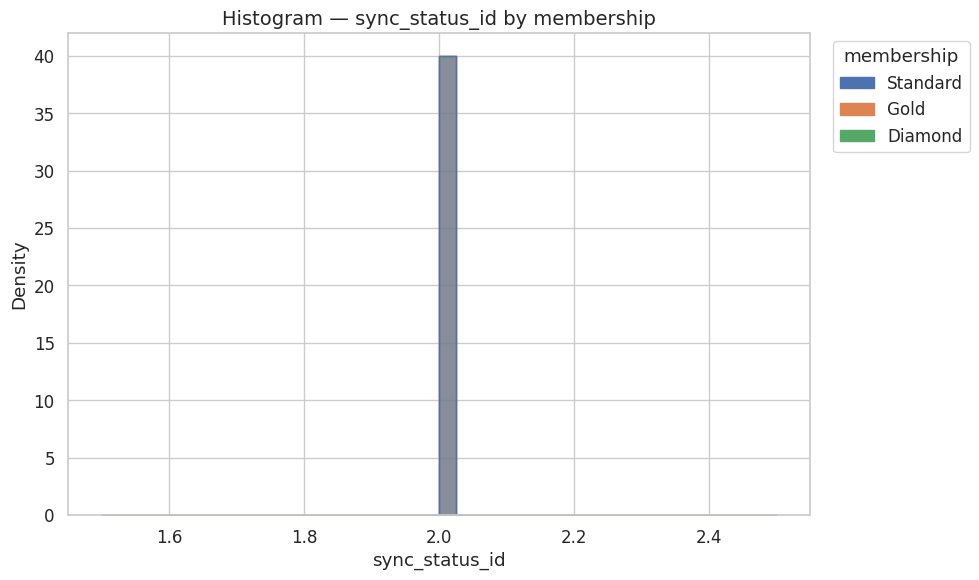

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


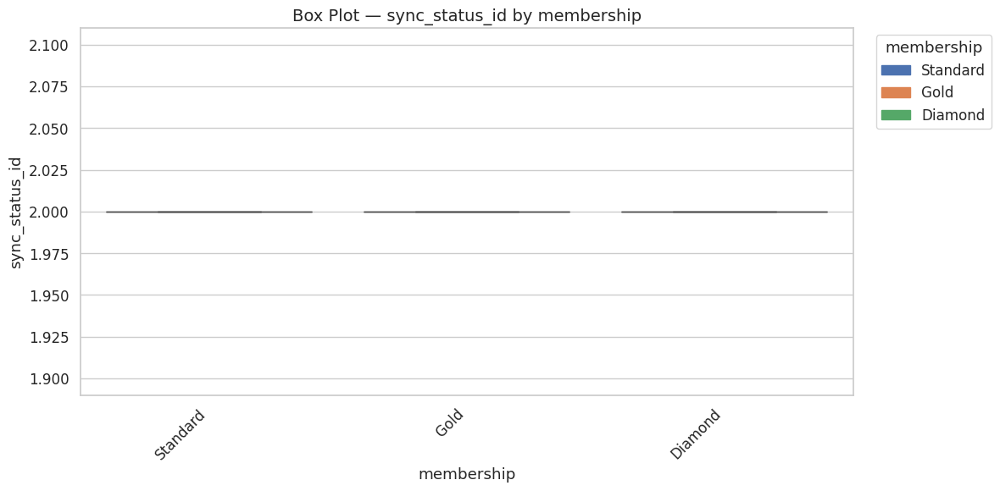


📊 Vẽ biểu đồ cho cặp: (membership, install_date)


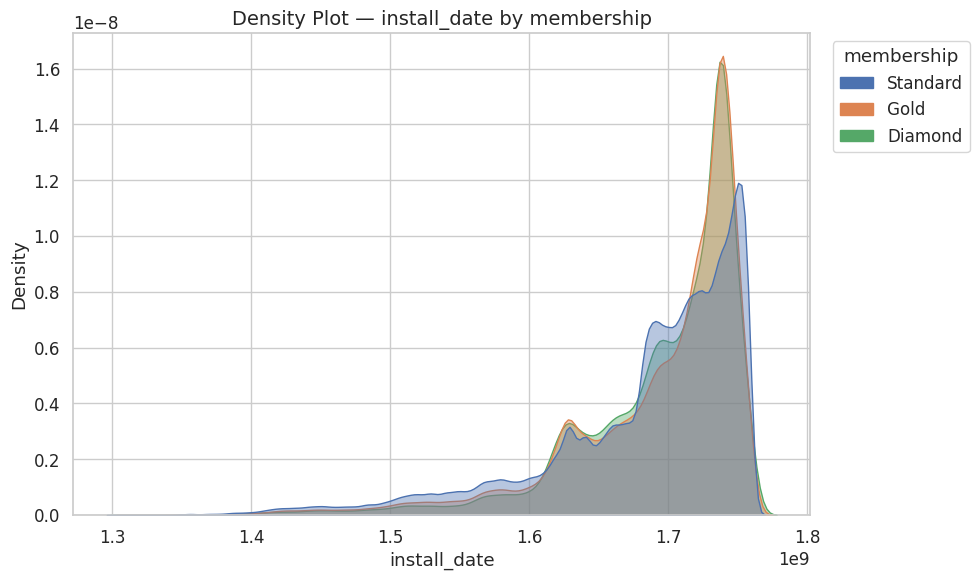

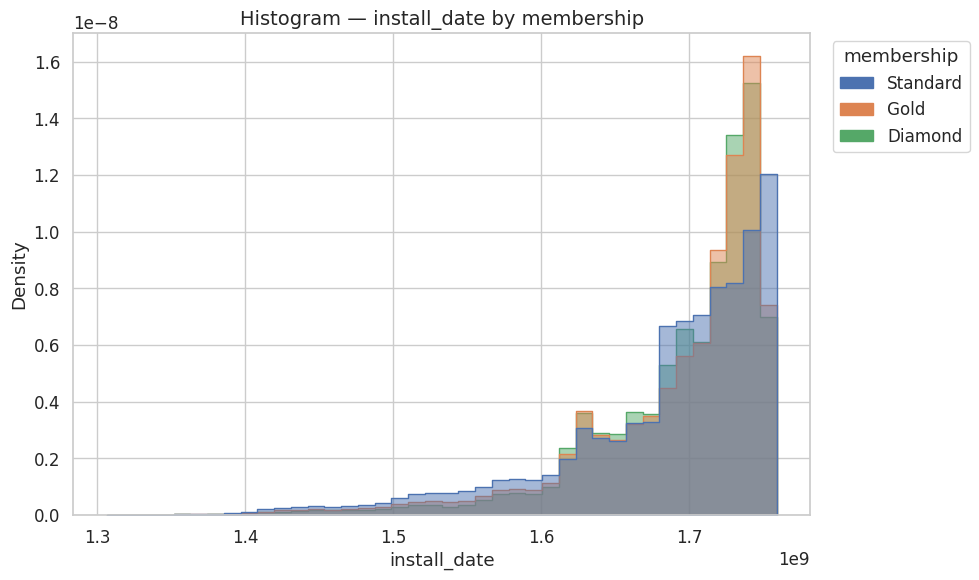

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


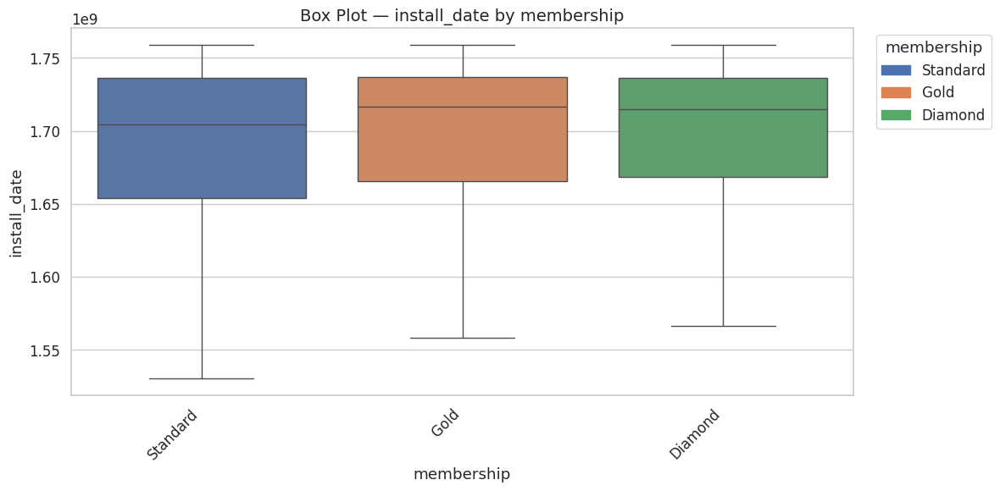


📊 Vẽ biểu đồ cho cặp: (sync_error_message, customer_id)
[⚠️] Không có dữ liệu hợp lệ cho (sync_error_message, customer_id)

📊 Vẽ biểu đồ cho cặp: (sync_error_message, location)
[⚠️] Không có dữ liệu hợp lệ cho (sync_error_message, location)

📊 Vẽ biểu đồ cho cặp: (sync_error_message, timestamp)
[⚠️] Không có dữ liệu hợp lệ cho (sync_error_message, timestamp)

📊 Vẽ biểu đồ cho cặp: (sync_error_message, sync_status_id)
[⚠️] Không có dữ liệu hợp lệ cho (sync_error_message, sync_status_id)

📊 Vẽ biểu đồ cho cặp: (sync_error_message, install_date)
[⚠️] Không có dữ liệu hợp lệ cho (sync_error_message, install_date)

📊 Vẽ biểu đồ cho cặp: (region, customer_id)


/tmp/ipykernel_2234233/31970007.py:59: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.kdeplot(


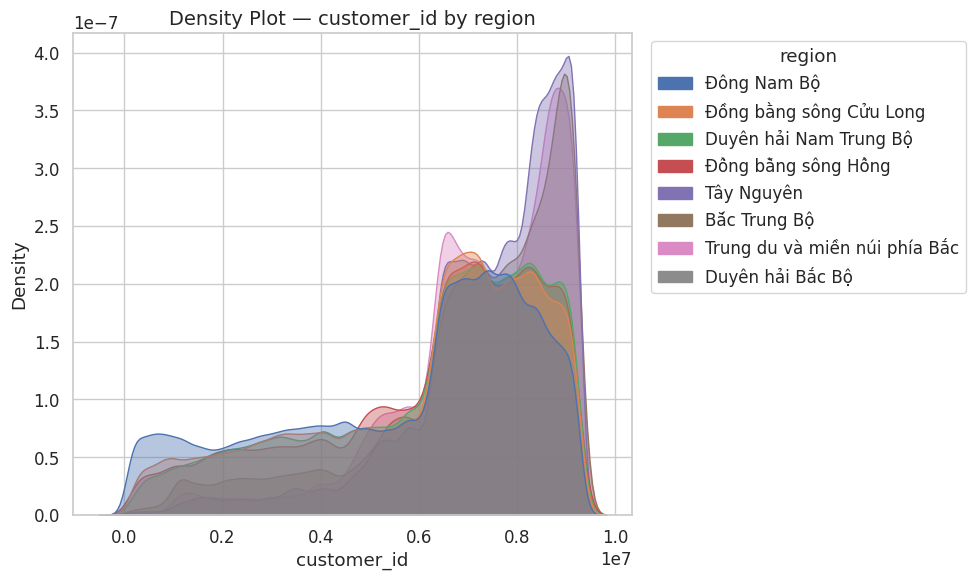

/tmp/ipykernel_2234233/31970007.py:82: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.histplot(


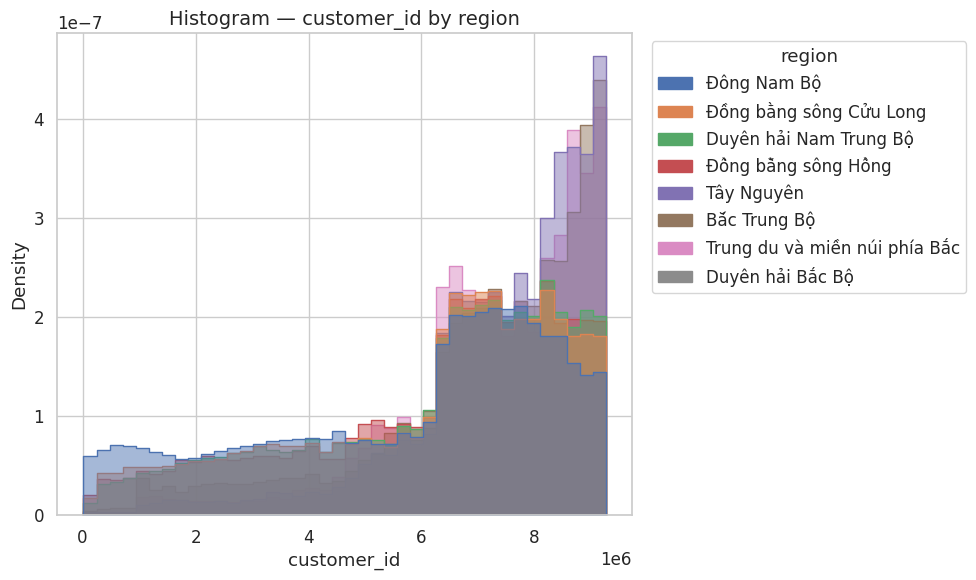

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(
/tmp/ipykernel_2234233/31970007.py:105: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.boxplot(


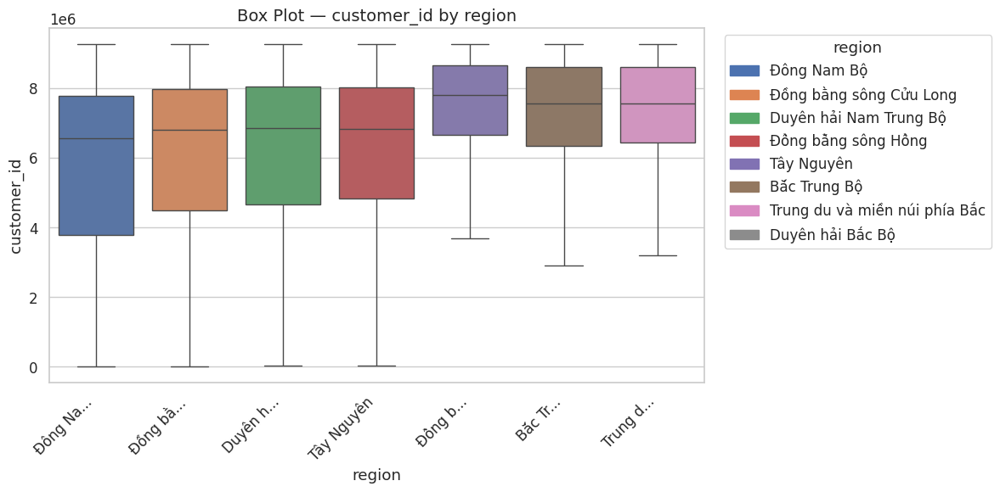


📊 Vẽ biểu đồ cho cặp: (region, location)


/tmp/ipykernel_2234233/31970007.py:59: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.kdeplot(


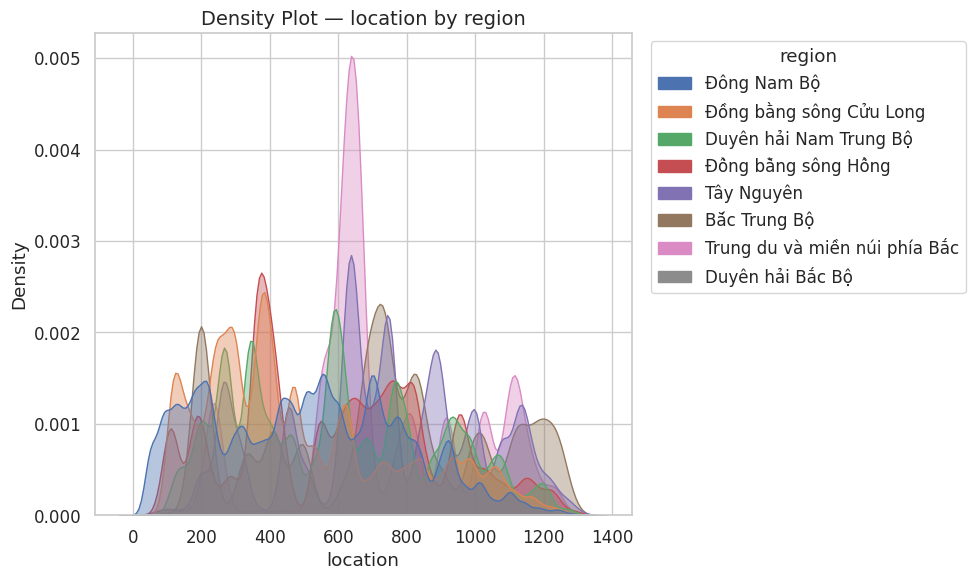

/tmp/ipykernel_2234233/31970007.py:82: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.histplot(


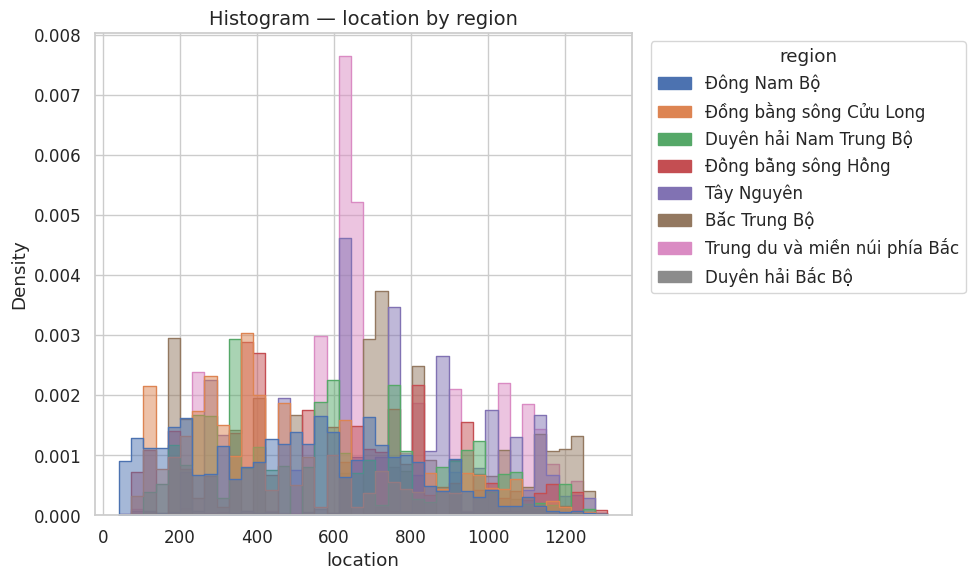

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(
/tmp/ipykernel_2234233/31970007.py:105: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.boxplot(


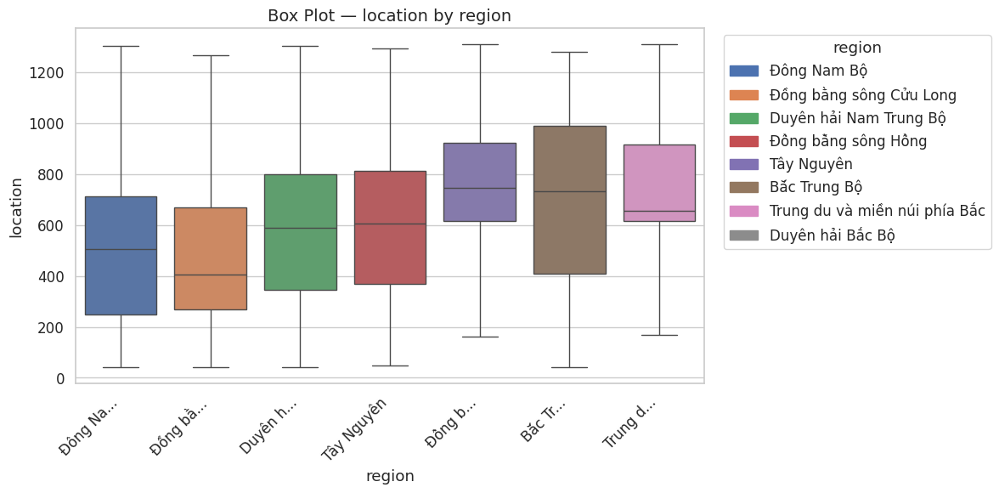


📊 Vẽ biểu đồ cho cặp: (region, timestamp)


/tmp/ipykernel_2234233/31970007.py:59: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.kdeplot(


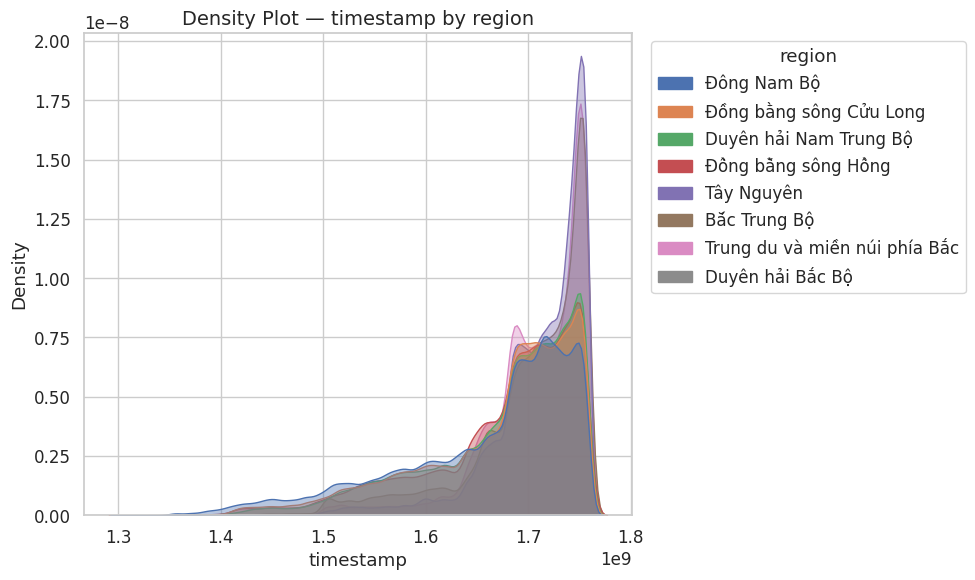

/tmp/ipykernel_2234233/31970007.py:82: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.histplot(


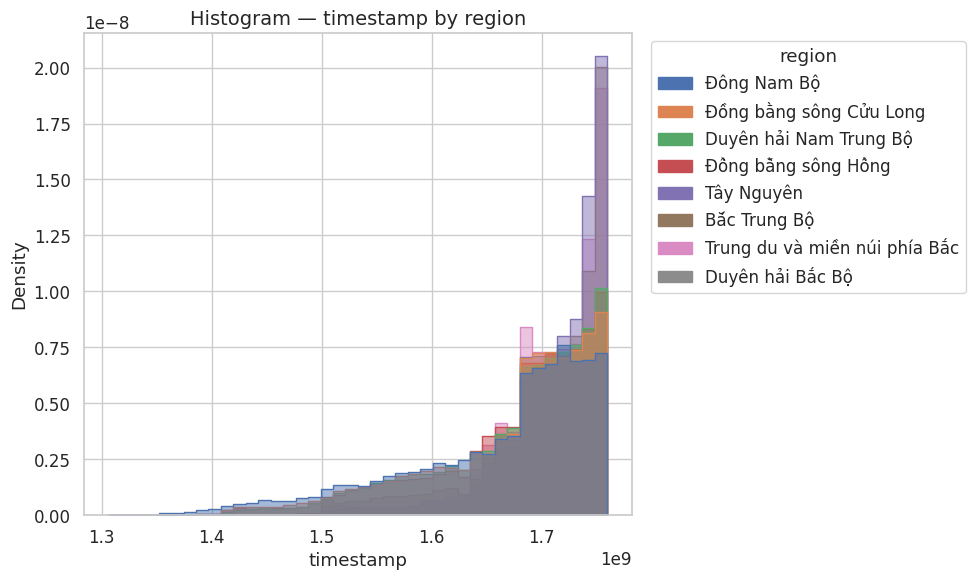

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(
/tmp/ipykernel_2234233/31970007.py:105: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.boxplot(


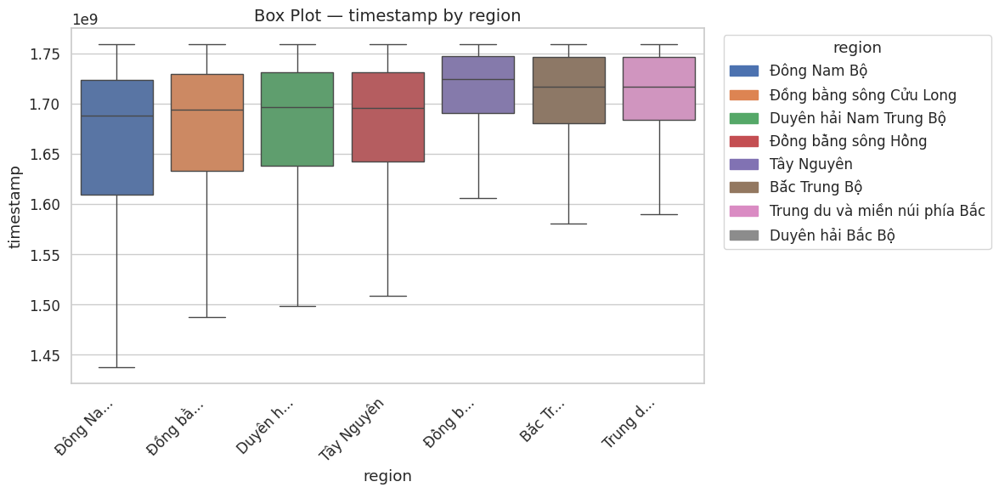


📊 Vẽ biểu đồ cho cặp: (region, sync_status_id)


/tmp/ipykernel_2234233/31970007.py:59: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.kdeplot(
/tmp/ipykernel_2234233/31970007.py:59: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(


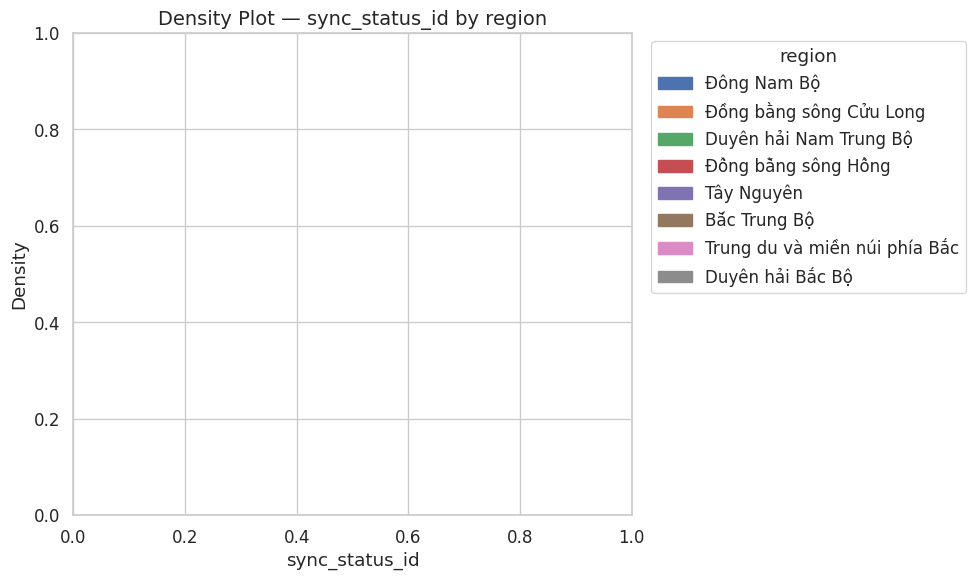

/tmp/ipykernel_2234233/31970007.py:82: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.histplot(


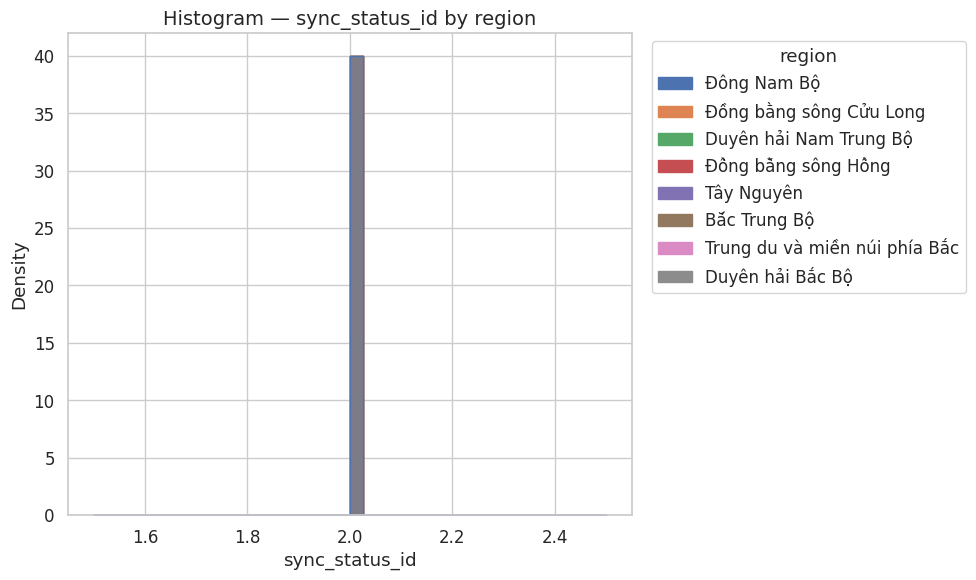

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(
/tmp/ipykernel_2234233/31970007.py:105: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.boxplot(


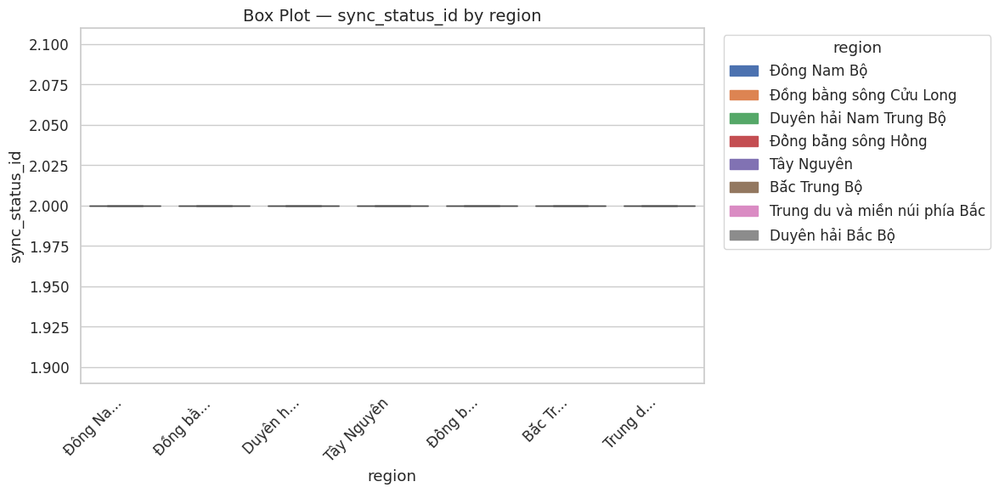


📊 Vẽ biểu đồ cho cặp: (region, install_date)


/tmp/ipykernel_2234233/31970007.py:59: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.kdeplot(


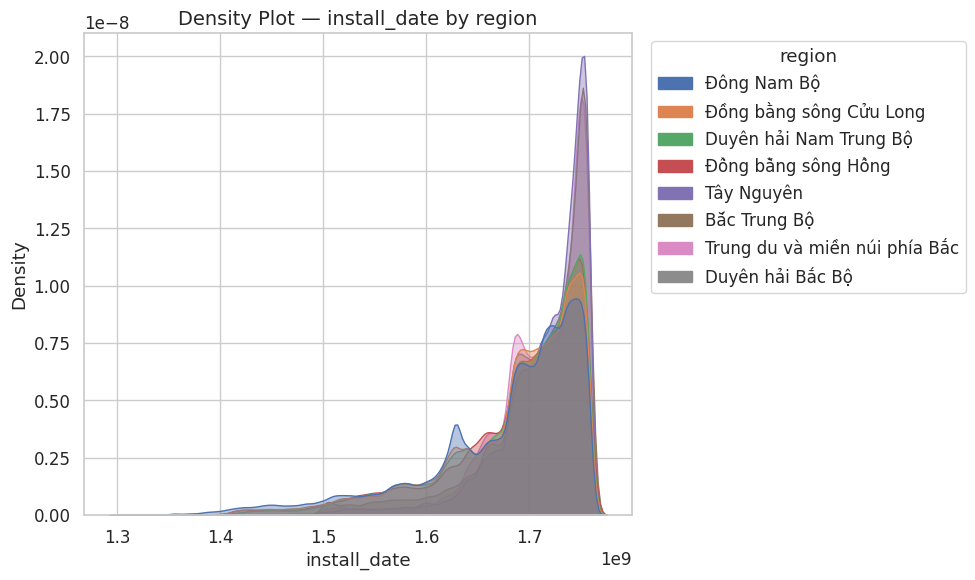

/tmp/ipykernel_2234233/31970007.py:82: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.histplot(


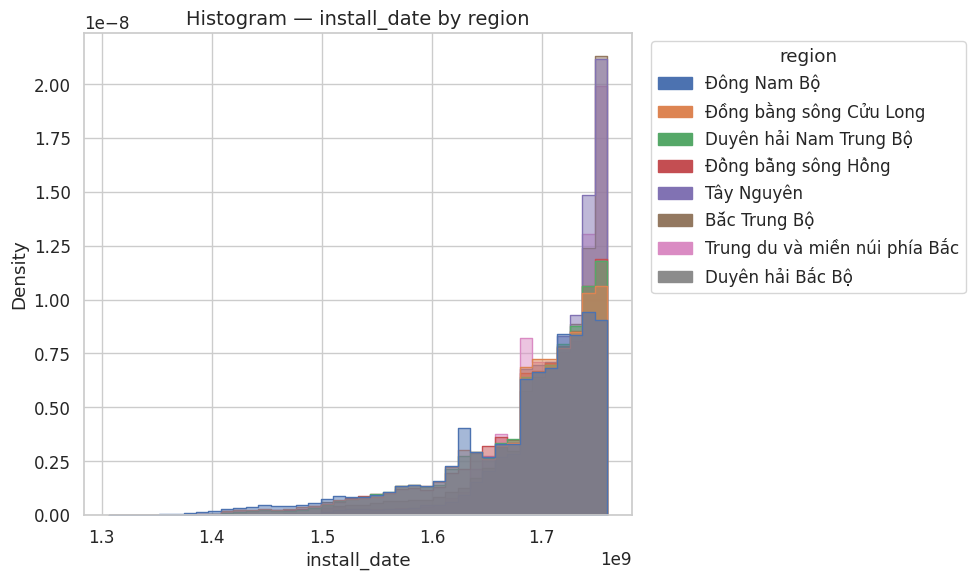

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(
/tmp/ipykernel_2234233/31970007.py:105: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.boxplot(


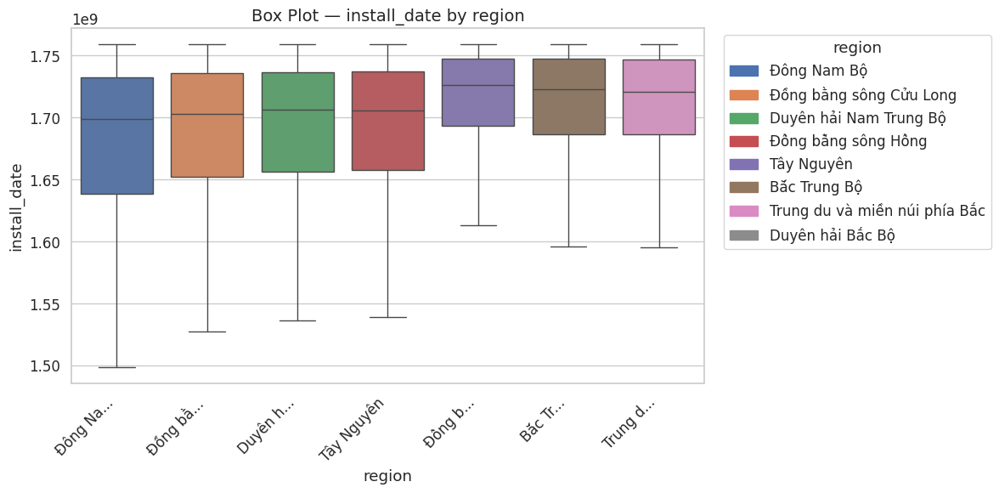


📊 Vẽ biểu đồ cho cặp: (location_name, customer_id)


/tmp/ipykernel_2234233/31970007.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))
/tmp/ipykernel_2234233/31970007.py:59: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.kdeplot(


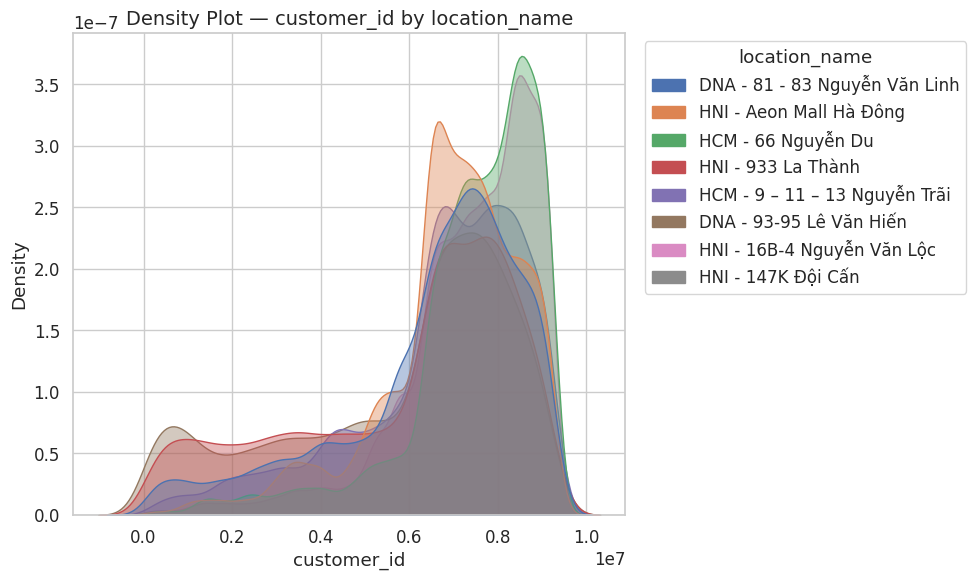

/tmp/ipykernel_2234233/31970007.py:82: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.histplot(


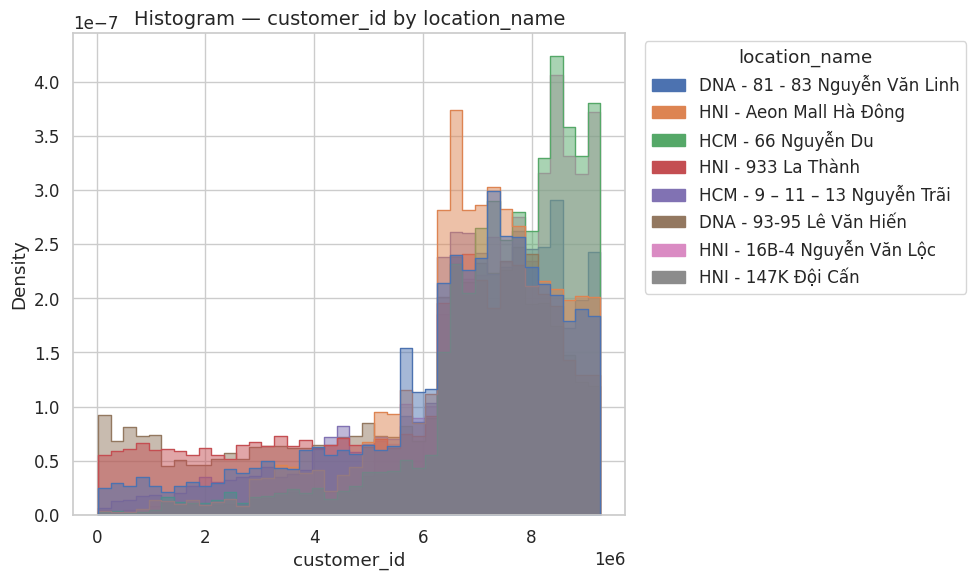

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(
/tmp/ipykernel_2234233/31970007.py:105: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.boxplot(


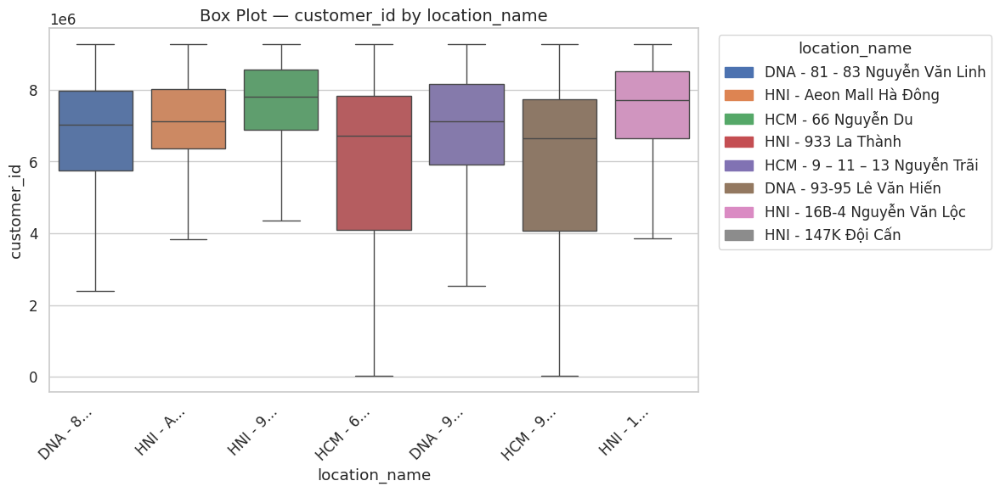


📊 Vẽ biểu đồ cho cặp: (location_name, location)


/tmp/ipykernel_2234233/31970007.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))
/tmp/ipykernel_2234233/31970007.py:59: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.kdeplot(
/tmp/ipykernel_2234233/31970007.py:59: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(


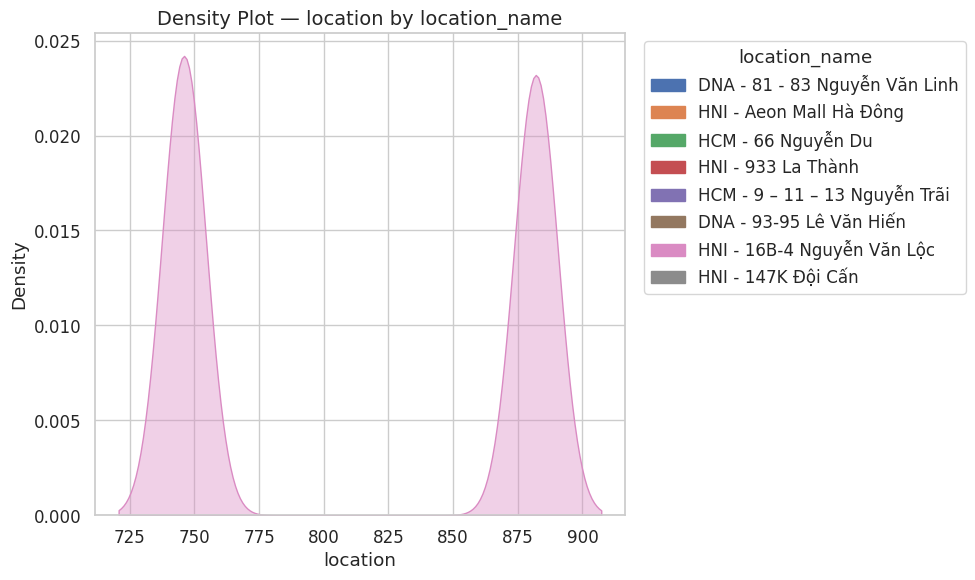

/tmp/ipykernel_2234233/31970007.py:82: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.histplot(


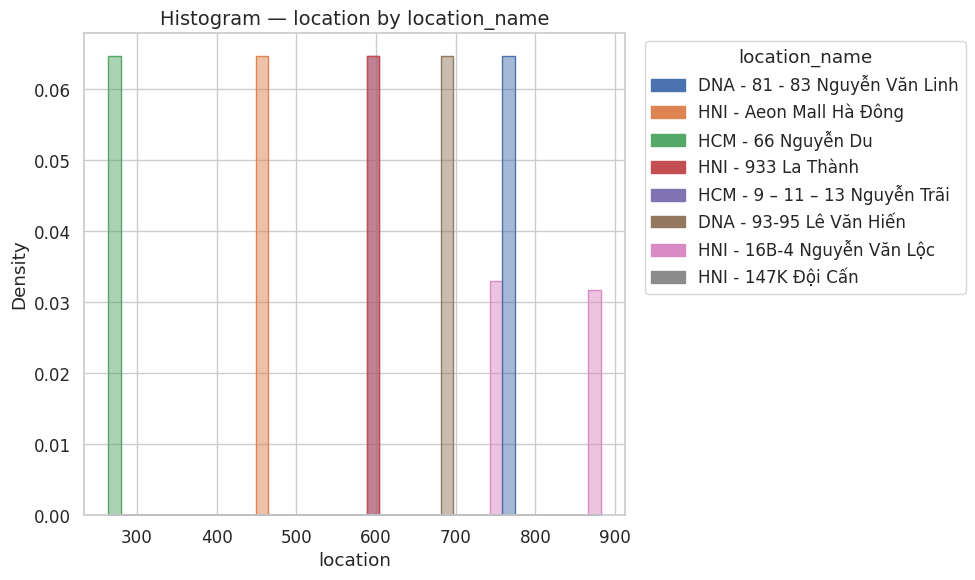

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(
/tmp/ipykernel_2234233/31970007.py:105: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.boxplot(


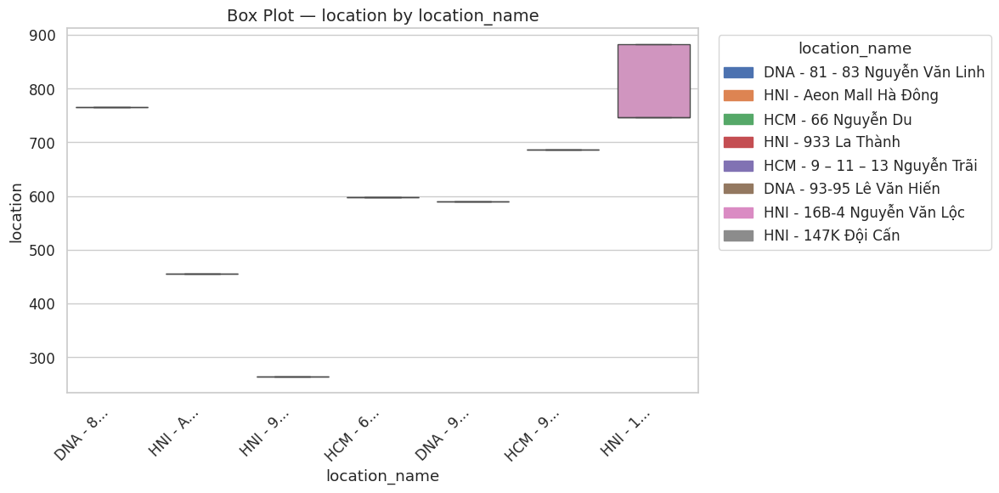


📊 Vẽ biểu đồ cho cặp: (location_name, timestamp)


/tmp/ipykernel_2234233/31970007.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))
/tmp/ipykernel_2234233/31970007.py:59: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.kdeplot(


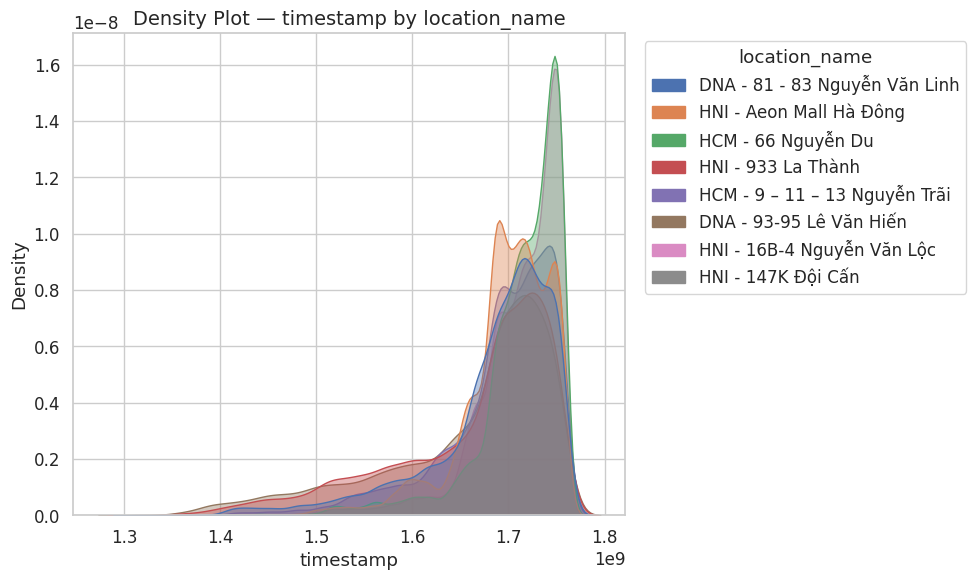

/tmp/ipykernel_2234233/31970007.py:82: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.histplot(


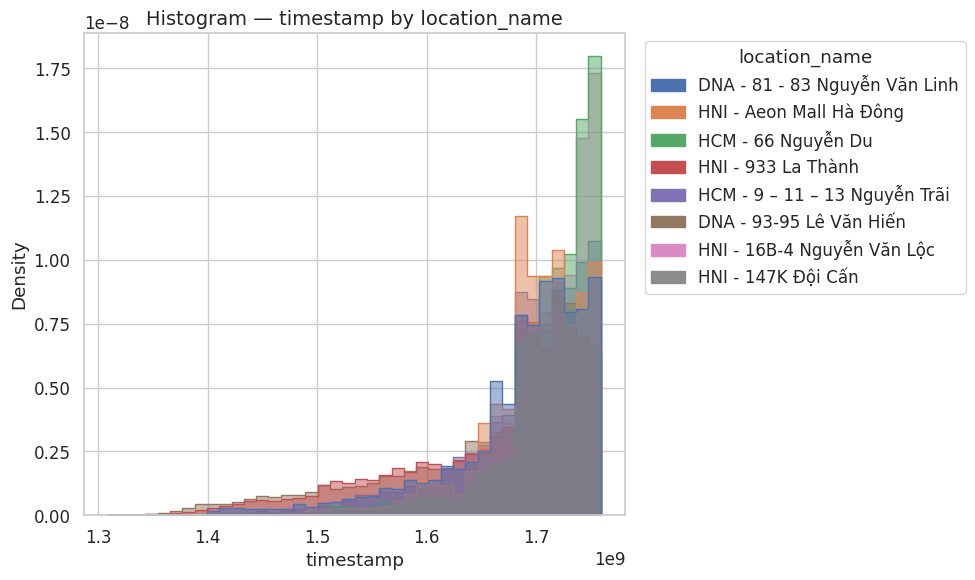

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(
/tmp/ipykernel_2234233/31970007.py:105: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.boxplot(


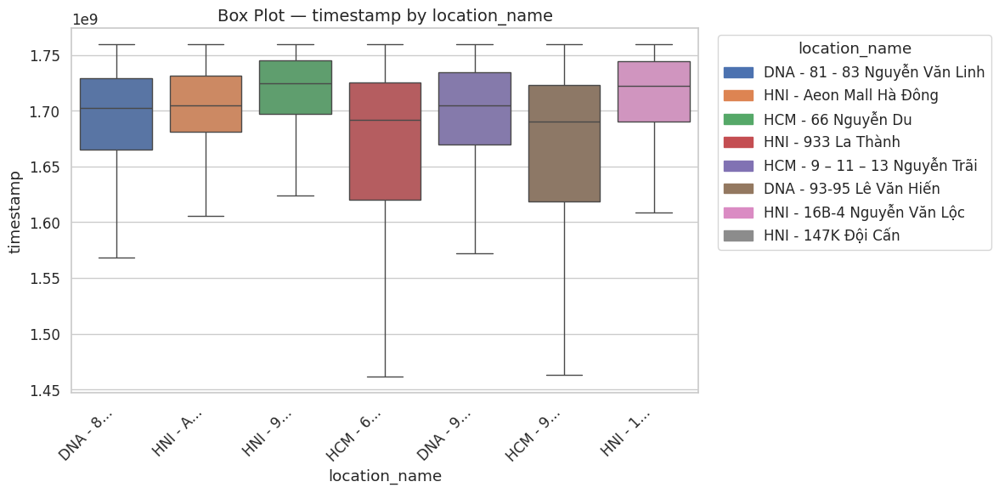


📊 Vẽ biểu đồ cho cặp: (location_name, sync_status_id)


/tmp/ipykernel_2234233/31970007.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))
/tmp/ipykernel_2234233/31970007.py:59: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(


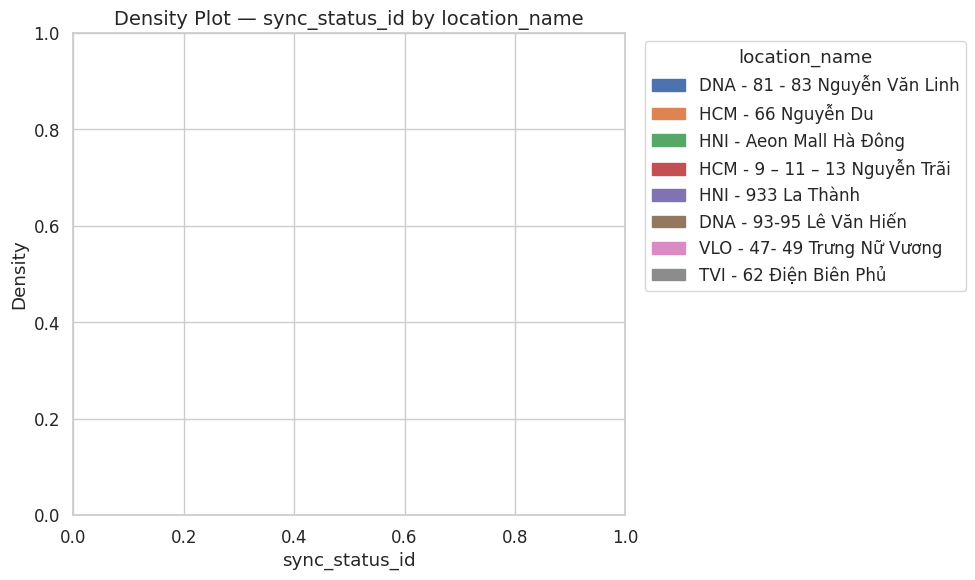

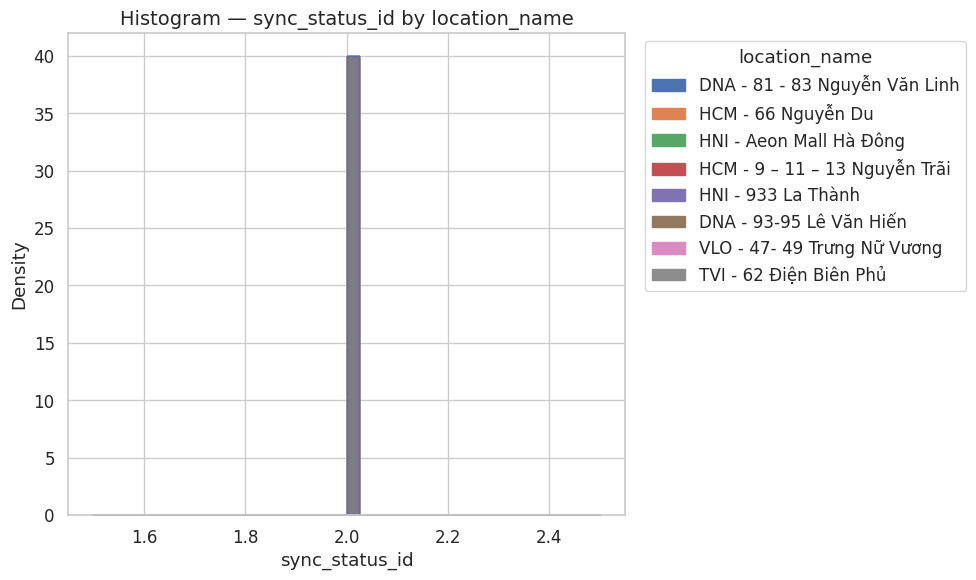

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


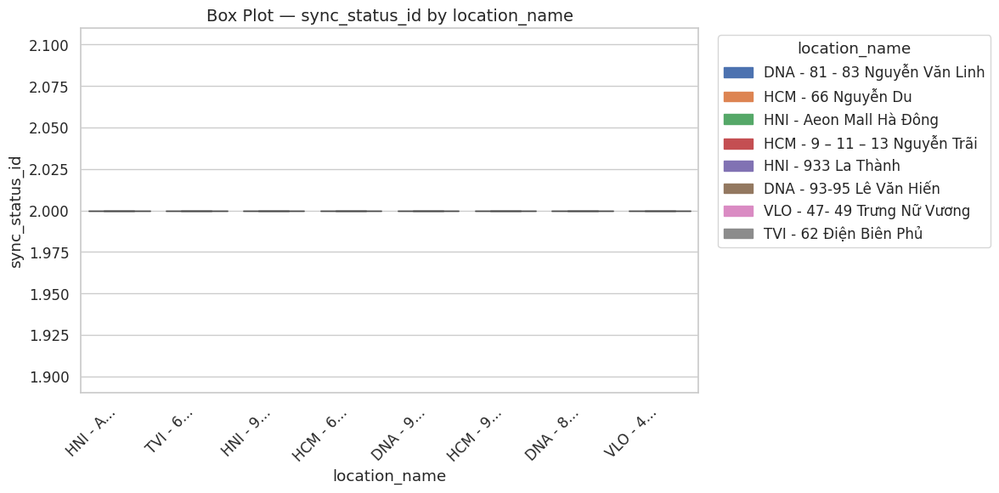


📊 Vẽ biểu đồ cho cặp: (location_name, install_date)


/tmp/ipykernel_2234233/31970007.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))
/tmp/ipykernel_2234233/31970007.py:59: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.kdeplot(


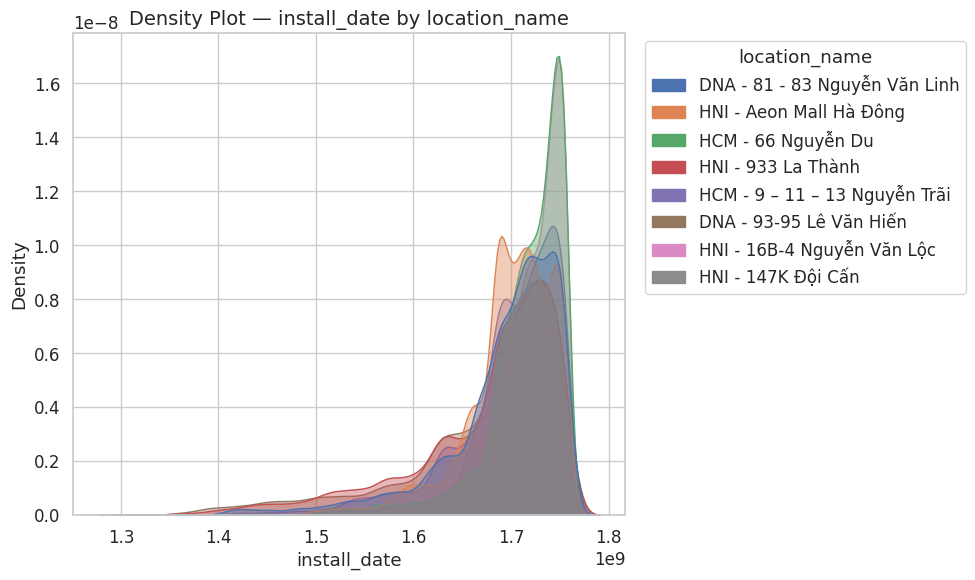

/tmp/ipykernel_2234233/31970007.py:82: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.histplot(


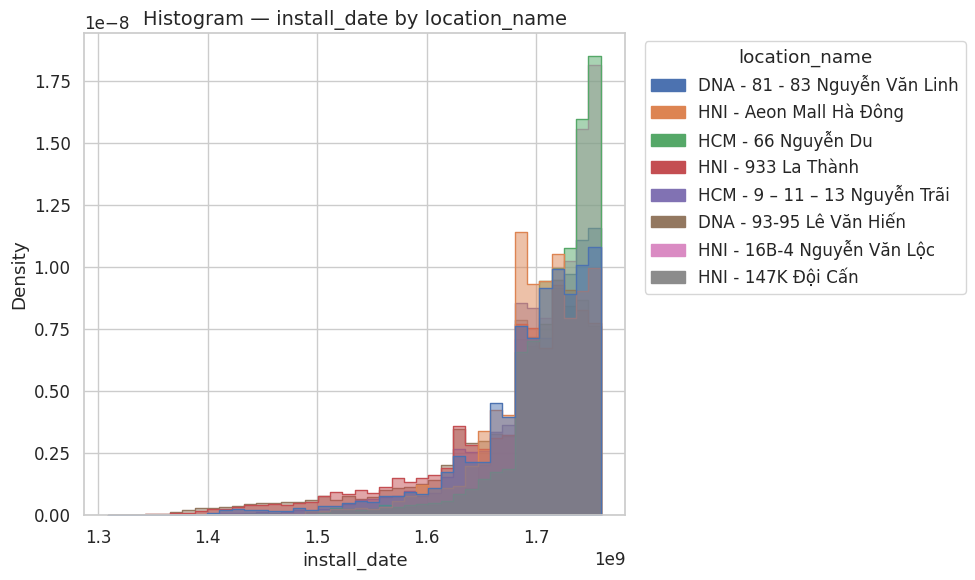

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(
/tmp/ipykernel_2234233/31970007.py:105: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.boxplot(


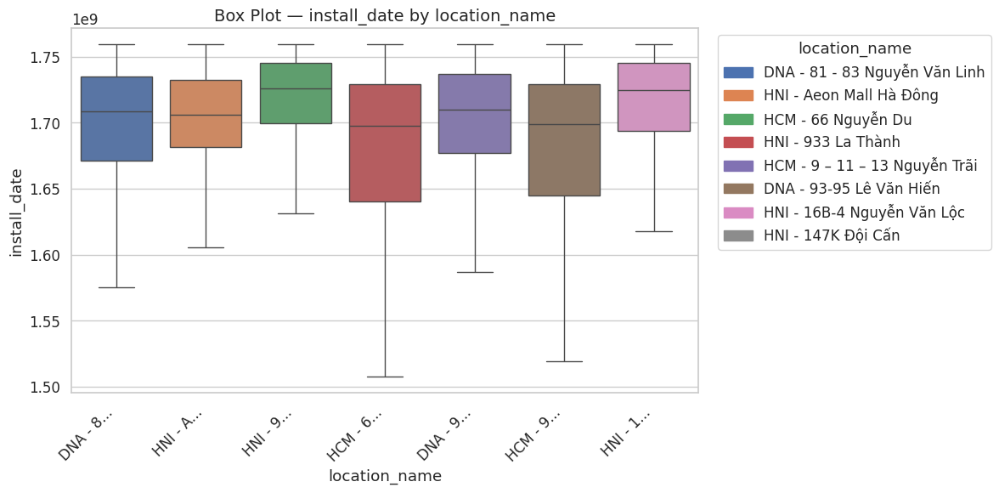


📊 Vẽ biểu đồ cho cặp: (install_app, customer_id)


/tmp/ipykernel_2234233/31970007.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))


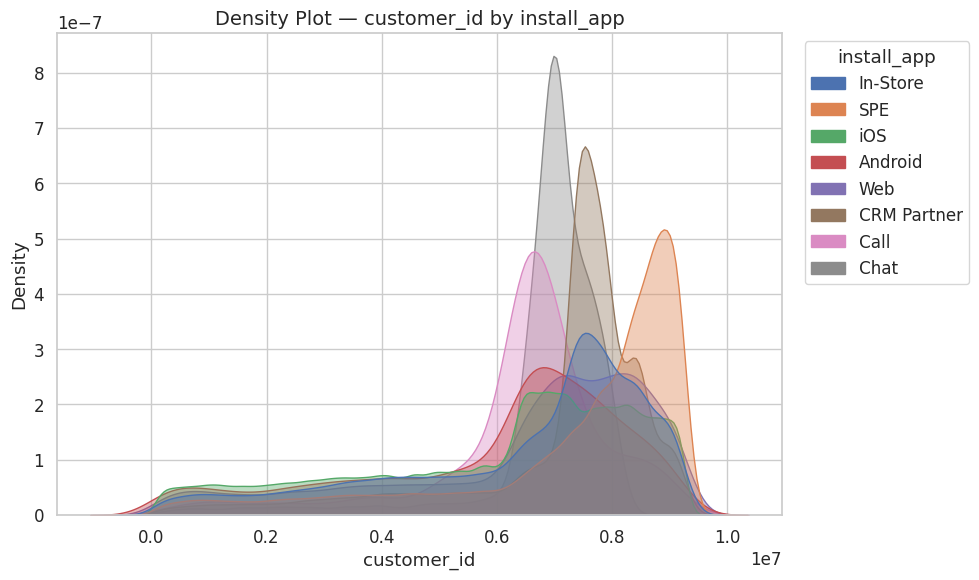

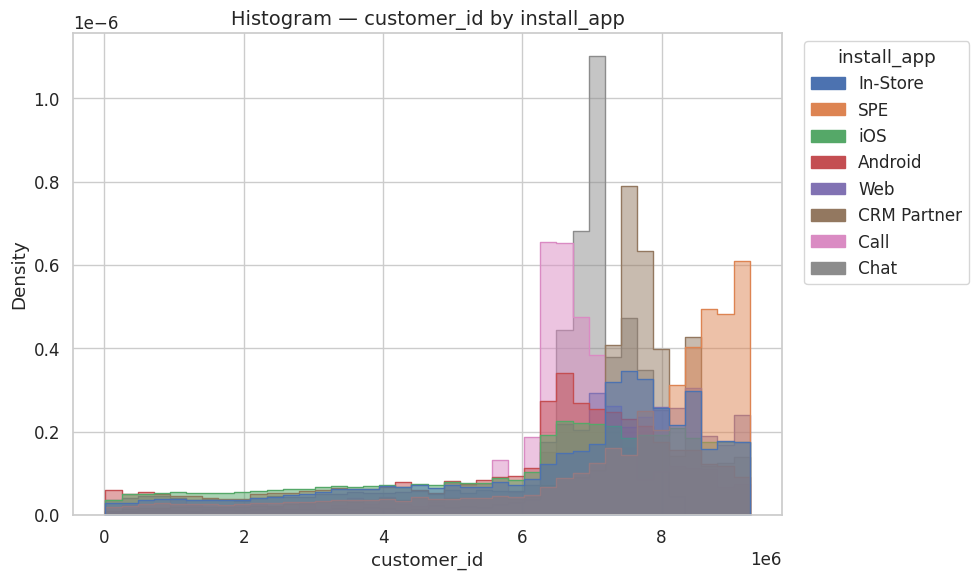

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


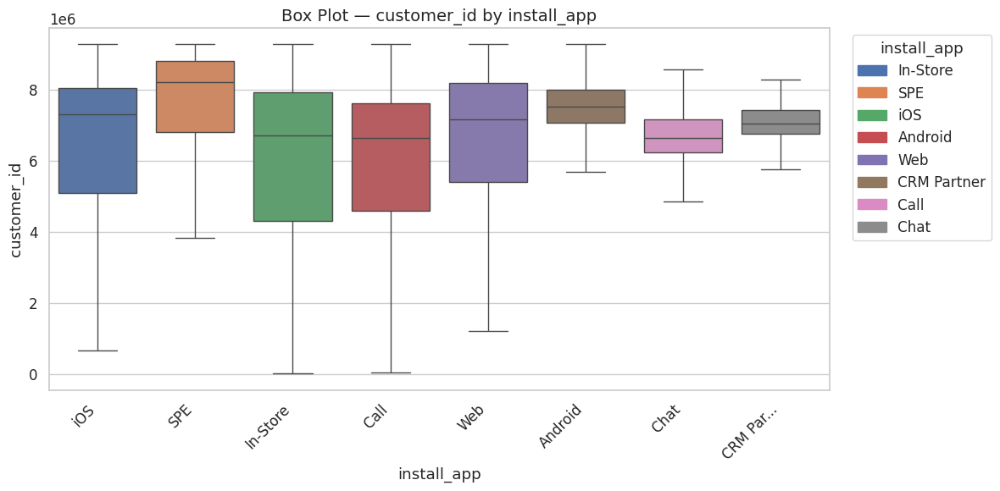


📊 Vẽ biểu đồ cho cặp: (install_app, location)


/tmp/ipykernel_2234233/31970007.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))


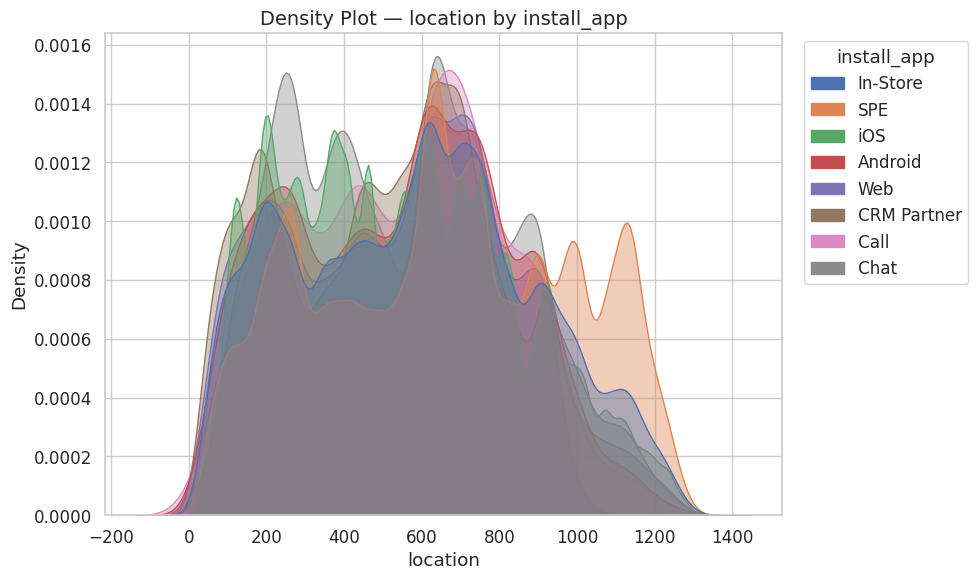

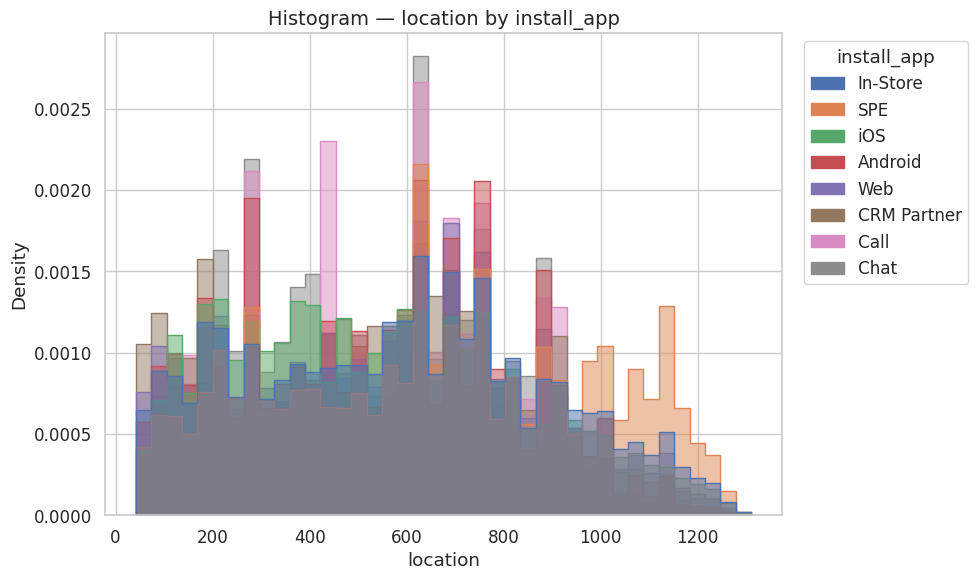

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


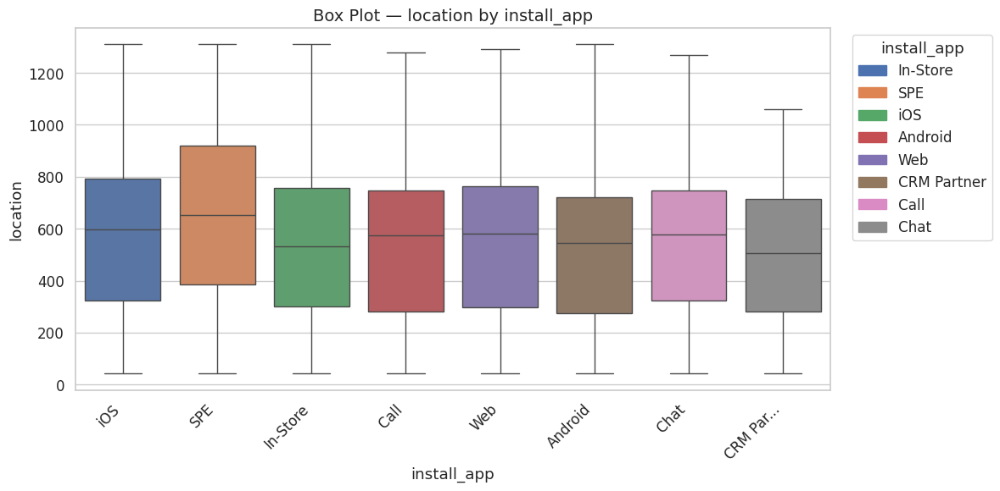


📊 Vẽ biểu đồ cho cặp: (install_app, timestamp)


/tmp/ipykernel_2234233/31970007.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))


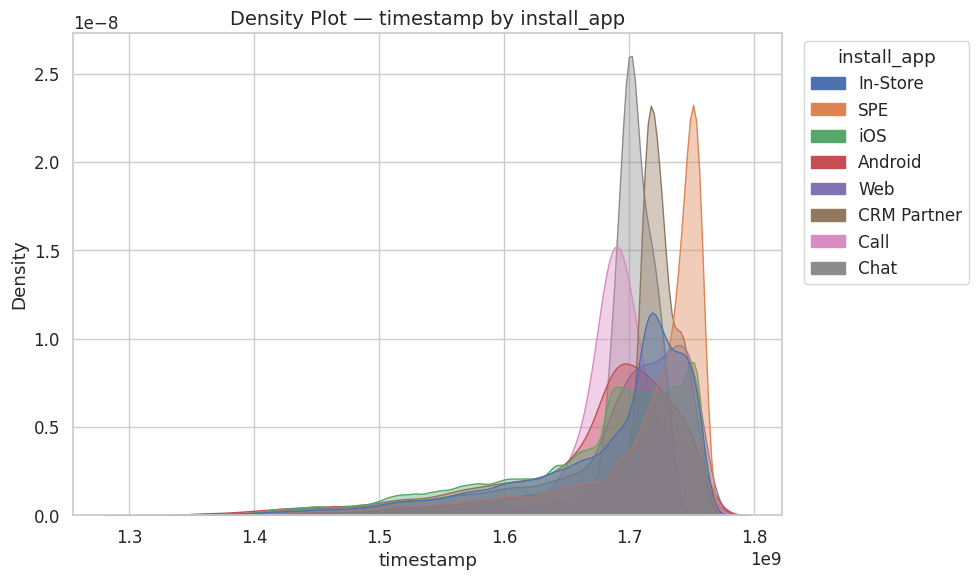

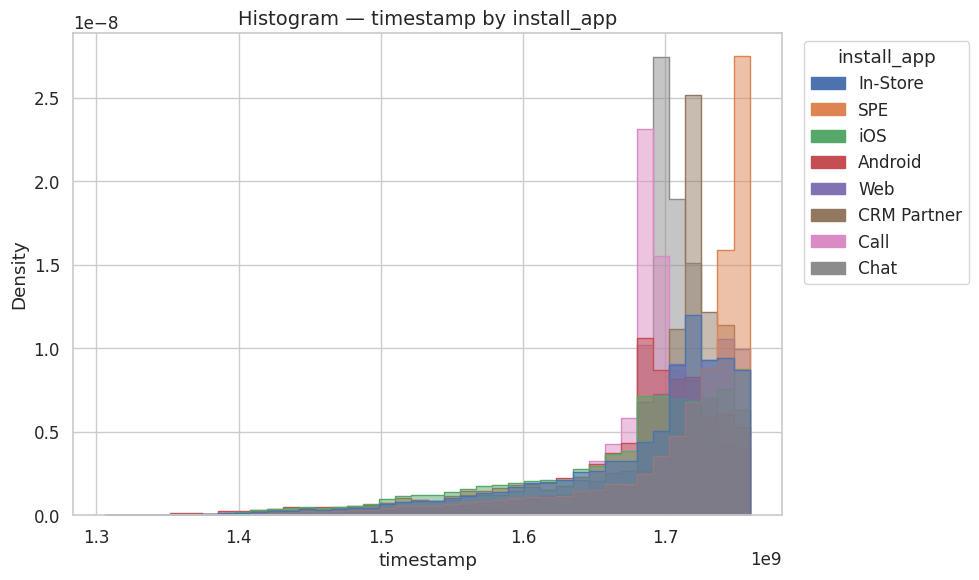

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


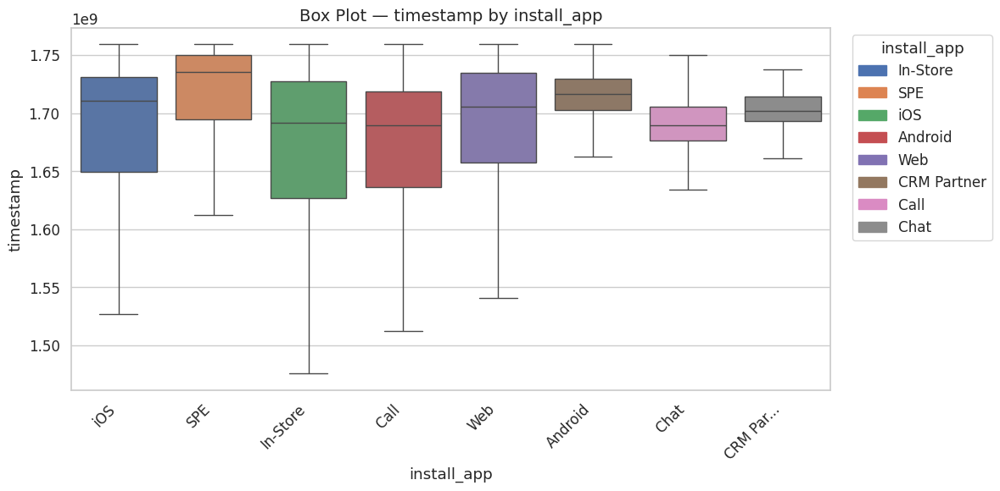


📊 Vẽ biểu đồ cho cặp: (install_app, sync_status_id)


/tmp/ipykernel_2234233/31970007.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))
/tmp/ipykernel_2234233/31970007.py:59: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(


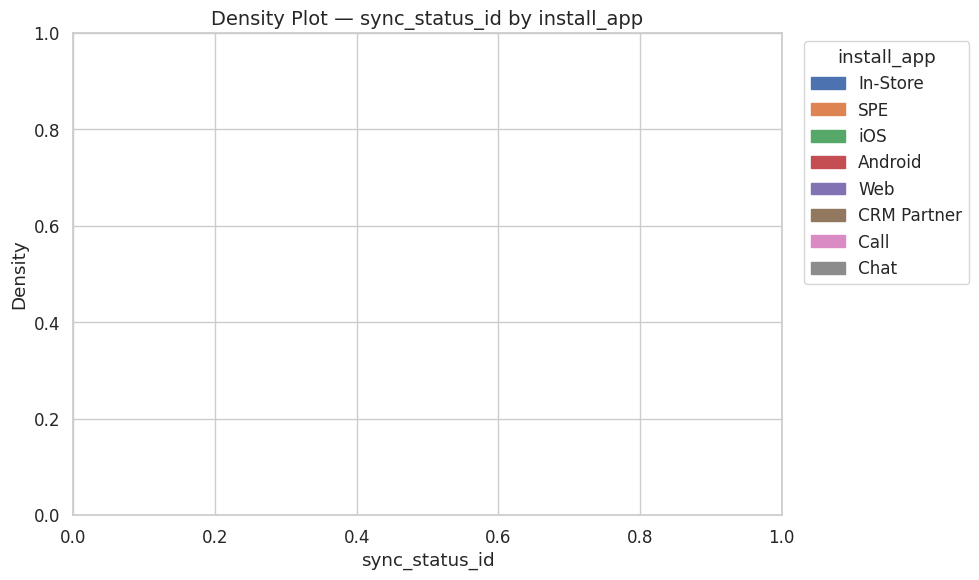

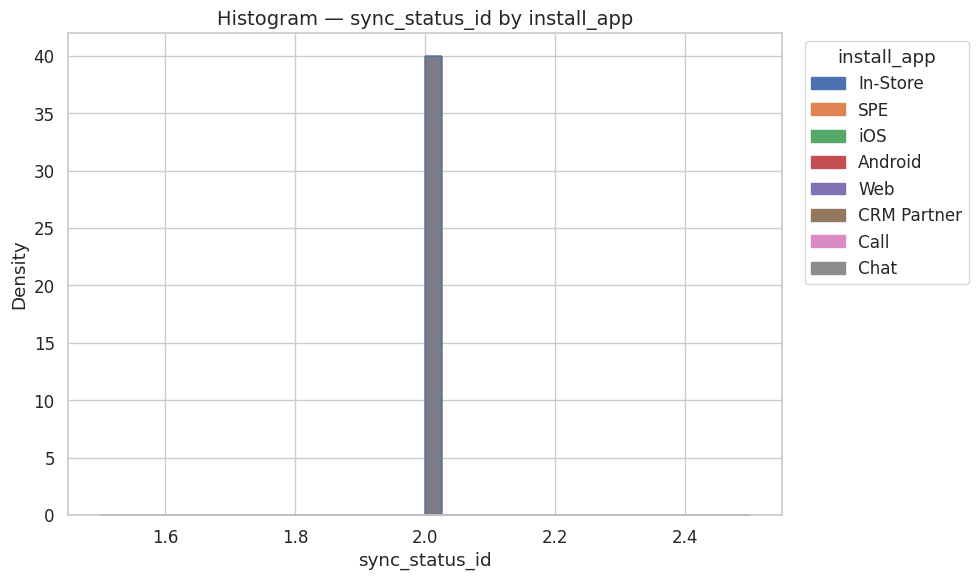

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


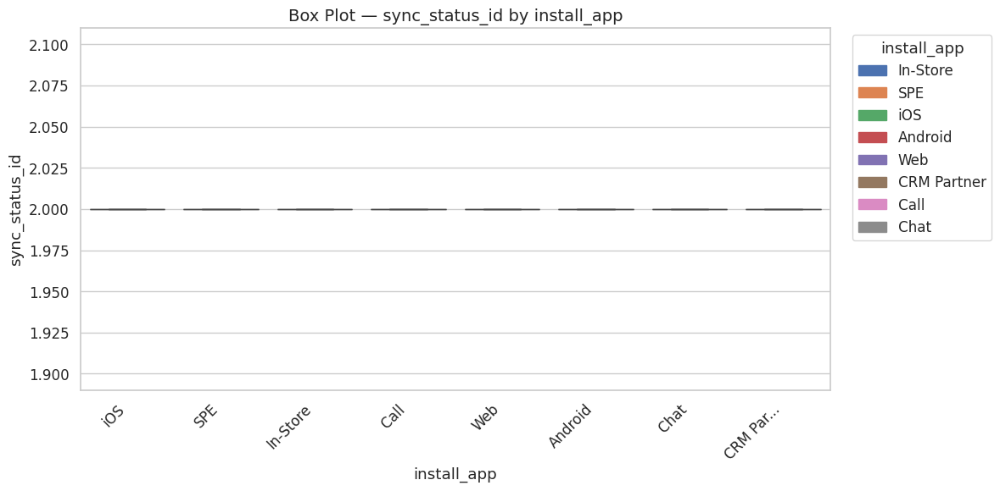


📊 Vẽ biểu đồ cho cặp: (install_app, install_date)


/tmp/ipykernel_2234233/31970007.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))


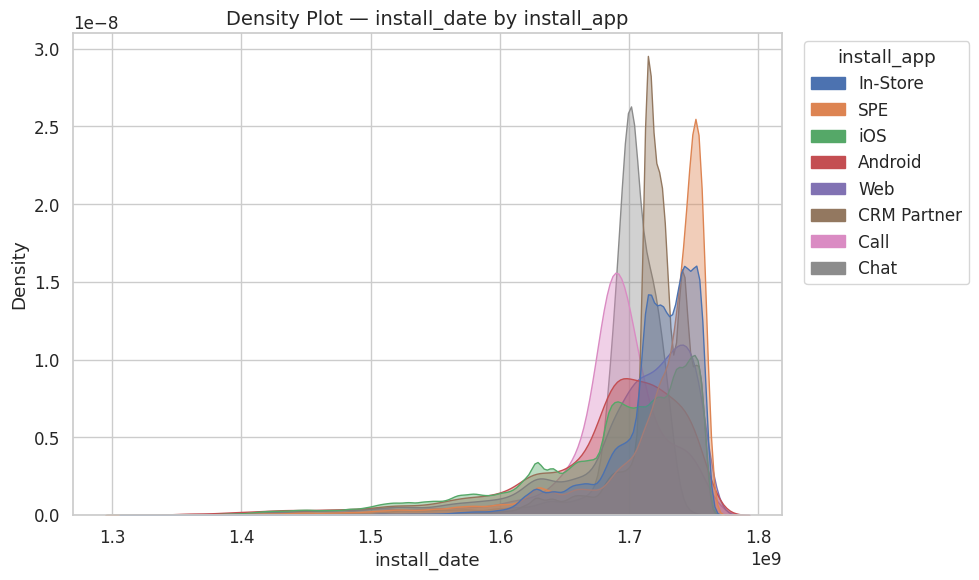

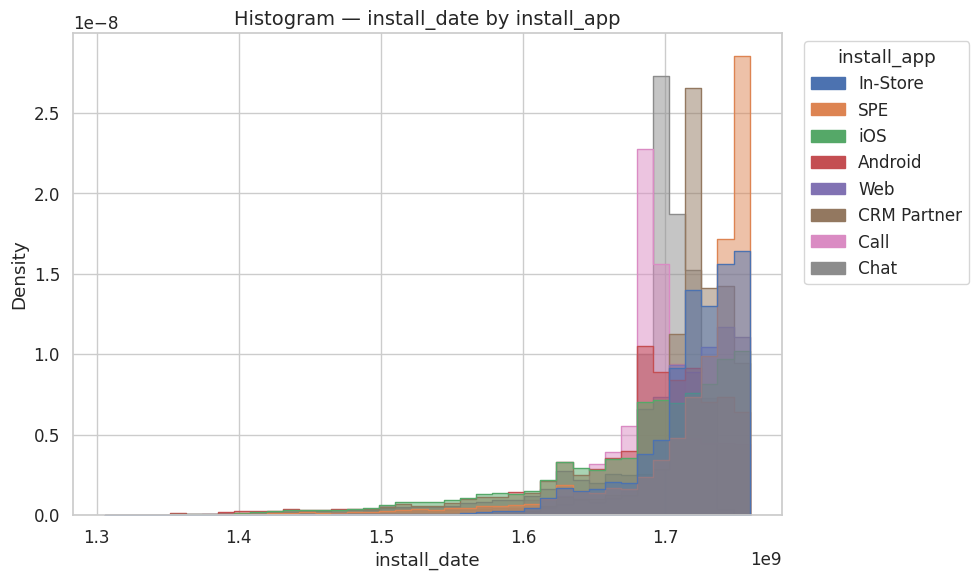

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


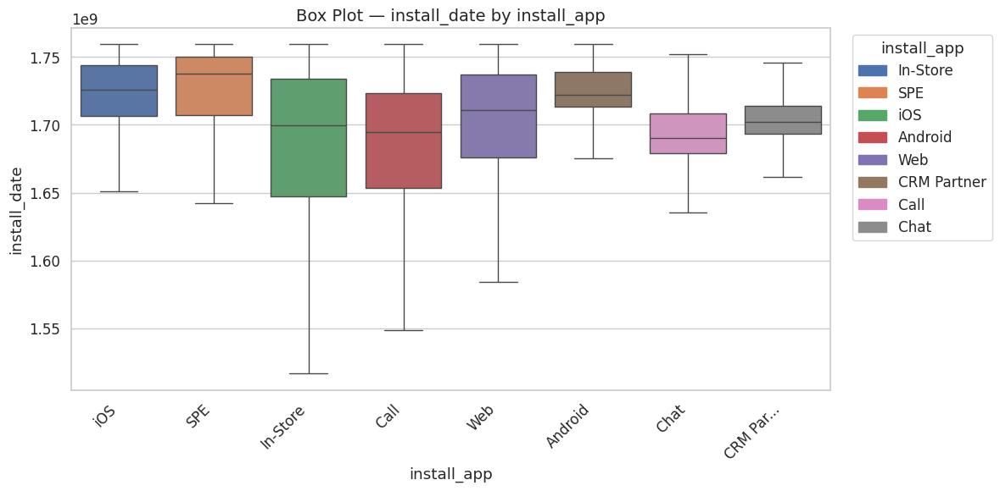


📊 Vẽ biểu đồ cho cặp: (district, customer_id)


/tmp/ipykernel_2234233/31970007.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))


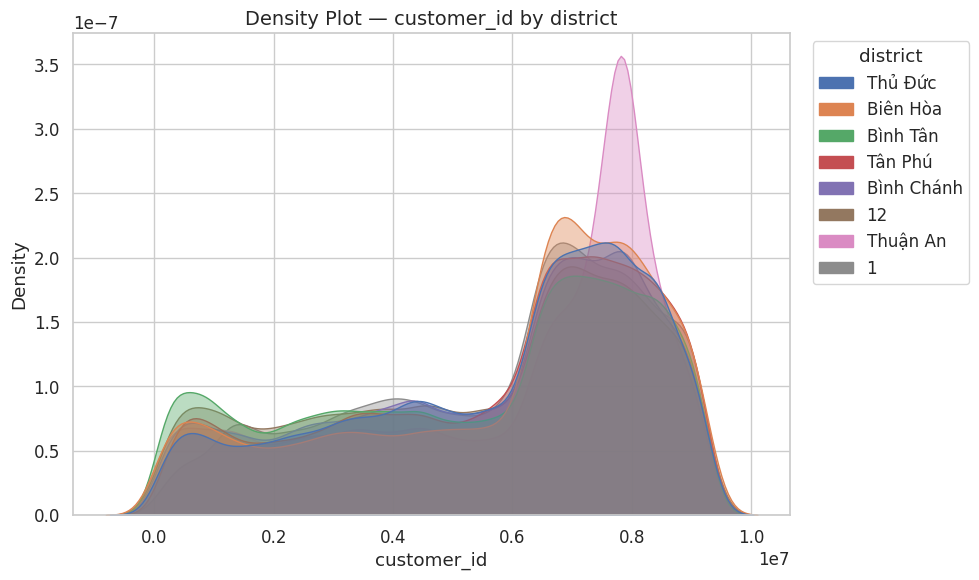

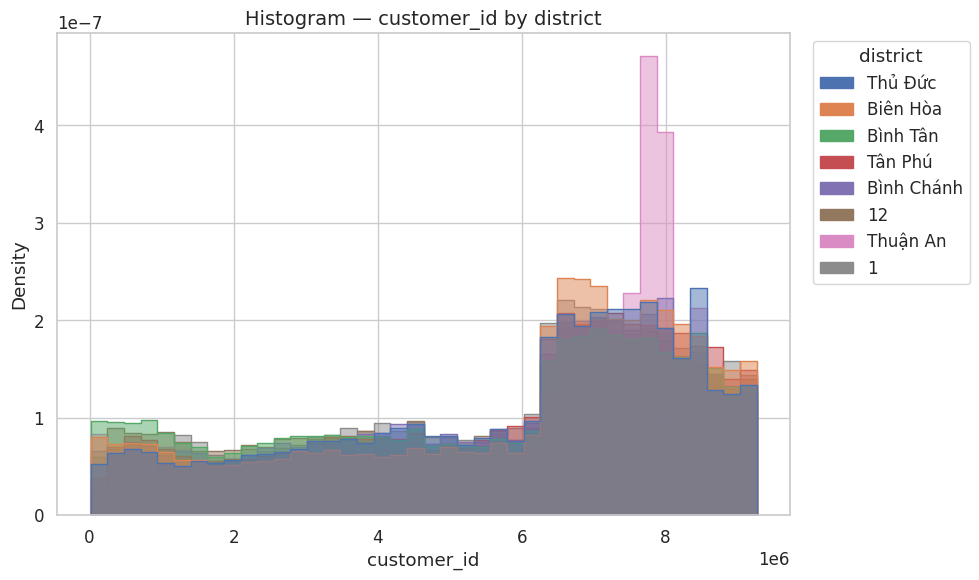

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


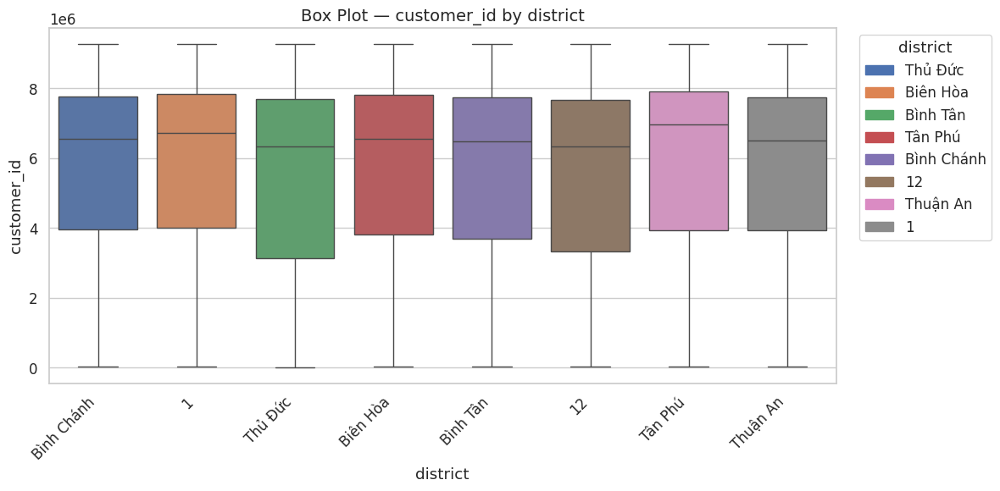


📊 Vẽ biểu đồ cho cặp: (district, location)


/tmp/ipykernel_2234233/31970007.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))


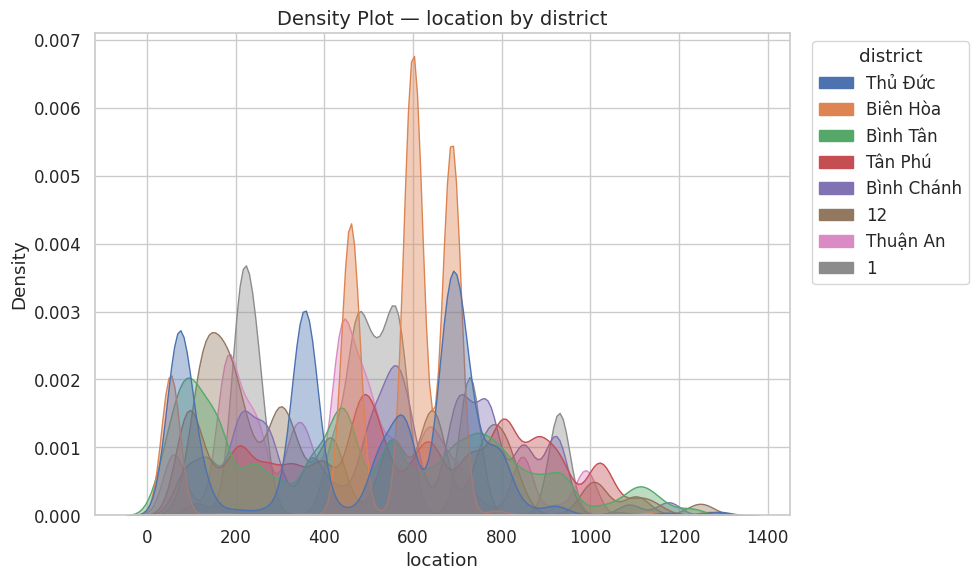

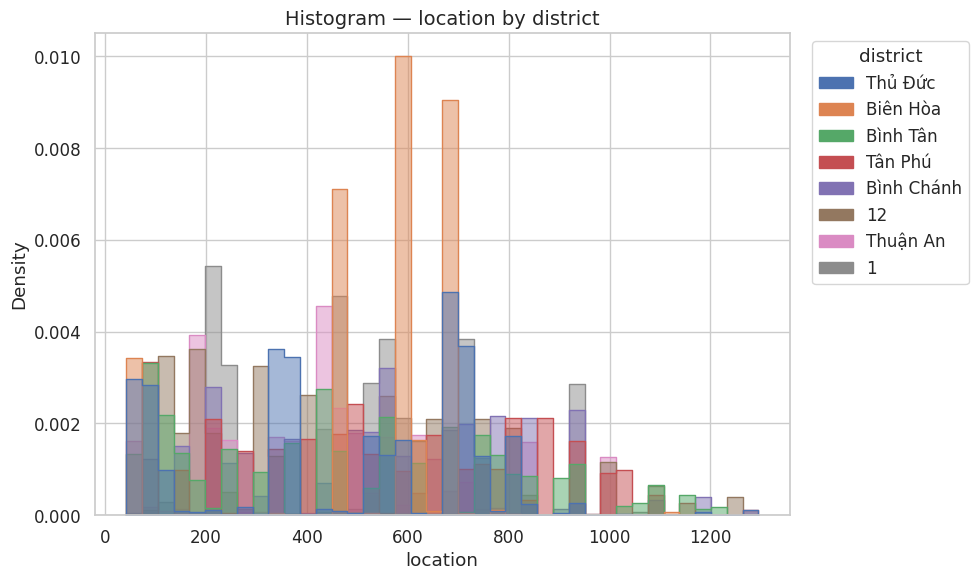

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


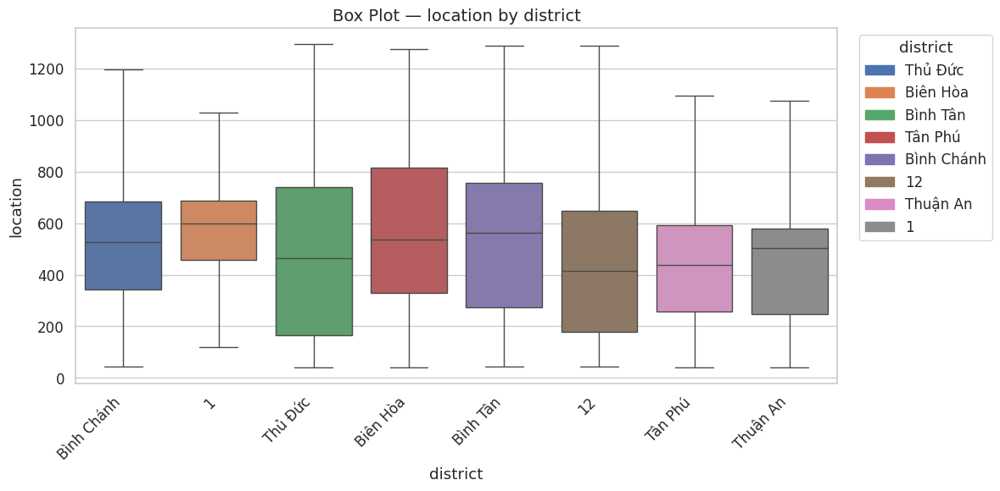


📊 Vẽ biểu đồ cho cặp: (district, timestamp)


/tmp/ipykernel_2234233/31970007.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))


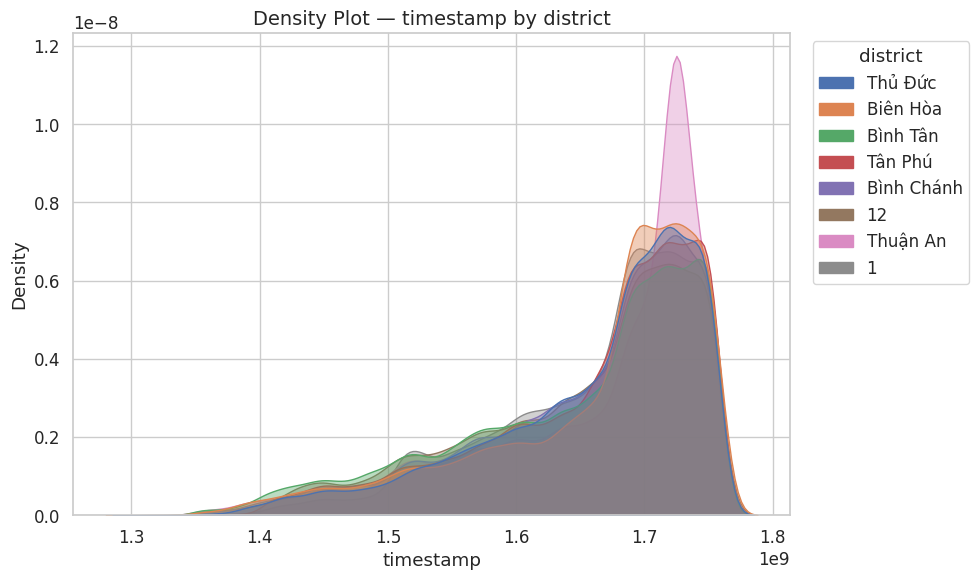

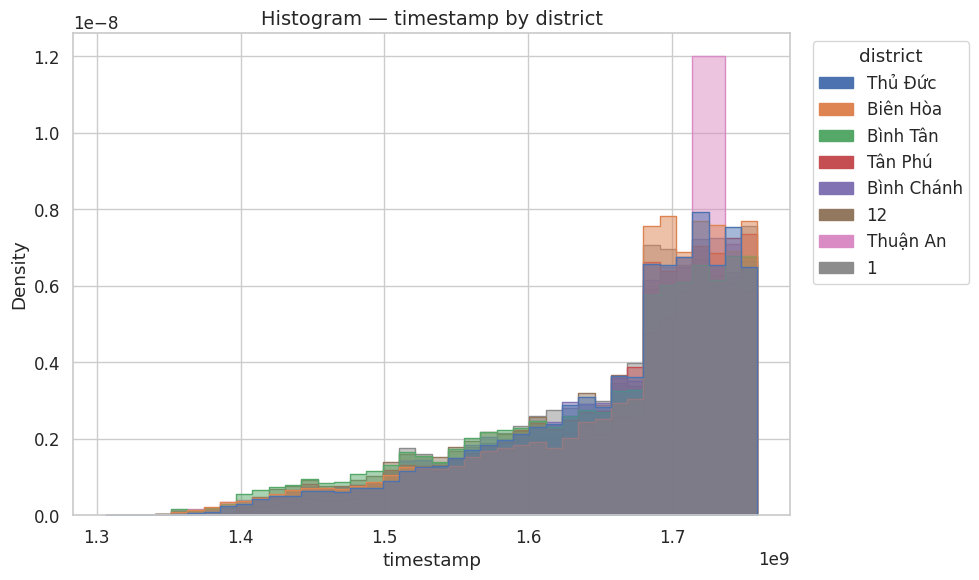

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


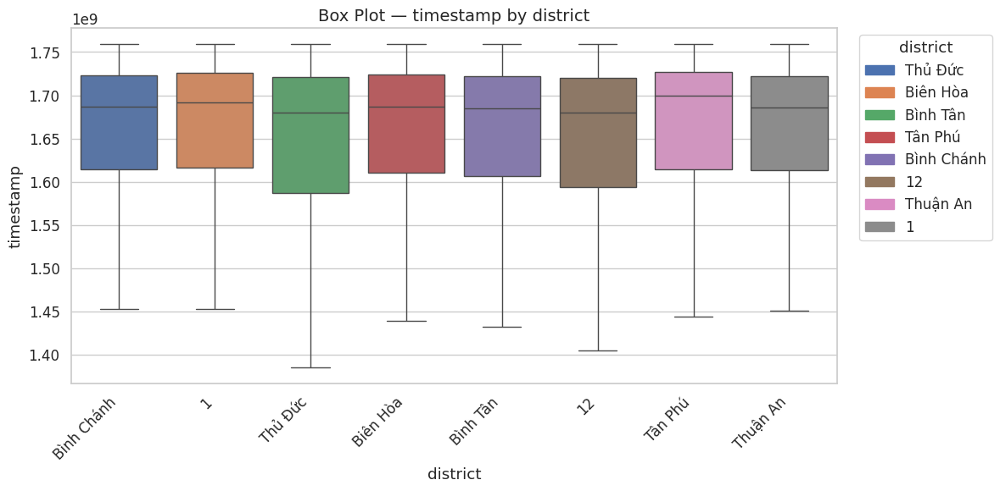


📊 Vẽ biểu đồ cho cặp: (district, sync_status_id)


/tmp/ipykernel_2234233/31970007.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))
/tmp/ipykernel_2234233/31970007.py:59: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(


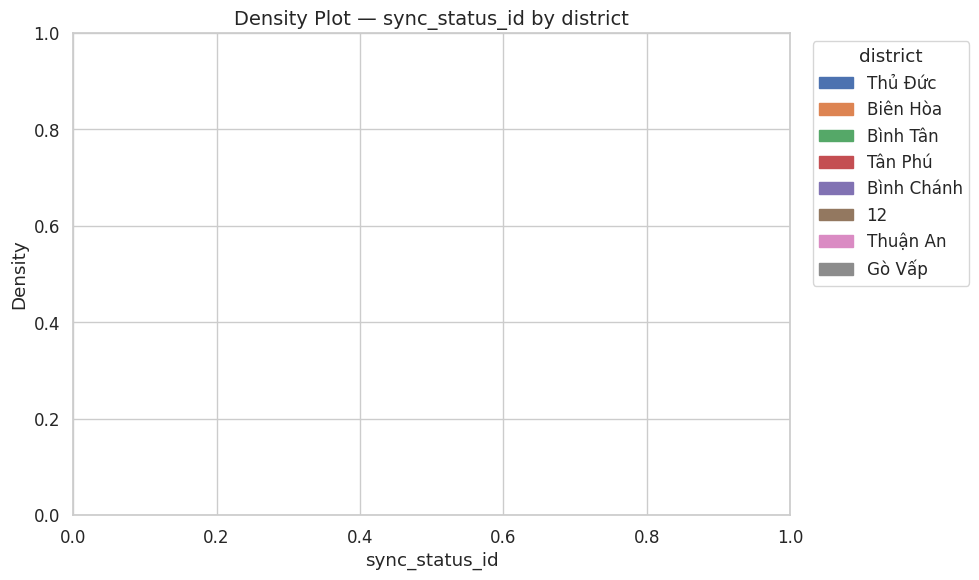

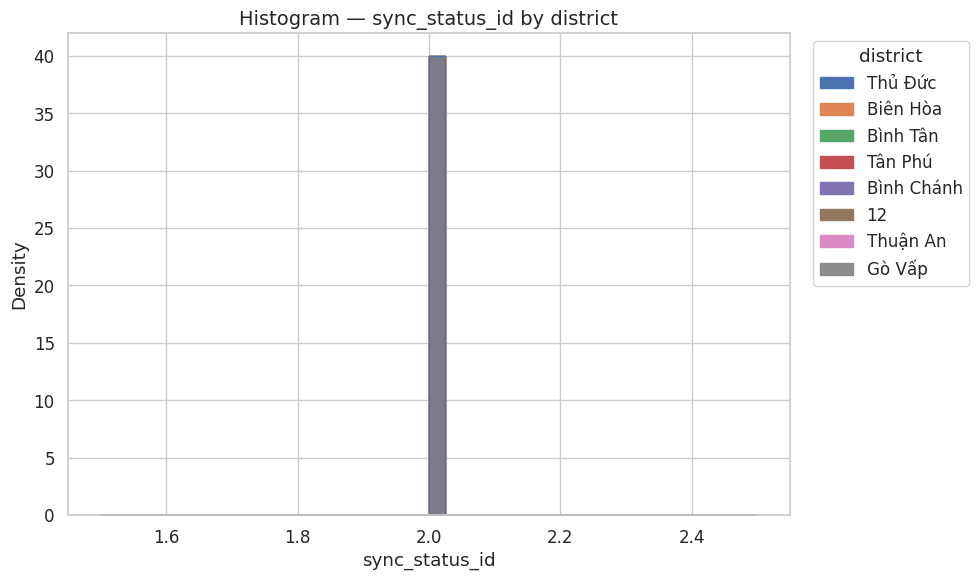

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


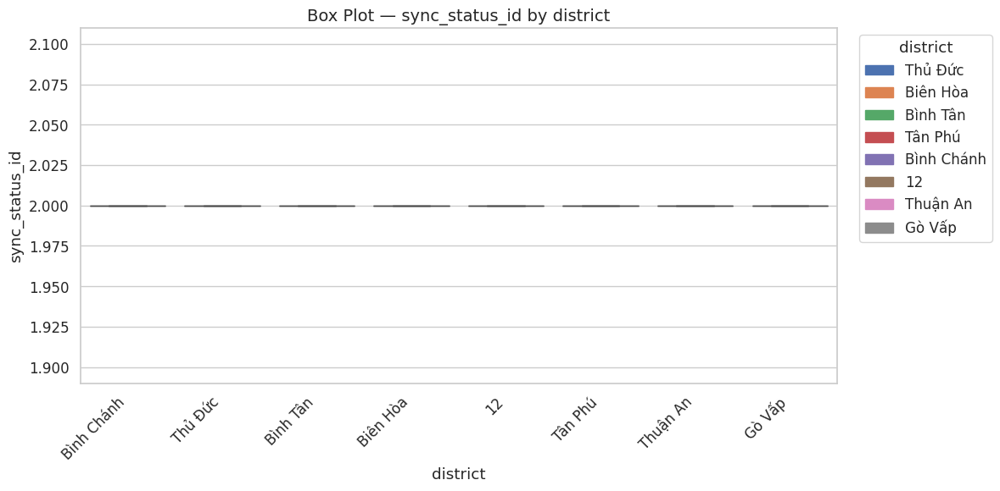


📊 Vẽ biểu đồ cho cặp: (district, install_date)


/tmp/ipykernel_2234233/31970007.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))


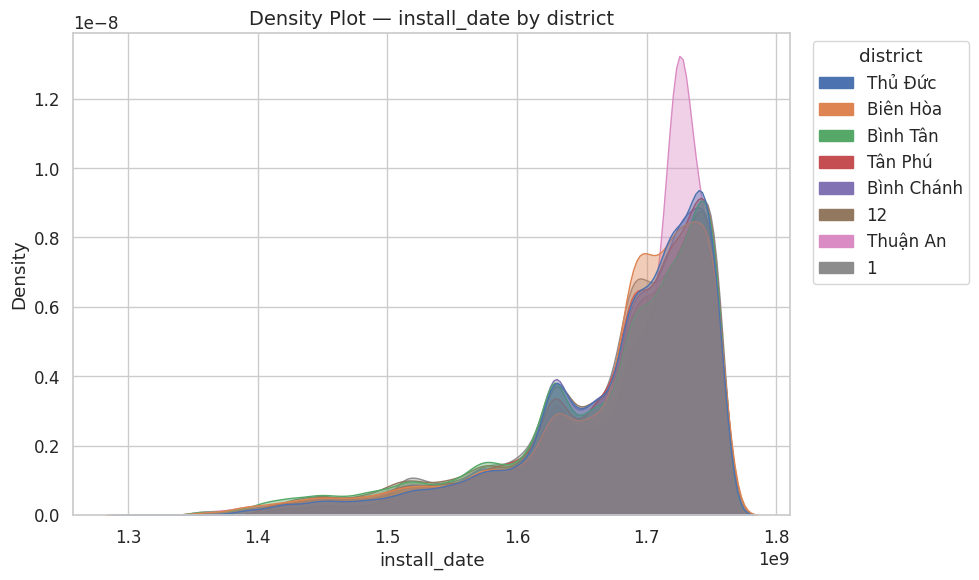

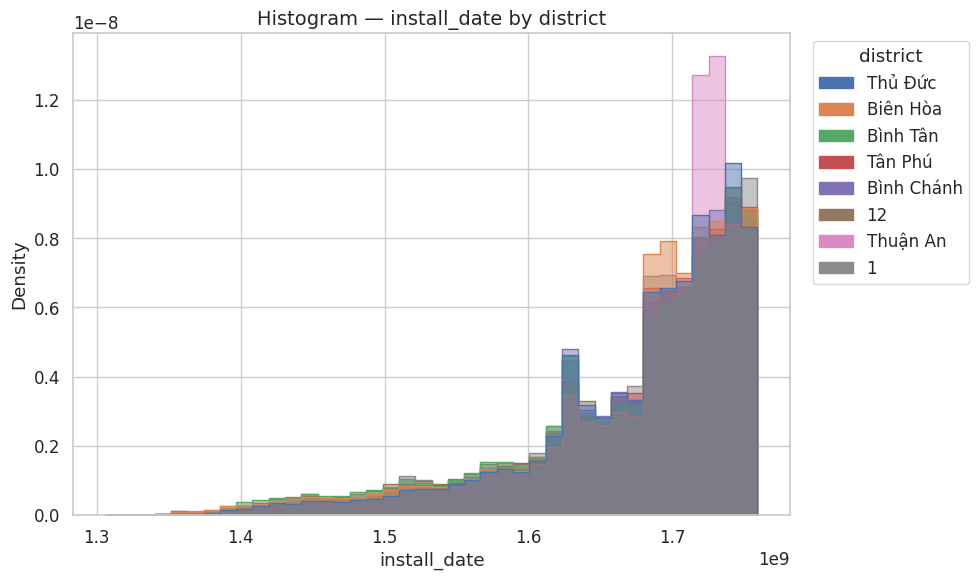

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


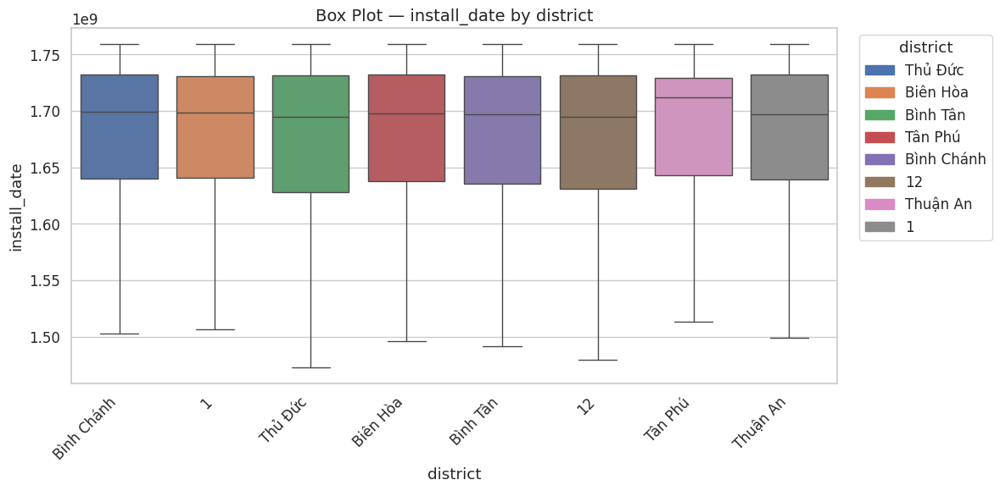


📊 Vẽ biểu đồ cho cặp: (user_id, customer_id)


/tmp/ipykernel_2234233/31970007.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))
/tmp/ipykernel_2234233/31970007.py:59: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(


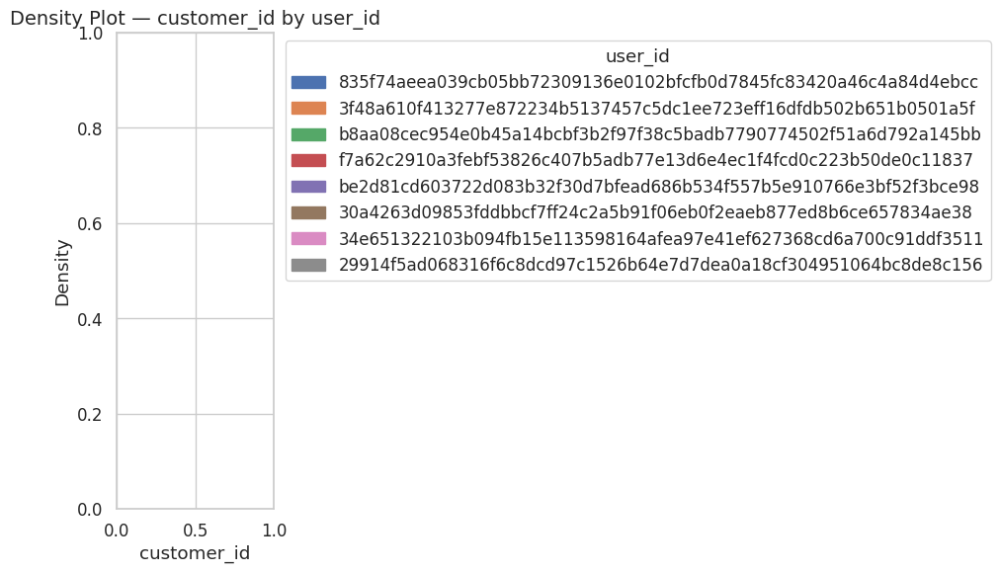

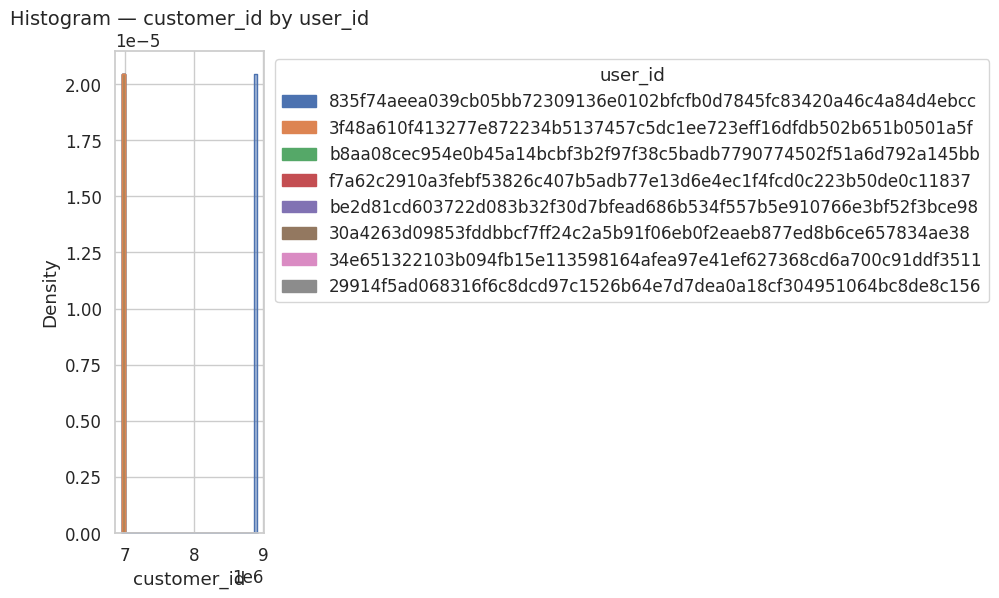

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


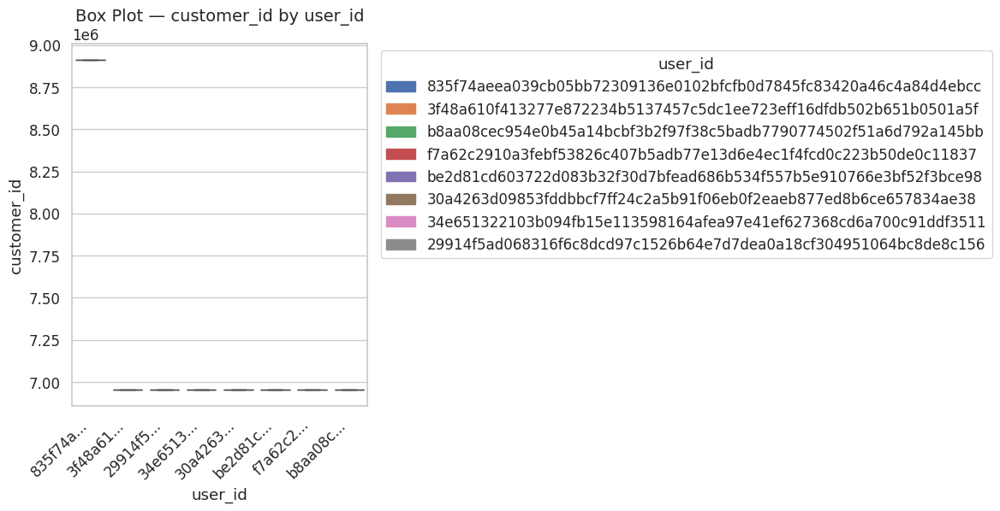


📊 Vẽ biểu đồ cho cặp: (user_id, location)


/tmp/ipykernel_2234233/31970007.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))
/tmp/ipykernel_2234233/31970007.py:59: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(


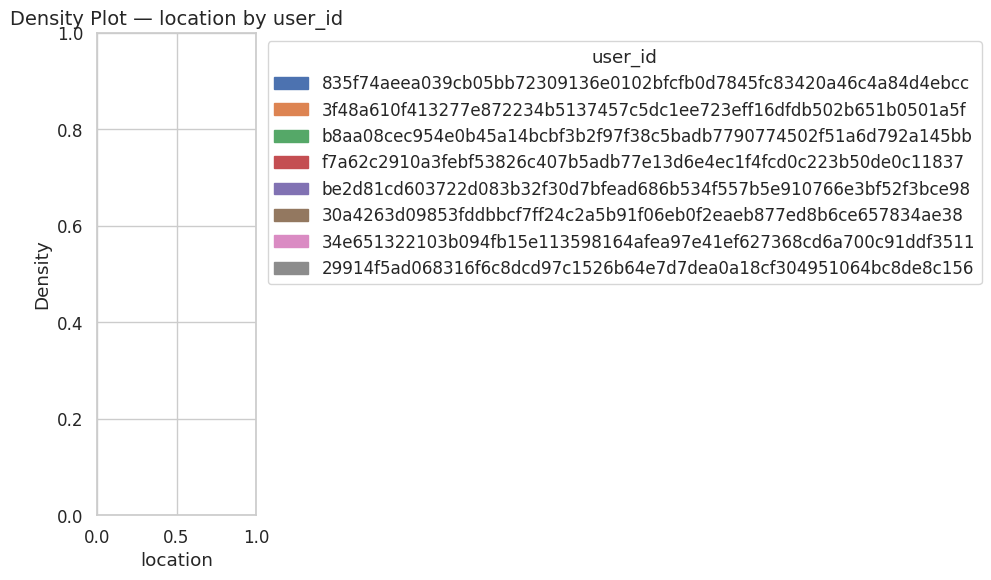

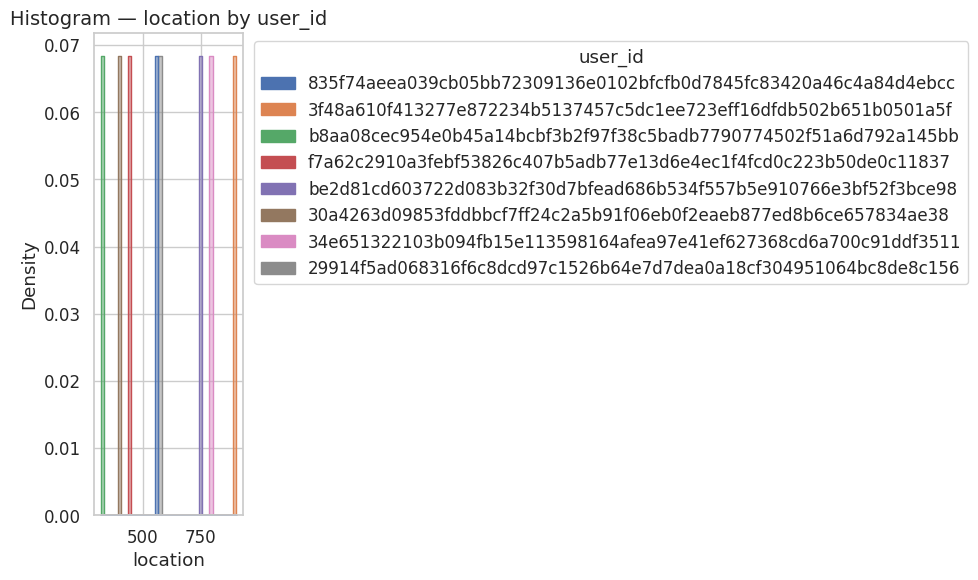

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


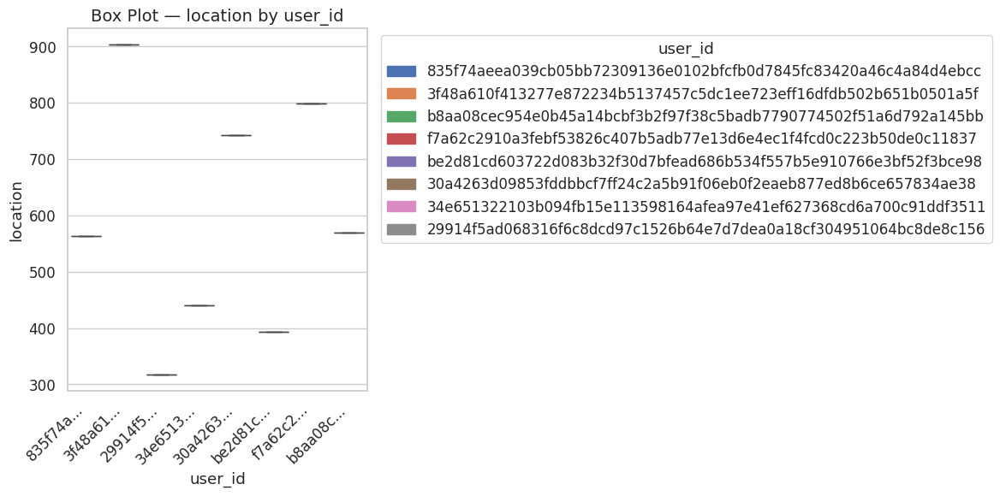


📊 Vẽ biểu đồ cho cặp: (user_id, timestamp)


/tmp/ipykernel_2234233/31970007.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))
/tmp/ipykernel_2234233/31970007.py:59: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(


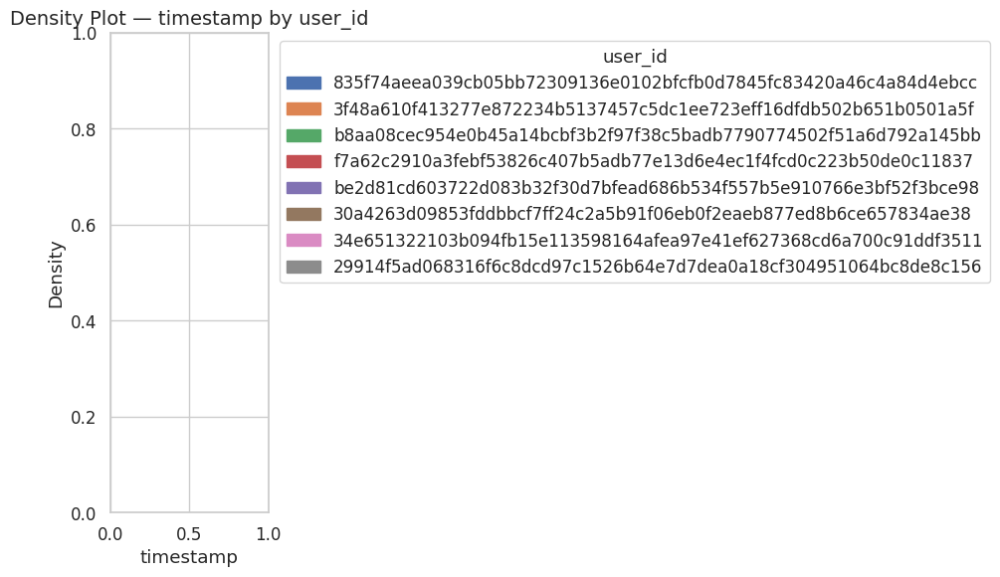

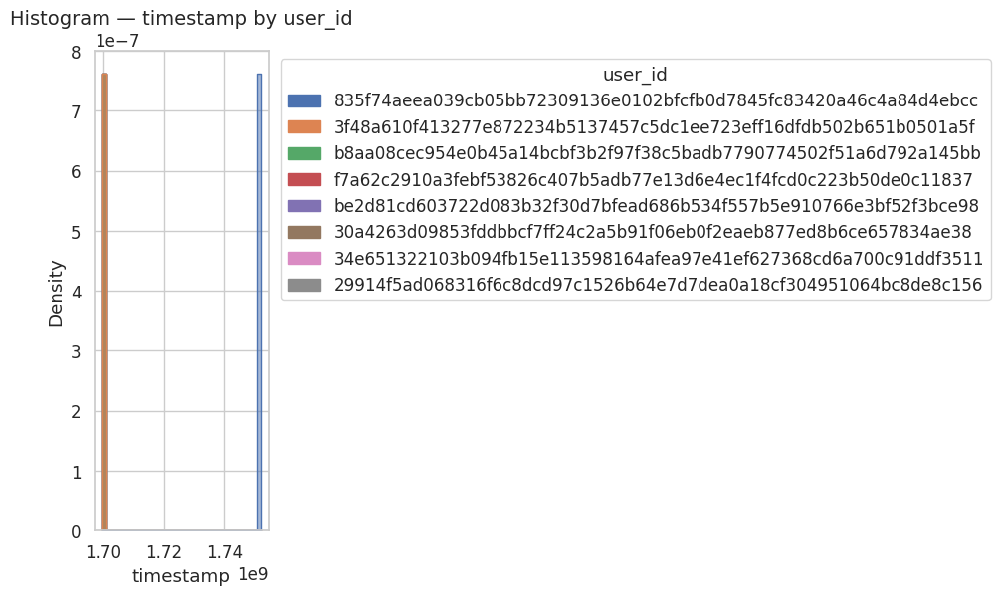

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


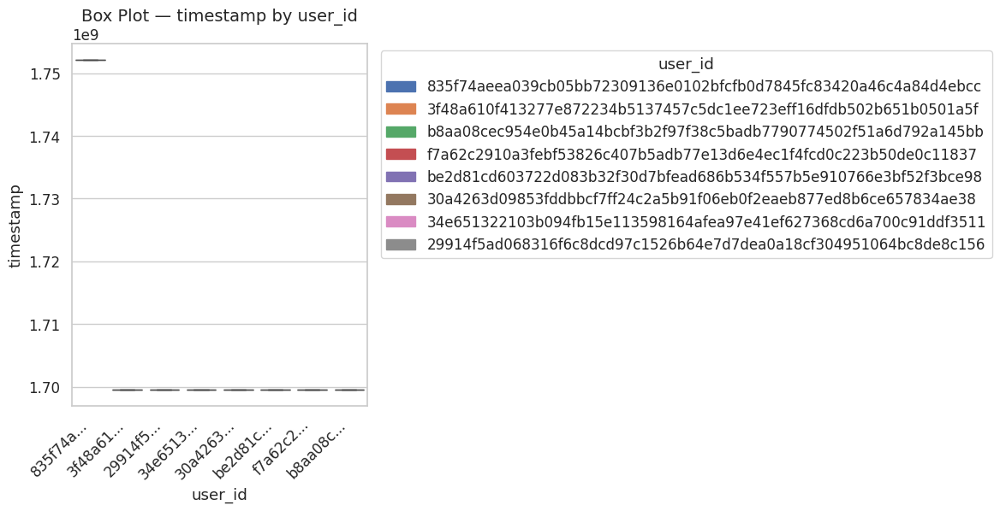


📊 Vẽ biểu đồ cho cặp: (user_id, sync_status_id)


/tmp/ipykernel_2234233/31970007.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))
/tmp/ipykernel_2234233/31970007.py:59: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(


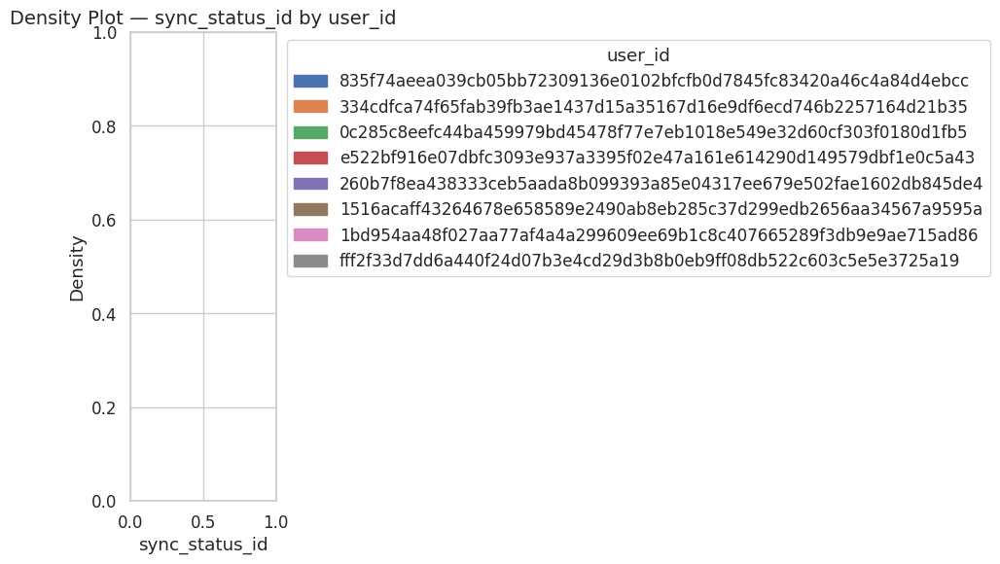

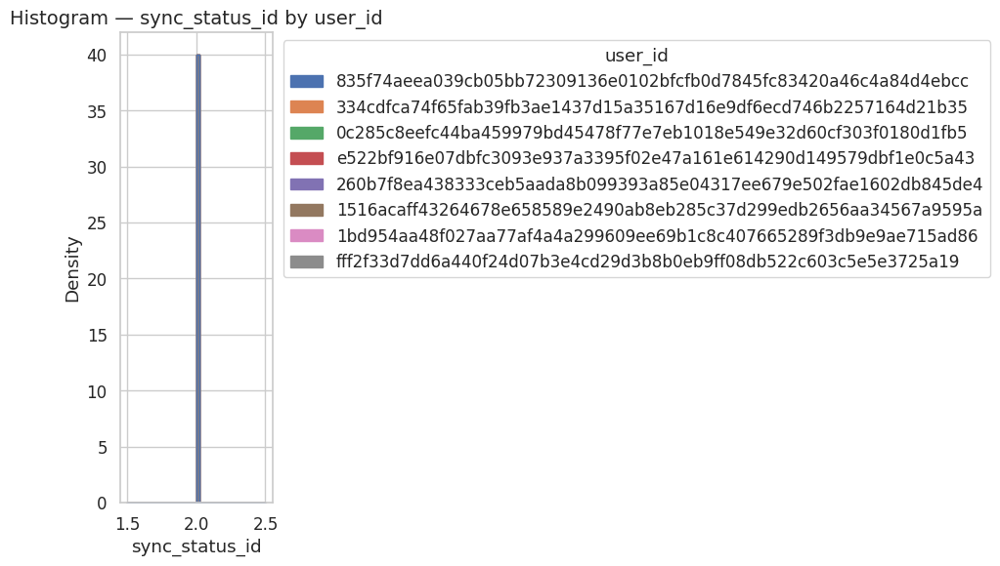

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


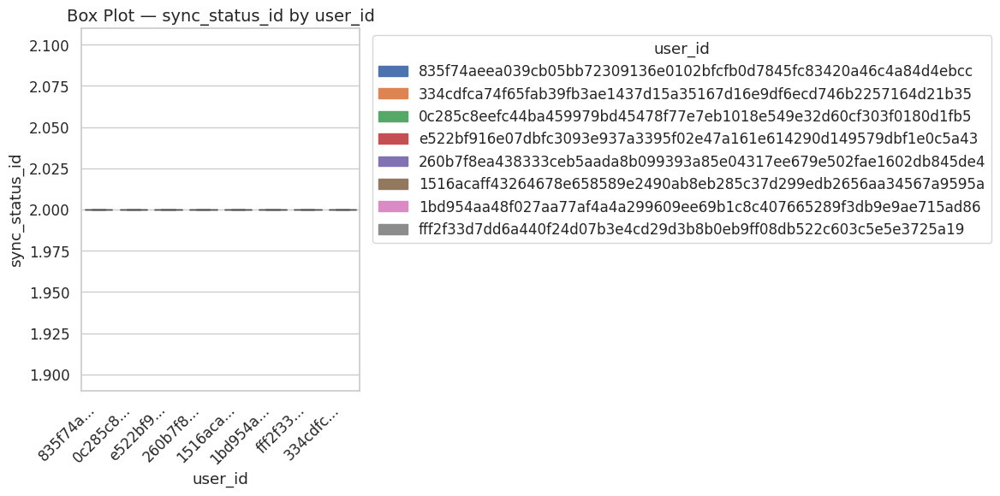


📊 Vẽ biểu đồ cho cặp: (user_id, install_date)


/tmp/ipykernel_2234233/31970007.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))
/tmp/ipykernel_2234233/31970007.py:59: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(


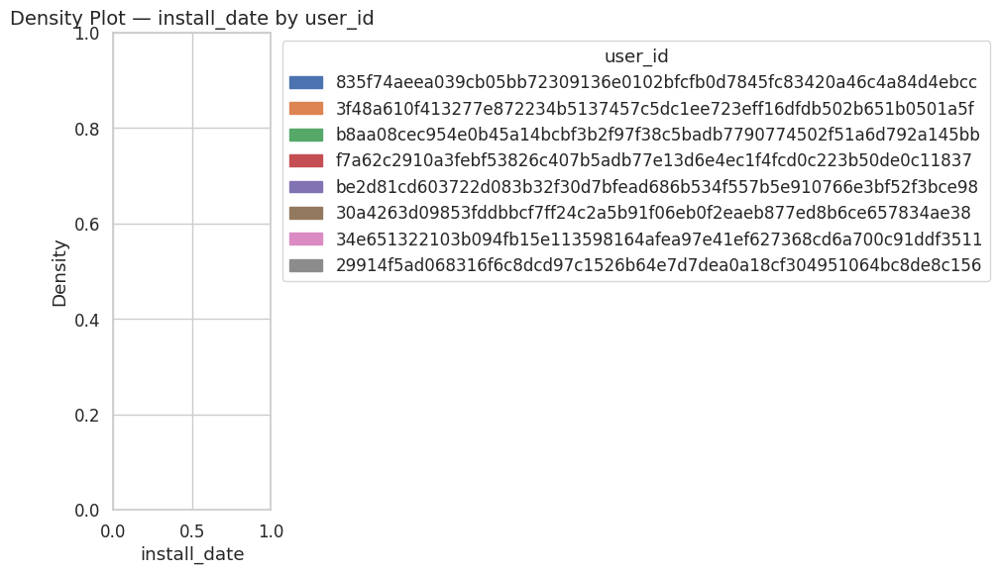

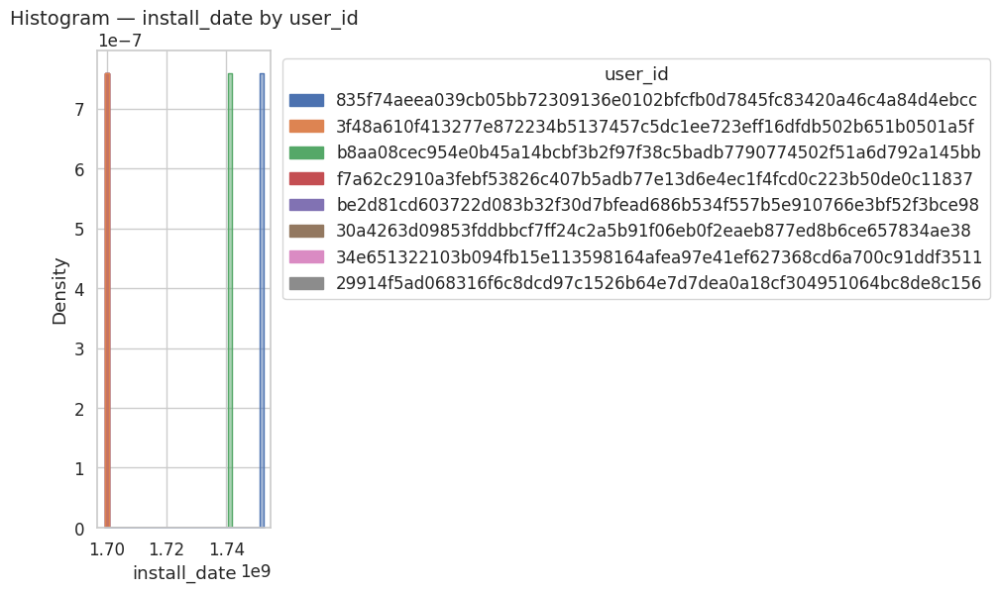

/tmp/ipykernel_2234233/31970007.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


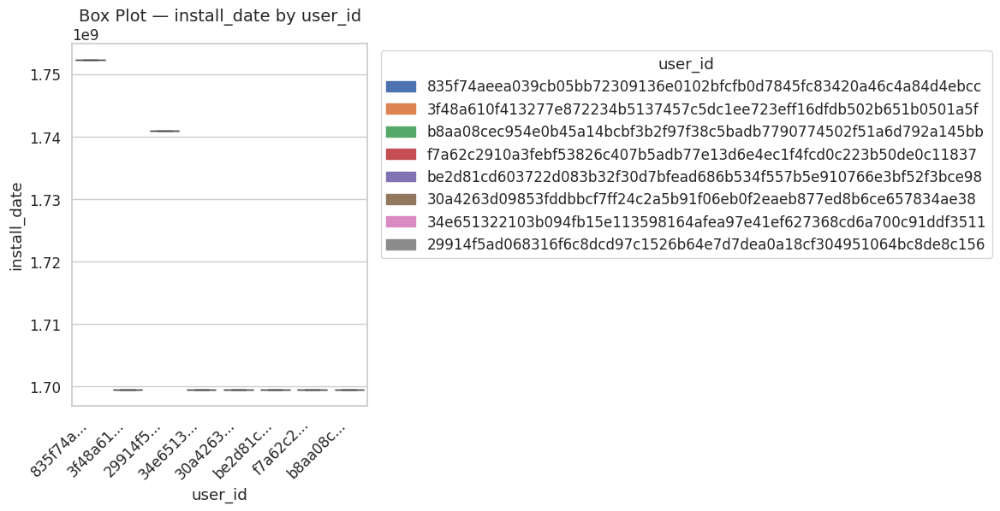

In [ ]:
def plot_numeric_category(df_item, cat_col, num_col, top_k=8):
    """
    Vẽ các biểu đồ Density, Histogram, Box Plot cho 1 cặp (category_col, numeric_col).
    """
    # --- Chuẩn bị dữ liệu ---
    df_plot = (
        df_item
        .with_columns([
            pl.col(num_col).cast(pl.Float64),
            pl.col(cat_col).cast(pl.Utf8)
        ])
        .drop_nulls([num_col, cat_col])
    )

    df_pd = df_plot.to_pandas()

    # Nếu dữ liệu trống thì bỏ qua
    if df_pd.empty:
        print(f"[⚠️] Không có dữ liệu hợp lệ cho ({cat_col}, {num_col})")
        return

    # Lấy top category phổ biến nhất
    top_cats = df_pd[cat_col].value_counts().nlargest(top_k).index
    df_top = df_pd[df_pd[cat_col].isin(top_cats)]
    df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))
    sns.set(style="whitegrid", font_scale=1.1)
    palette = sns.color_palette(n_colors=len(top_cats))
    # ===============================
    # 1️⃣ DENSITY PLOT
    # ===============================
    plt.figure(figsize=(10, 6))
    ax = sns.kdeplot(
        data=df_top,
        x=num_col,
        hue=cat_col,
        common_norm=False,
        fill=True,
        alpha=0.4,
        palette=palette
    )
    ax.set_title(f"Density Plot — {num_col} by {cat_col}", fontsize=14)
    ax.set_xlabel(num_col)
    ax.set_ylabel("Density")

    handles = [plt.Rectangle((0, 0), 1, 1, color=color) for color in palette]
    labels = list(top_cats)
    plt.legend(handles, labels, title=cat_col, bbox_to_anchor=(1.02, 1), loc="upper left", frameon=True)
    plt.tight_layout()
    plt.show()

    # ===============================
    # 2️⃣ HISTOGRAM
    # ===============================
    plt.figure(figsize=(10, 6))
    ax = sns.histplot(
        data=df_top,
        x=num_col,
        hue=cat_col,
        element="step",
        stat="density",
        common_norm=False,
        bins=40,
        alpha=0.5,
        palette=palette
    )
    ax.set_title(f"Histogram — {num_col} by {cat_col}", fontsize=14)
    ax.set_xlabel(num_col)
    ax.set_ylabel("Density")

    plt.legend(handles, labels, title=cat_col, bbox_to_anchor=(1.02, 1), loc="upper left", frameon=True)
    plt.tight_layout()
    plt.show()

    # ===============================
    # 3️⃣ BOX PLOT
    # ===============================
    plt.figure(figsize=(12, 6))
    ax = sns.boxplot(
        data=df_top,
        x=cat_col,
        y=num_col,
        palette=palette,
        showfliers=False
    )
    ax.set_title(f"Box Plot — {num_col} by {cat_col}", fontsize=14)
    ax.set_xlabel(cat_col)
    ax.set_ylabel(num_col)
    plt.xticks(rotation=45, ha='right')

    plt.legend(handles, labels, title=cat_col, bbox_to_anchor=(1.02, 1), loc="upper left", frameon=True)
    plt.tight_layout()
    plt.show()

def truncate_label(s, max_len=10):
    """Truncate string s to max_len chars, add '...' if truncated"""
    if s is None:
        return ""
    s = str(s)
    return s if len(s) <= max_len else s[:max_len-3] + "..."
# ===================================================
# 🔹 Gọi hàm cho toàn bộ cặp numeric–category
# ===================================================

# # Xác định cột
# numeric_cols = ["price", "gp"]  # hoặc tự động phát hiện bằng dtype
# category_cols = ["category_l1", "category_l2", "category_l3"]

numeric_cols, category_cols = detect_column_types(df_user)

print("🔢 Numeric columns:", numeric_cols)
print("🏷️ Category columns:", category_cols)

# Vẽ cho mọi cặp có dữ liệu
for cat_col in category_cols:
    for num_col in numeric_cols:
        print(f"\n📊 Vẽ biểu đồ cho cặp: ({cat_col}, {num_col})")
        plot_numeric_category(df_user, cat_col, num_col)

### Category-Category


📊 Phân tích cặp (gender, province)
────────────────────────────
🔹 Bảng tần suất:
province  Bà Rịa - Vũng Tàu  Bình Dương  Hà Nội  Hồ Chí Minh  Long An  \
gender                                                                  
Khác                      0           0       0            5        0   
Nam                   29817       81651   25046       302791    41831   
Nữ                    88284      205891  176445       920537    91921   

province  Lâm Đồng  Đà Nẵng  Đồng Nai  
gender                                 
Khác             0        0         0  
Nam          34338    37656     86898  
Nữ          100282   108940    225233  

🔹 Chi-square = 22988.124, p = 0.0000e+00, dof = 14
➡️ Kết luận: Hai biến có mối liên hệ **có ý nghĩa thống kê**.


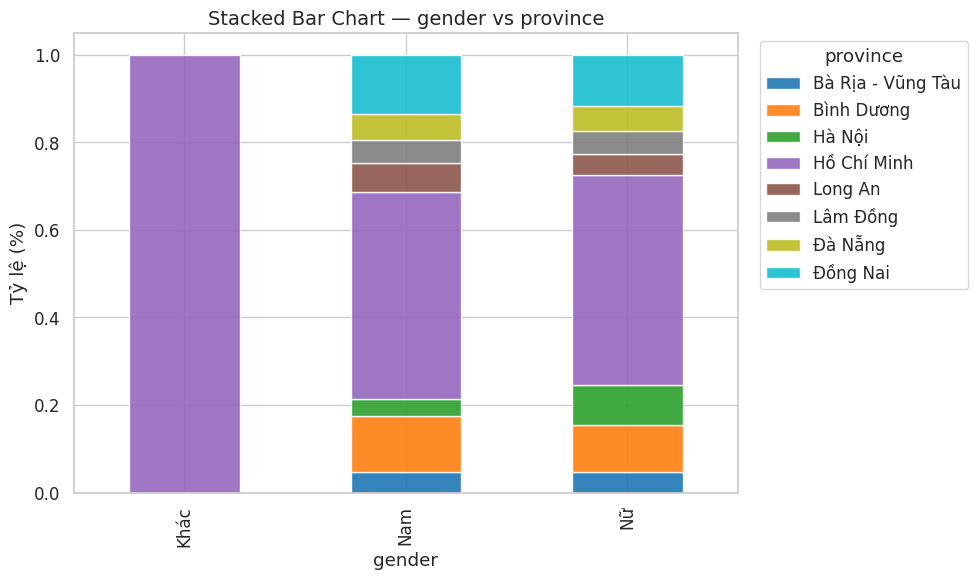

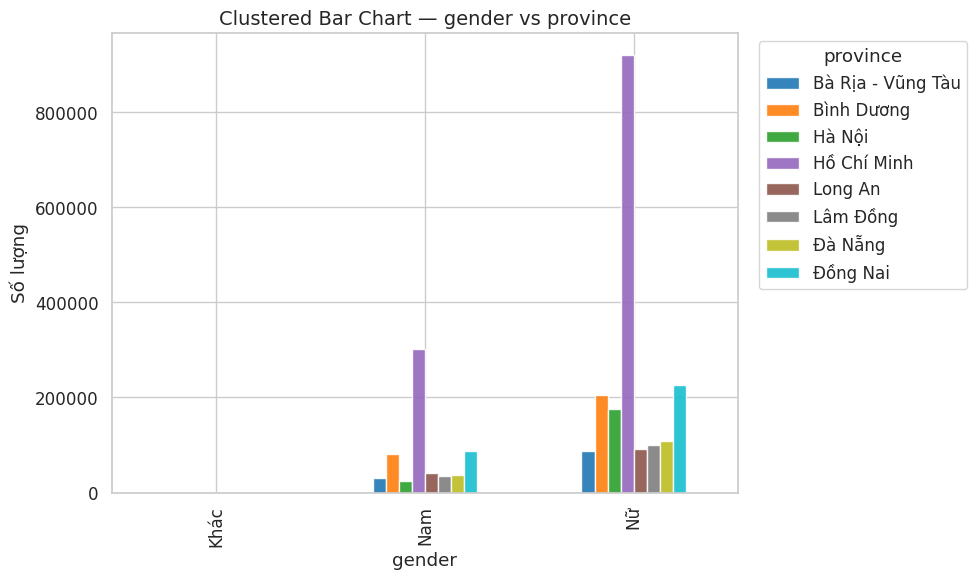


📊 Phân tích cặp (gender, membership)
────────────────────────────
🔹 Bảng tần suất:
membership  Diamond    Gold  Standard
gender                               
Khác              0       0         8
Nam           13388   48904   1086777
Nữ            62457  206269   3156161

🔹 Chi-square = 7609.830, p = 0.0000e+00, dof = 4
➡️ Kết luận: Hai biến có mối liên hệ **có ý nghĩa thống kê**.


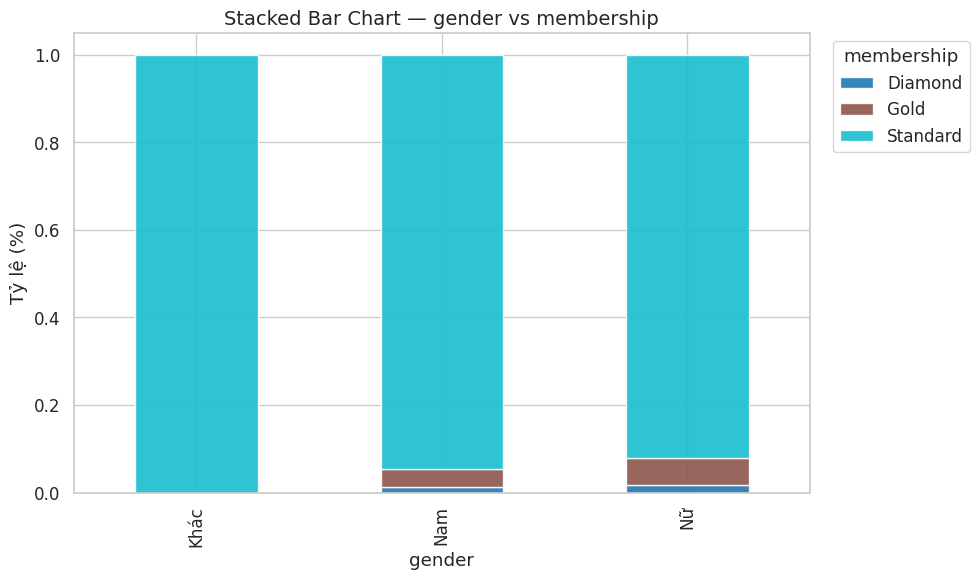

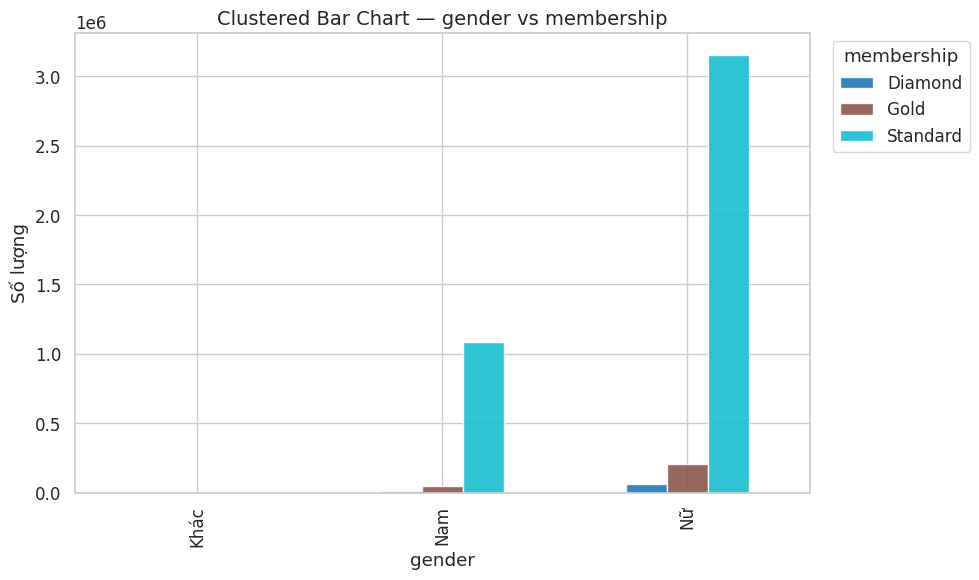

[⚠️] Không có dữ liệu hợp lệ cho (gender, sync_error_message)

📊 Phân tích cặp (gender, region)
────────────────────────────
🔹 Bảng tần suất:
region  Bắc Trung Bộ  Duyên hải Bắc Bộ  Duyên hải Nam Trung Bộ  \
gender                                                            
Khác                1                 0                       0   
Nam             42780                 7                  147293   
Nữ             175088              4376                  430013   

region  Trung du và miền núi phía Bắc  Tây Nguyên  Đông Nam Bộ  \
gender                                                           
Khác                                0           0            5   
Nam                             18330       84711       552418   
Nữ                              87006      248752      1573643   

region  Đồng bằng sông Hồng  Đồng bằng sông Cửu Long  
gender                                                   
Khác                         0                        2  
Nam              

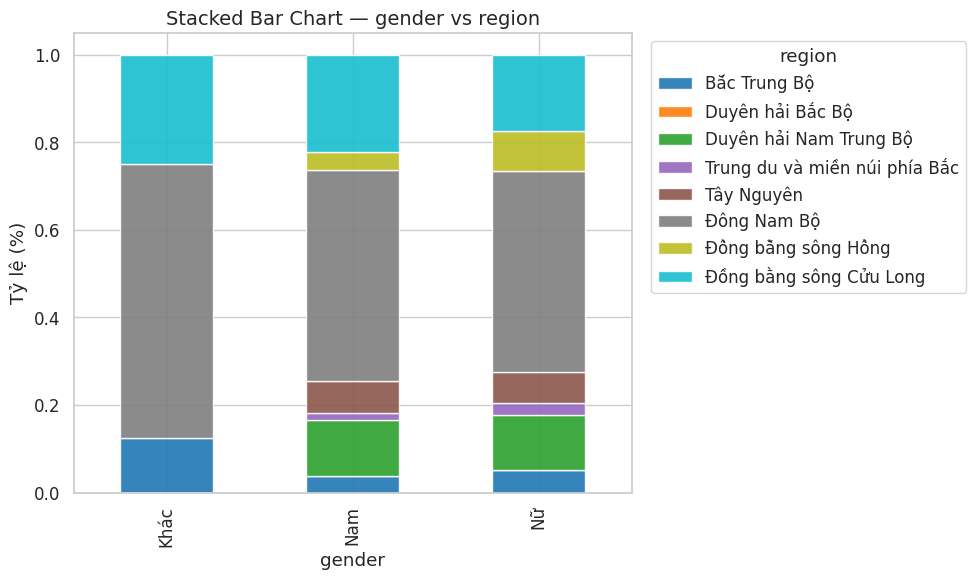

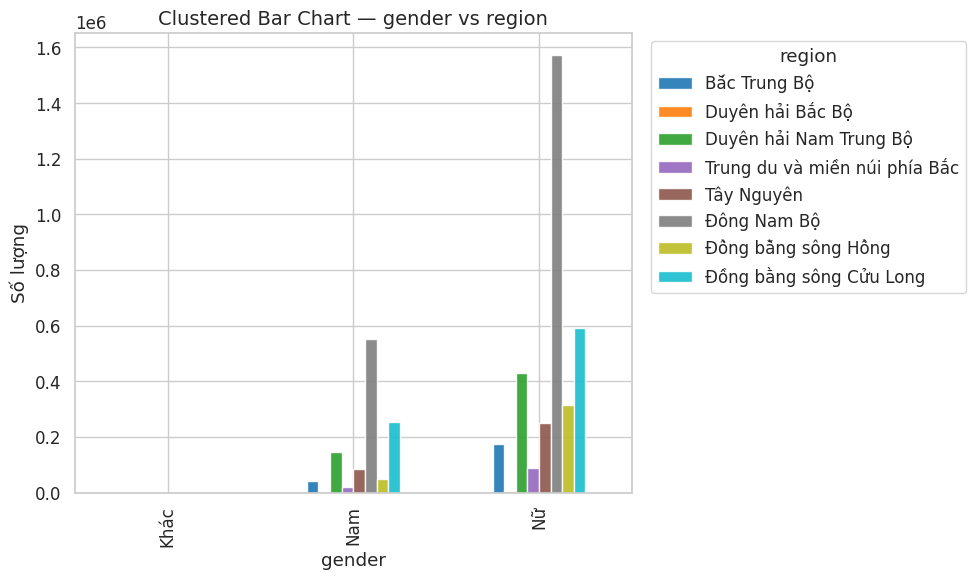


📊 Phân tích cặp (gender, location_name)
────────────────────────────
🔹 Bảng tần suất:
location_name  DNA - 81 - 83 Nguyễn Văn Linh  DNA - 93-95 Lê Văn Hiến  \
gender                                                                  
Nam                                     5235                     6856   
Nữ                                     17148                    12702   

location_name  HCM - 66 Nguyễn Du  HCM - 9 – 11 – 13 Nguyễn Trãi  \
gender                                                             
Nam                          6679                           4460   
Nữ                          14830                          16103   

location_name  HNI - 147K Đội Cấn  HNI - 16B-4 Nguyễn Văn Lộc  \
gender                                                          
Nam                          2450                        1835   
Nữ                          14360                       15703   

location_name  HNI - 933 La Thành  HNI - Aeon Mall Hà Đông  
gender                   

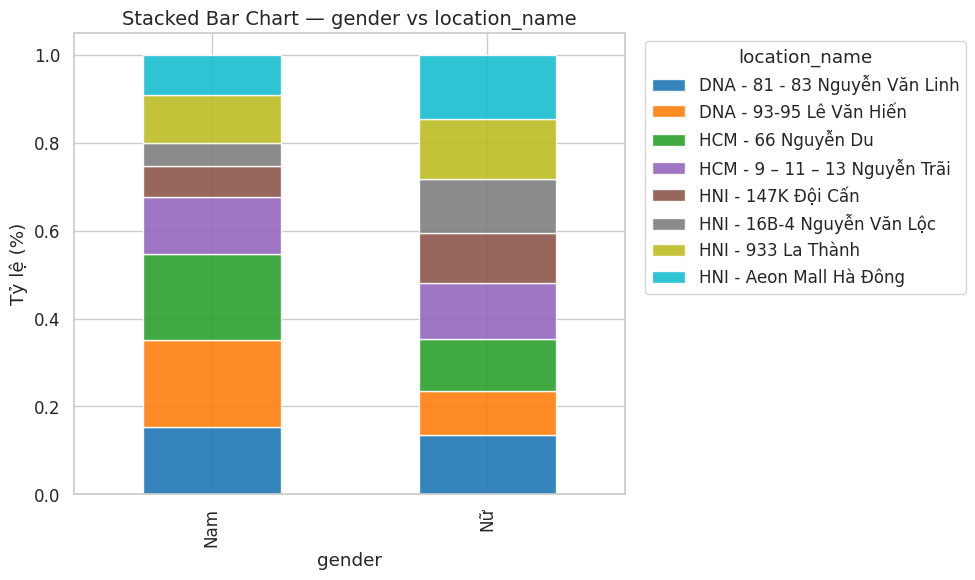

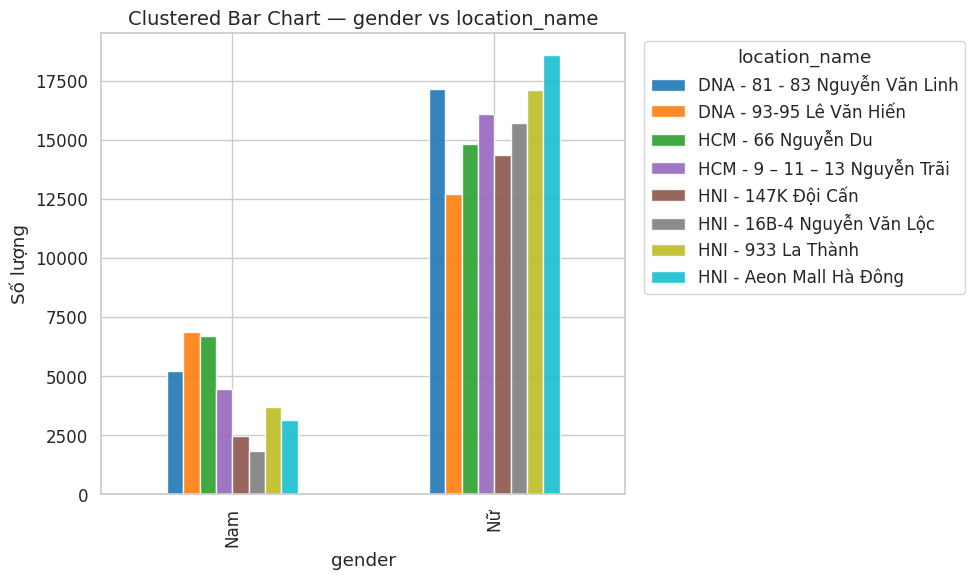


📊 Phân tích cặp (gender, install_app)
────────────────────────────
🔹 Bảng tần suất:
install_app  Android  CRM Partner  Call  Chat  In-Store     SPE    Web     iOS
gender                                                                        
Khác               0            0     0     0         8       0      0       0
Nam              124          844  2421   193   1144992      80    160     240
Nữ             91827        15148  8163  1534   2797000  347828  35716  127642

🔹 Chi-square = 236735.854, p = 0.0000e+00, dof = 14
➡️ Kết luận: Hai biến có mối liên hệ **có ý nghĩa thống kê**.


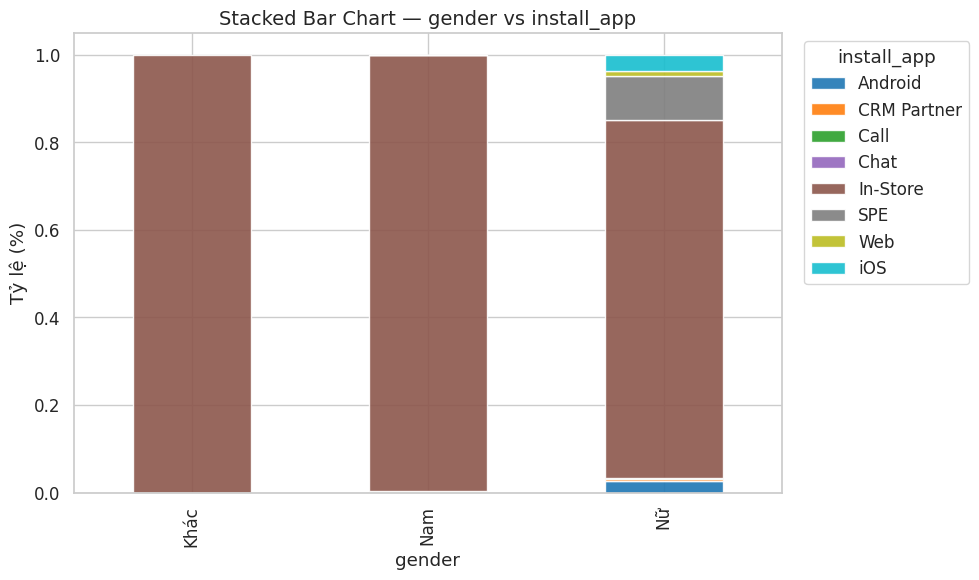

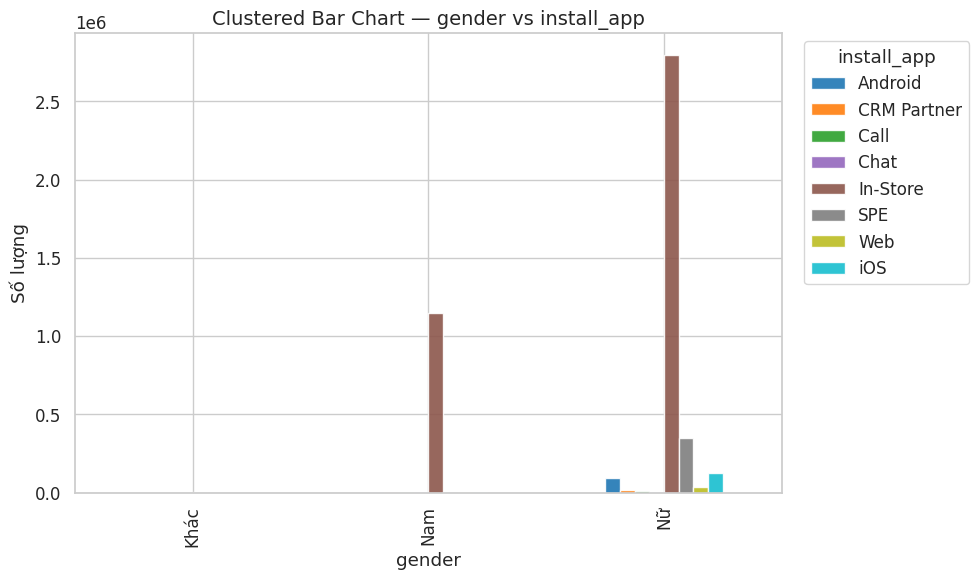


📊 Phân tích cặp (gender, district)
────────────────────────────
🔹 Bảng tần suất:
district      1     12  Biên Hòa  Bình Chánh  Bình Tân  Thuận An  Thủ Đức  \
gender                                                                      
Khác          0      1         0           0         0         0        2   
Nam       20099  20461     34566       22806     28442     20940    47671   
Nữ        45755  61522     90824       61621     77416     50447   147928   

district  Tân Phú  
gender             
Khác            0  
Nam         20904  
Nữ          81931  

🔹 Chi-square = 3403.838, p = 0.0000e+00, dof = 14
➡️ Kết luận: Hai biến có mối liên hệ **có ý nghĩa thống kê**.


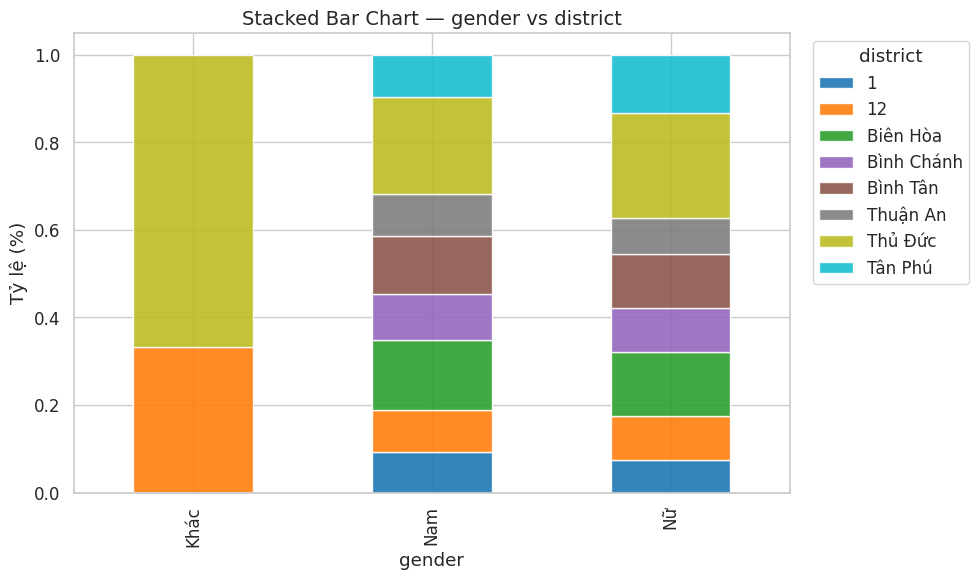

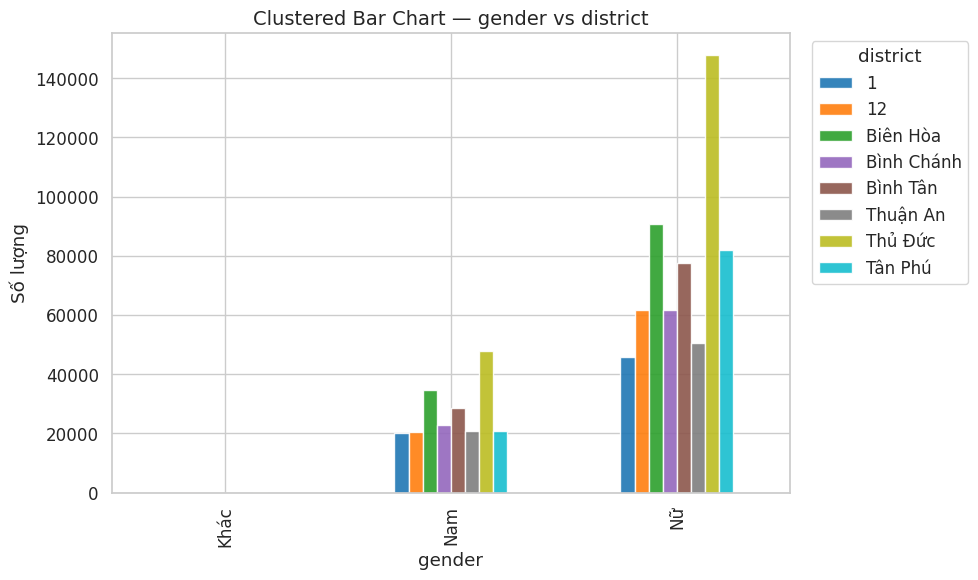


📊 Phân tích cặp (province, membership)
────────────────────────────
🔹 Bảng tần suất:
membership         Diamond   Gold  Standard
province                                   
Bà Rịa - Vũng Tàu     1733   7320    109048
Bình Dương            6635  20796    260111
Hà Nội                 311   3120    198060
Hồ Chí Minh          28373  83180   1111780
Long An               2894   8209    122649
Lâm Đồng              1885   7617    125118
Đà Nẵng               1427   7320    137849
Đồng Nai              6030  19176    286925

🔹 Chi-square = 15448.084, p = 0.0000e+00, dof = 14
➡️ Kết luận: Hai biến có mối liên hệ **có ý nghĩa thống kê**.


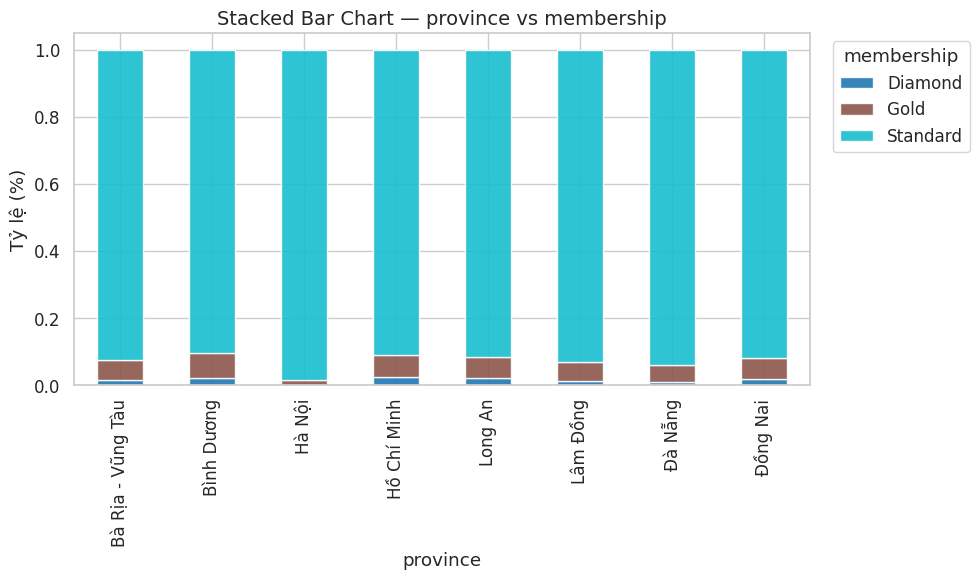

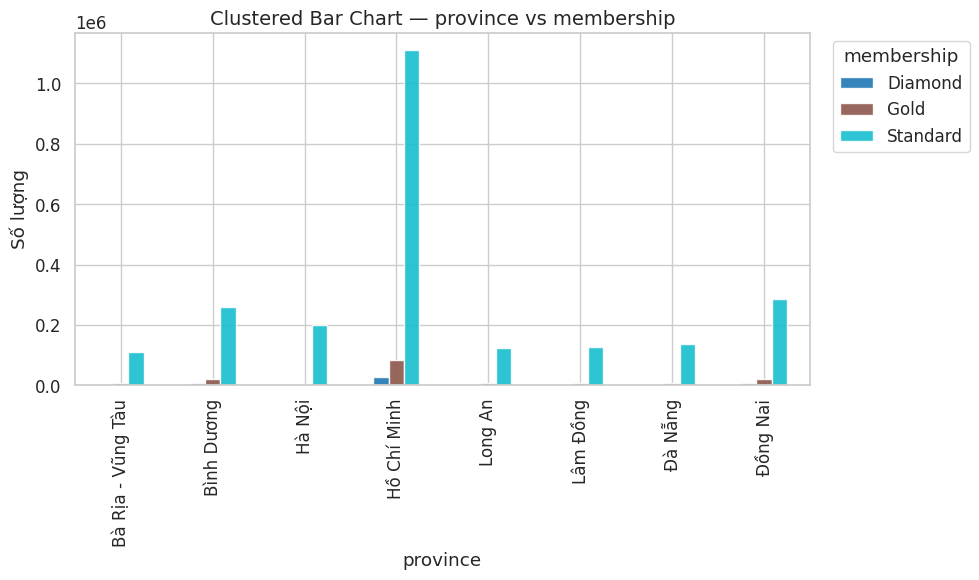

[⚠️] Không có dữ liệu hợp lệ cho (province, sync_error_message)

📊 Phân tích cặp (province, region)
────────────────────────────
🔹 Bảng tần suất:
region             Bắc Trung Bộ  Duyên hải Bắc Bộ  Duyên hải Nam Trung Bộ  \
province                                                                     
Bà Rịa - Vũng Tàu              0                 5                       0   
Bình Dương                     0                 0                      20   
Hà Nội                         0                 0                       0   
Hồ Chí Minh                   71                 0                       0   
Long An                        0                 0                       0   
Lâm Đồng                       0                 0                       0   
Đà Nẵng                        0                 0                  146596   
Đồng Nai                       0                 0                       6   

region             Trung du và miền núi phía Bắc  Tây Nguyên  Đông Nam Bộ

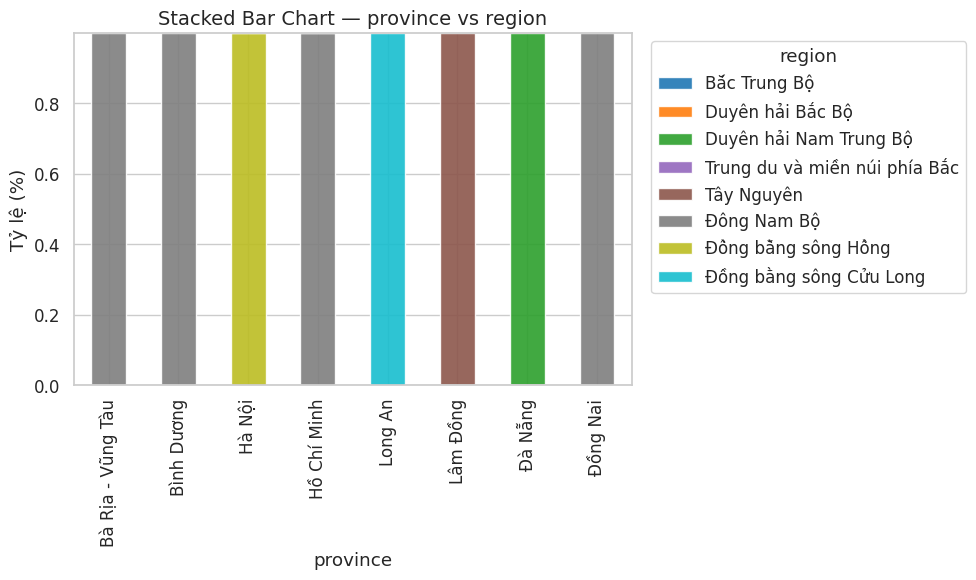

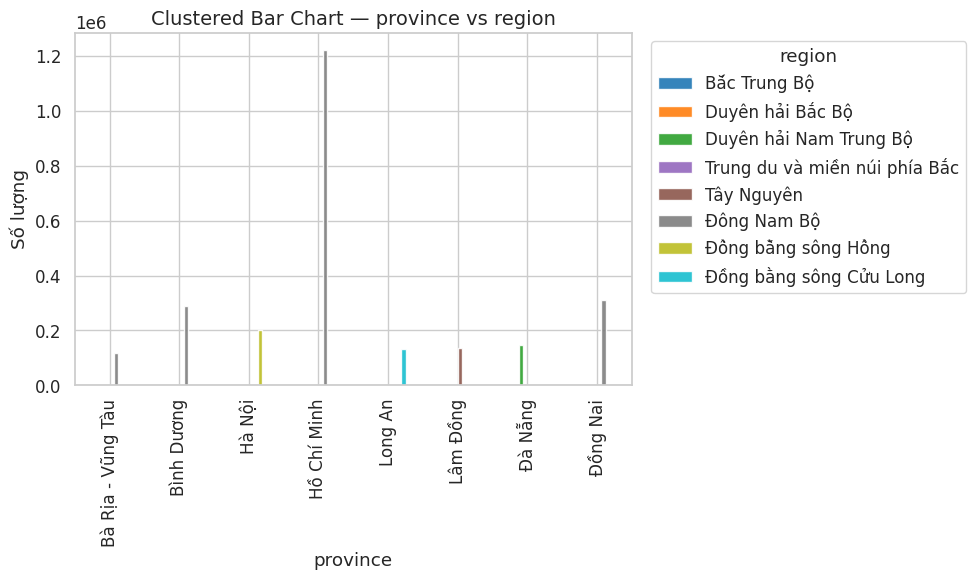


📊 Phân tích cặp (province, location_name)
────────────────────────────
🔹 Bảng tần suất:
location_name      DNA - 81 - 83 Nguyễn Văn Linh  DNA - 93-95 Lê Văn Hiến  \
province                                                                    
Bà Rịa - Vũng Tàu                              0                        0   
Bình Dương                                     0                        0   
Hà Nội                                        25                       27   
Hồ Chí Minh                                    5                        1   
Long An                                        1                        0   
Lâm Đồng                                       0                        0   
Đà Nẵng                                    22266                    19356   
Đồng Nai                                       0                        1   

location_name      HCM - 66 Nguyễn Du  HCM - 9 – 11 – 13 Nguyễn Trãi  \
province                                                            

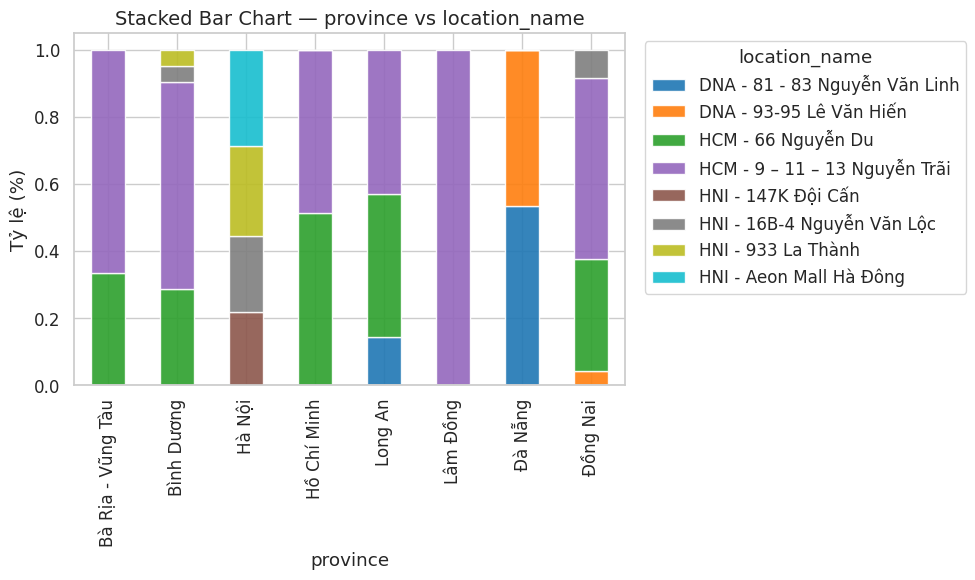

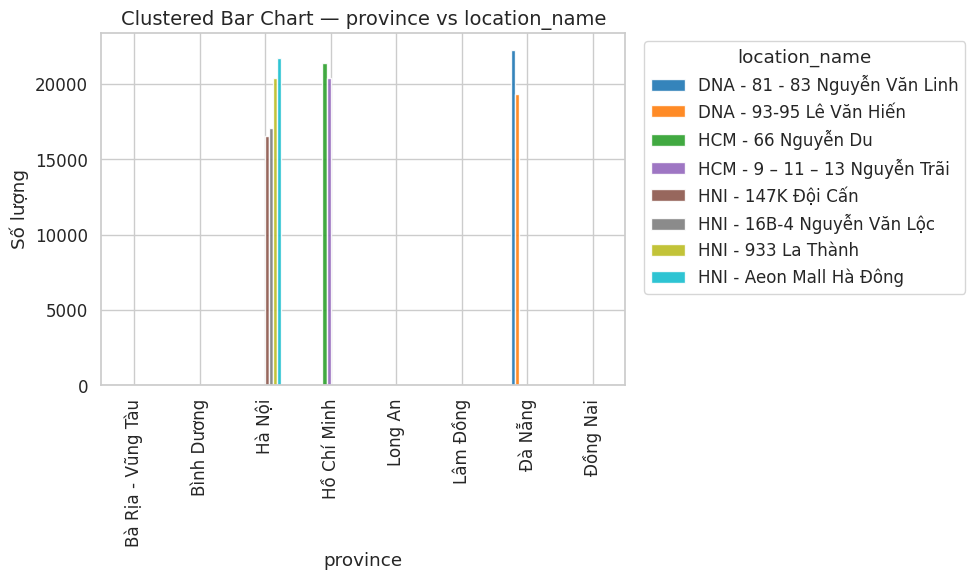


📊 Phân tích cặp (province, install_app)
────────────────────────────
🔹 Bảng tần suất:
install_app        Android  CRM Partner  Call  Chat  In-Store    SPE    Web  \
province                                                                      
Bà Rịa - Vũng Tàu      796          113   196    18    109608   4806    475   
Bình Dương            4247          374   477    52    260876  12242   1651   
Hà Nội                3946         1501  1877   341    112738  65007   4919   
Hồ Chí Minh          53910         1517  3861   287   1012054  87837  15678   
Long An               1436          167   137    19    124580   4876    494   
Lâm Đồng               867           41   219    14    126572   4074    478   
Đà Nẵng               3396          111   424    31    127630   8416   1028   
Đồng Nai              3838          357   257    46    288153  13022    928   

install_app          iOS  
province                  
Bà Rịa - Vũng Tàu   2089  
Bình Dương          7622  
Hà Nội        

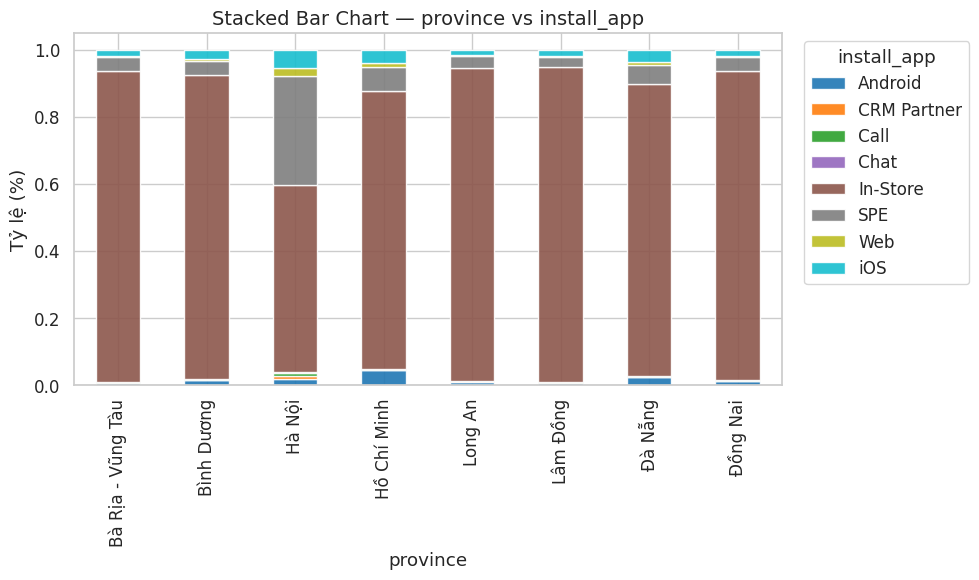

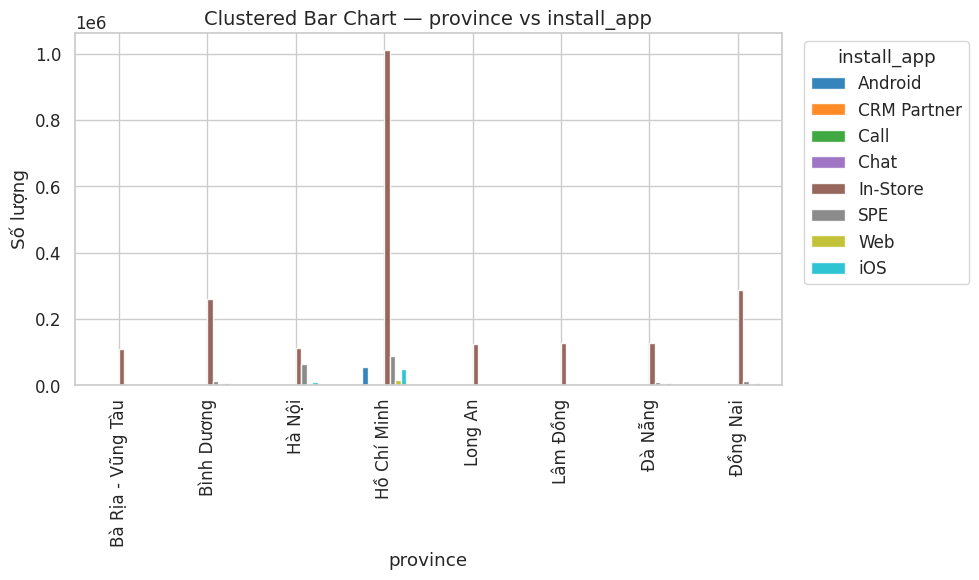


📊 Phân tích cặp (province, district)
────────────────────────────
🔹 Bảng tần suất:
district         1     12  Biên Hòa  Bình Chánh  Bình Tân  Thuận An  Thủ Đức  \
province                                                                       
Bình Dương       0      0         0           0         0     71383        0   
Hồ Chí Minh  65852  81975         0       84419    104624         0   195581   
Đồng Nai         0      0    125384           0         0         0        0   

district     Tân Phú  
province              
Bình Dương         0  
Hồ Chí Minh    98342  
Đồng Nai        4490  

🔹 Chi-square = 1630926.445, p = 0.0000e+00, dof = 14
➡️ Kết luận: Hai biến có mối liên hệ **có ý nghĩa thống kê**.


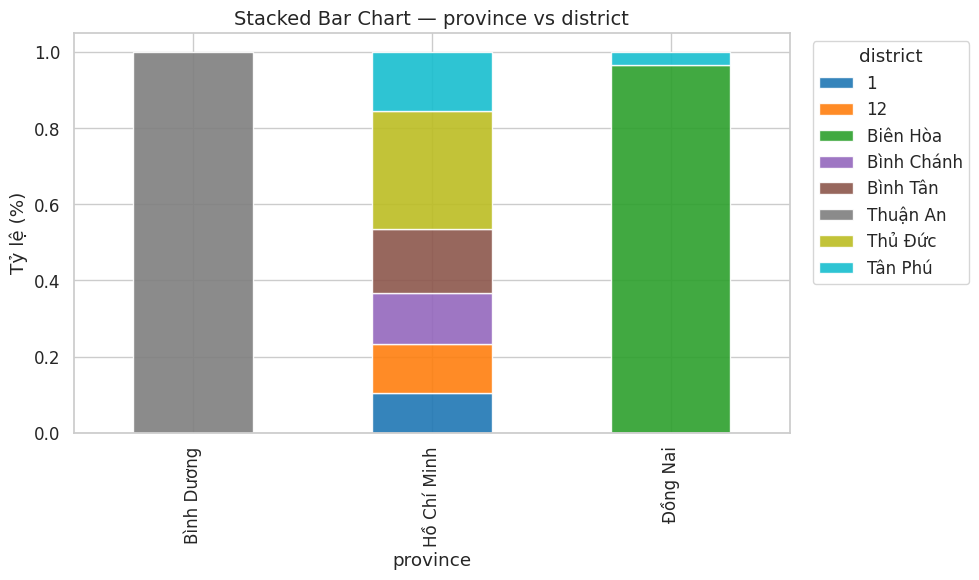

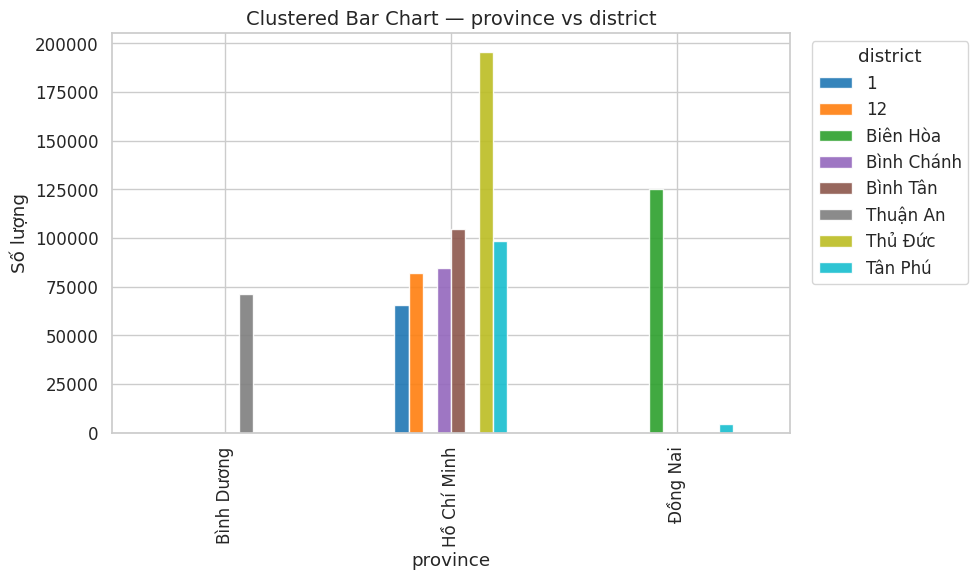

[⚠️] Không có dữ liệu hợp lệ cho (membership, sync_error_message)

📊 Phân tích cặp (membership, region)
────────────────────────────
🔹 Bảng tần suất:
region      Bắc Trung Bộ  Duyên hải Bắc Bộ  Duyên hải Nam Trung Bộ  \
membership                                                            
Diamond              1351                 6                    7652   
Gold                 8301                97                   31531   
Standard           208217              4280                  538123   

region      Trung du và miền núi phía Bắc  Tây Nguyên  Đông Nam Bộ  \
membership                                                           
Diamond                               296        4228        46949   
Gold                                 2338       17600       142275   
Standard                           102702      311635      1936842   

region      Đồng bằng sông Hồng  Đồng bằng sông Cửu Long  
membership                                                   
Diamond            

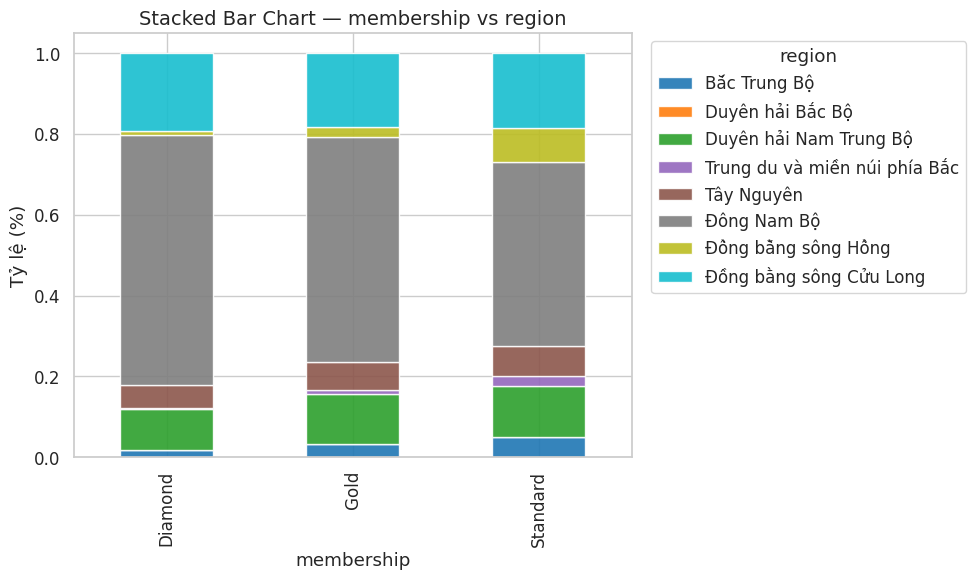

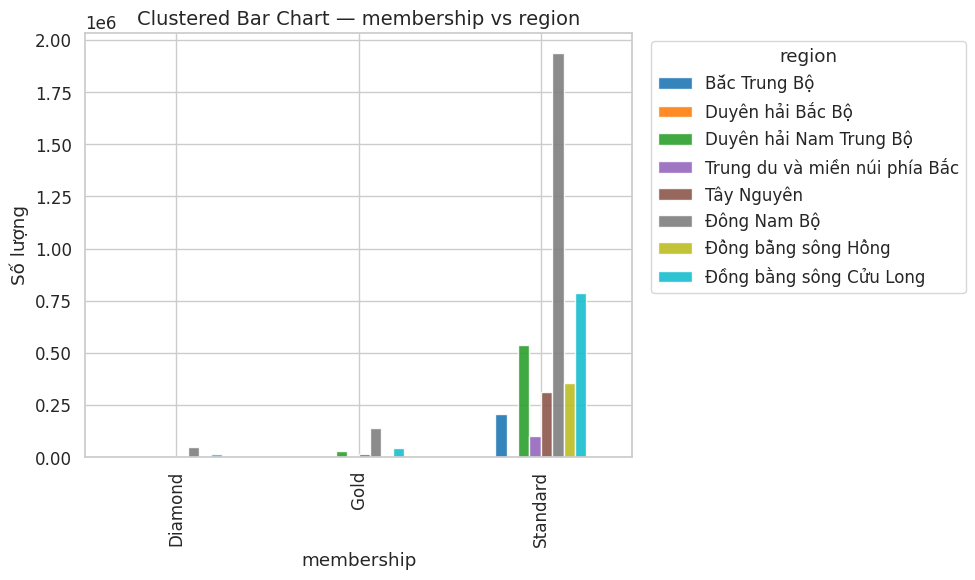


📊 Phân tích cặp (membership, location_name)
────────────────────────────
🔹 Bảng tần suất:
location_name  DNA - 81 - 83 Nguyễn Văn Linh  DNA - 93-95 Lê Văn Hiến  \
membership                                                              
Diamond                                  204                      100   
Gold                                     883                      573   
Standard                               21296                    18885   

location_name  HCM - 66 Nguyễn Du  HCM - 9 – 11 – 13 Nguyễn Trãi  \
membership                                                         
Diamond                       186                            413   
Gold                          663                           1148   
Standard                    20660                          19002   

location_name  HNI - 147K Đội Cấn  HNI - 16B-4 Nguyễn Văn Lộc  \
membership                                                      
Diamond                        41                          45   
Gold   

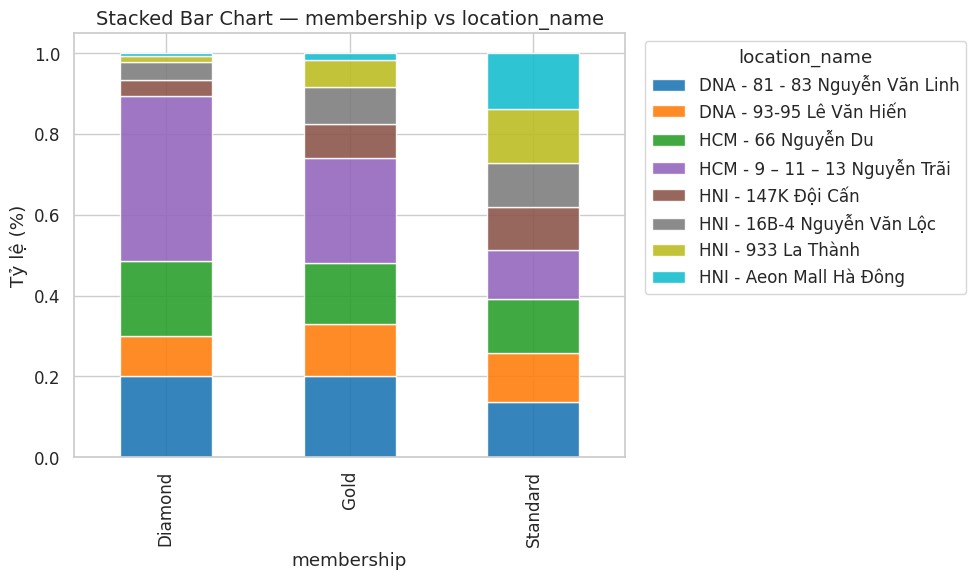

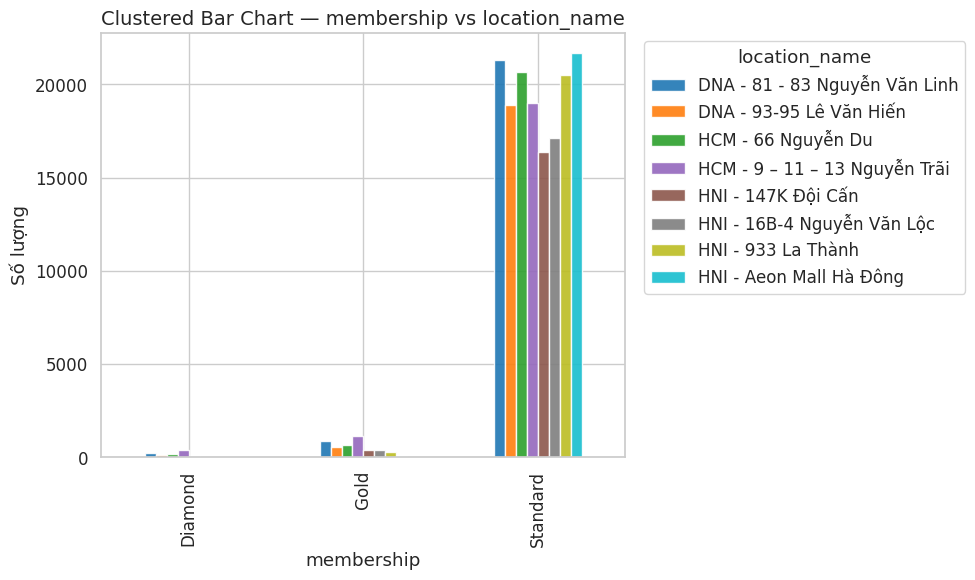


📊 Phân tích cặp (membership, install_app)
────────────────────────────
🔹 Bảng tần suất:
install_app  Android  CRM Partner  Call  Chat  In-Store     SPE    Web     iOS
membership                                                                    
Diamond         1879            0   202     3     64422    2205    224    6909
Gold            5889            6   605    15    214984   14264   1102   18305
Standard       84183        15986  9777  1709   3662594  331439  34550  102668

🔹 Chi-square = 36616.651, p = 0.0000e+00, dof = 14
➡️ Kết luận: Hai biến có mối liên hệ **có ý nghĩa thống kê**.


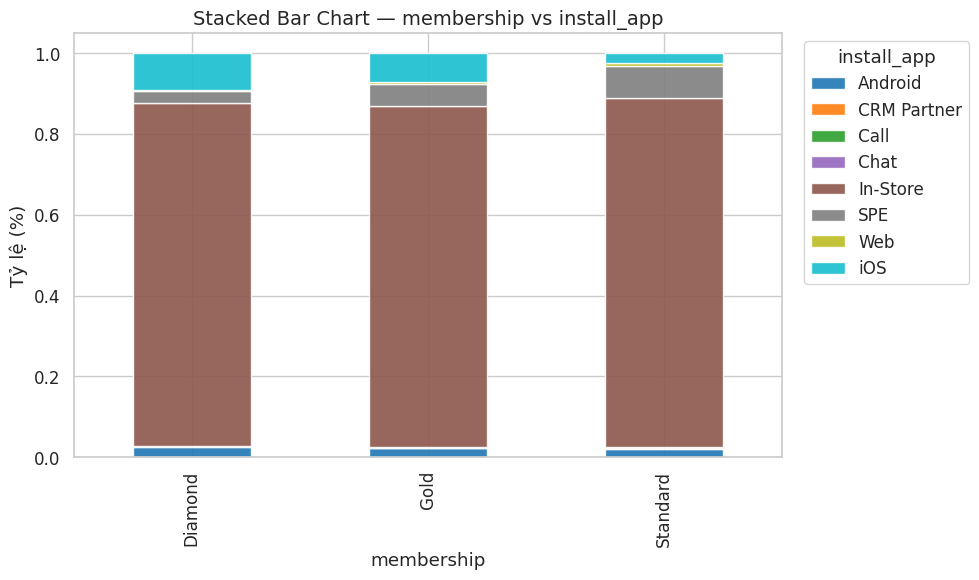

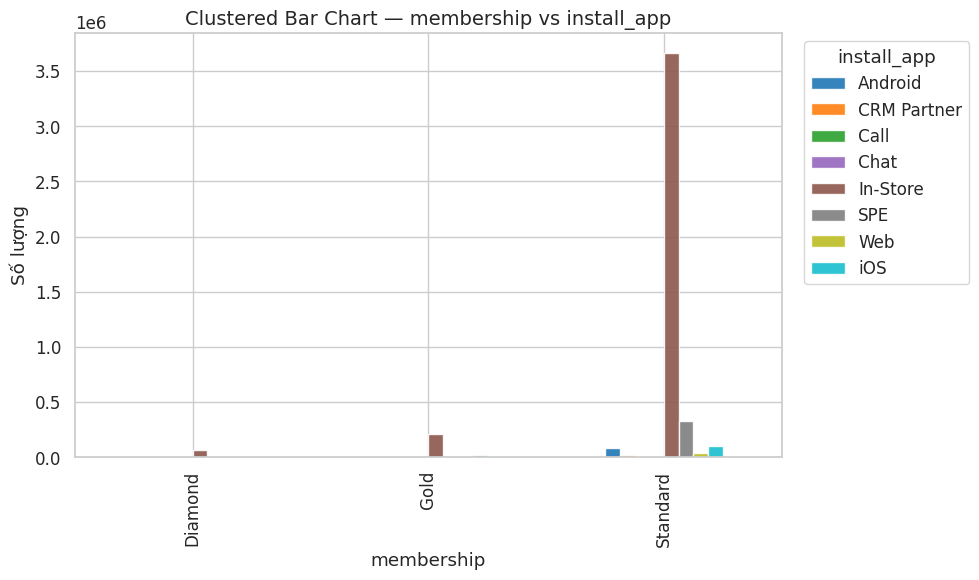


📊 Phân tích cặp (membership, district)
────────────────────────────
🔹 Bảng tần suất:
district        1     12  Biên Hòa  Bình Chánh  Bình Tân  Thuận An  Thủ Đức  \
membership                                                                    
Diamond       856   1877      2450        2023      2760      1623     5081   
Gold         2652   6183      7869        5948      7815      5397    15037   
Standard    62346  73924    115071       76456     95283     64367   175483   

district    Tân Phú  
membership           
Diamond        2029  
Gold           5975  
Standard      94831  

🔹 Chi-square = 2057.544, p = 0.0000e+00, dof = 14
➡️ Kết luận: Hai biến có mối liên hệ **có ý nghĩa thống kê**.


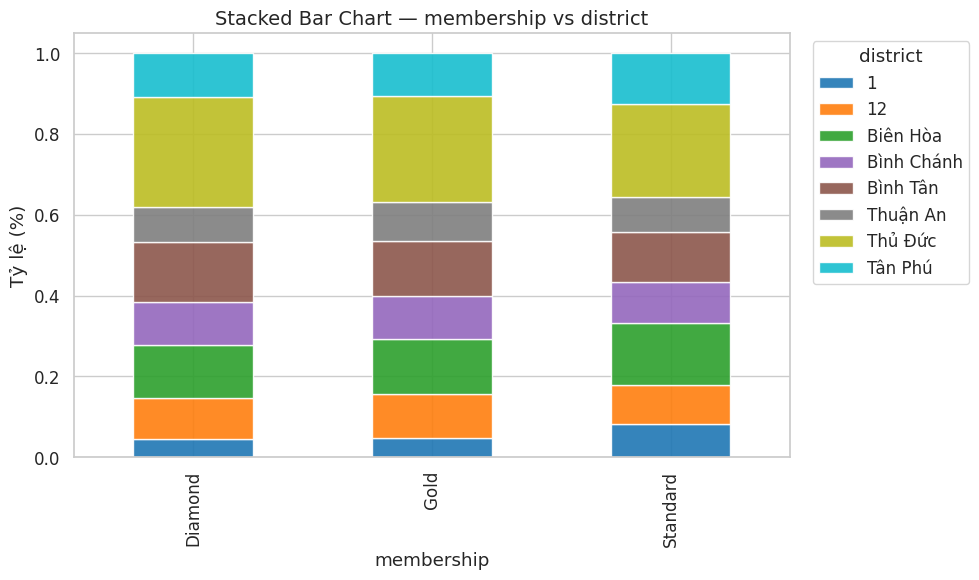

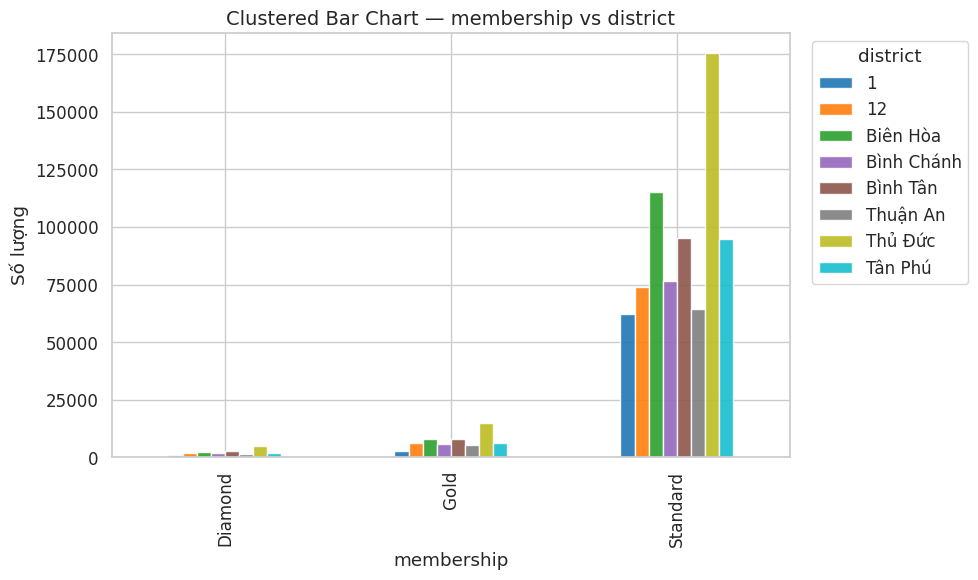

[⚠️] Không có dữ liệu hợp lệ cho (sync_error_message, region)
[⚠️] Không có dữ liệu hợp lệ cho (sync_error_message, location_name)
[⚠️] Không có dữ liệu hợp lệ cho (sync_error_message, install_app)
[⚠️] Không có dữ liệu hợp lệ cho (sync_error_message, district)

📊 Phân tích cặp (region, location_name)
────────────────────────────
🔹 Bảng tần suất:
location_name                  DNA - 81 - 83 Nguyễn Văn Linh  \
region                                                         
Bắc Trung Bộ                                              6   
Duyên hải Bắc Bộ                                           3   
Duyên hải Nam Trung Bộ                                 22326   
Trung du và miền núi phía Bắc                              6   
Tây Nguyên                                                 0   
Đông Nam Bộ                                                6   
Đồng bằng sông Hồng                                    33   
Đồng bằng sông Cửu Long                                    3   

location_n

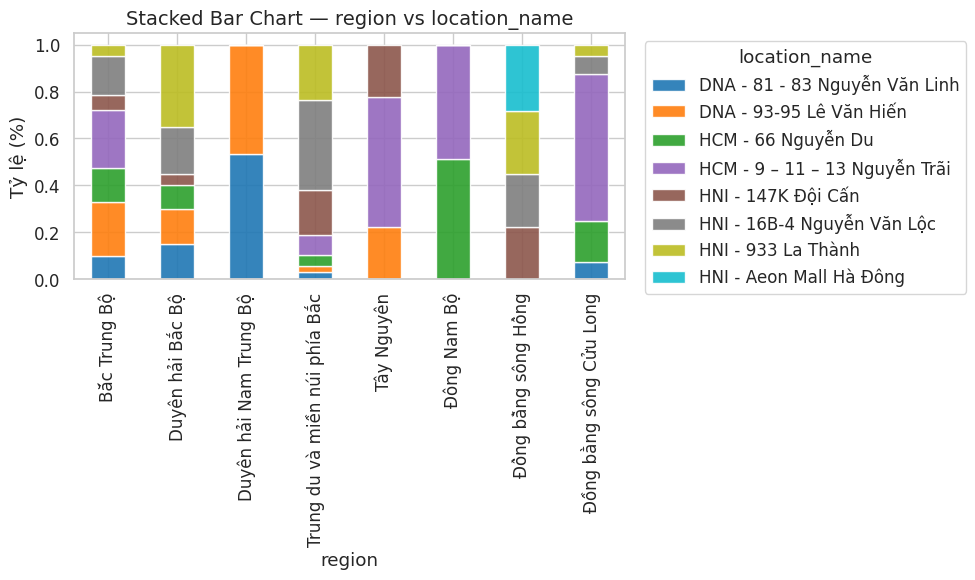

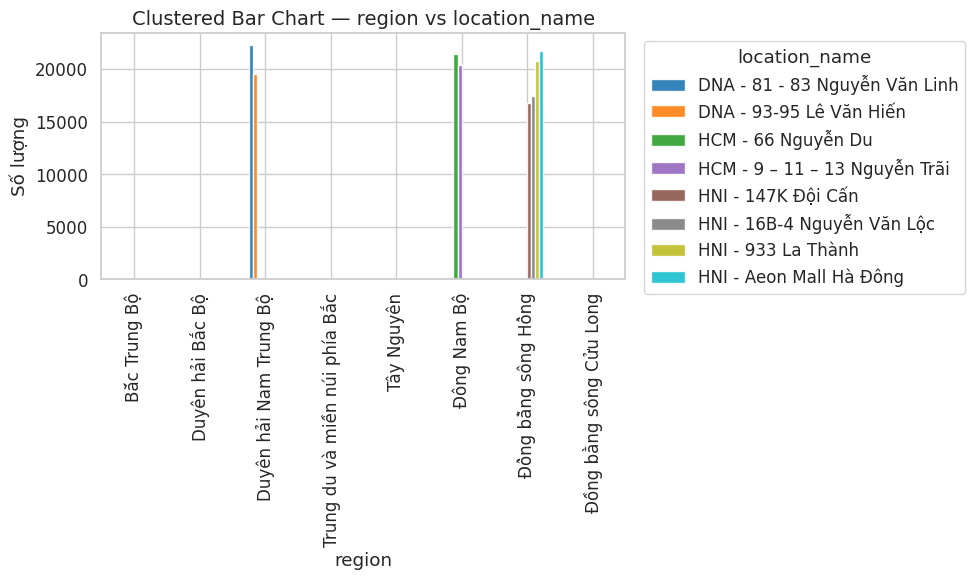


📊 Phân tích cặp (region, install_app)
────────────────────────────
🔹 Bảng tần suất:
install_app                    Android  CRM Partner  Call  Chat  In-Store  \
region                                                                      
Bắc Trung Bộ                     2435          699   546   182    183792   
Duyên hải Bắc Bộ                   146           66    38    11         0   
Duyên hải Nam Trung Bộ            7075         1665  1080   152    519726   
Trung du và miền núi phía Bắc      978          396   132    95     82670   
Tây Nguyên                        2654         1143   501    75    308377   
Đông Nam Bộ                      63825         4223  4906   437   1843602   
Đồng bằng sông Hồng            6091         4348  2334   538    224004   
Đồng bằng sông Cửu Long           8747         3452  1047   237    779829   

install_app                       SPE    Web    iOS  
region                                               
Bắc Trung Bộ                   2161

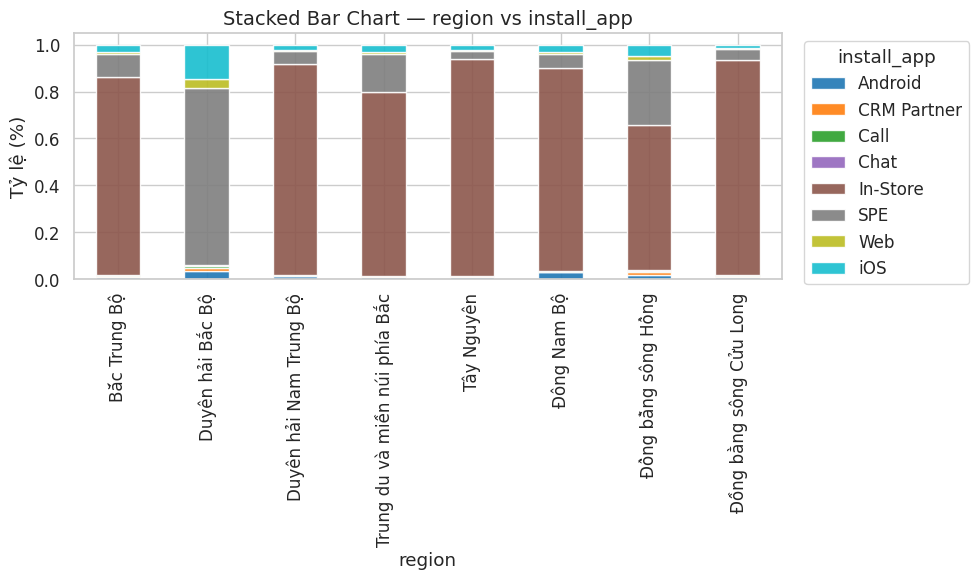

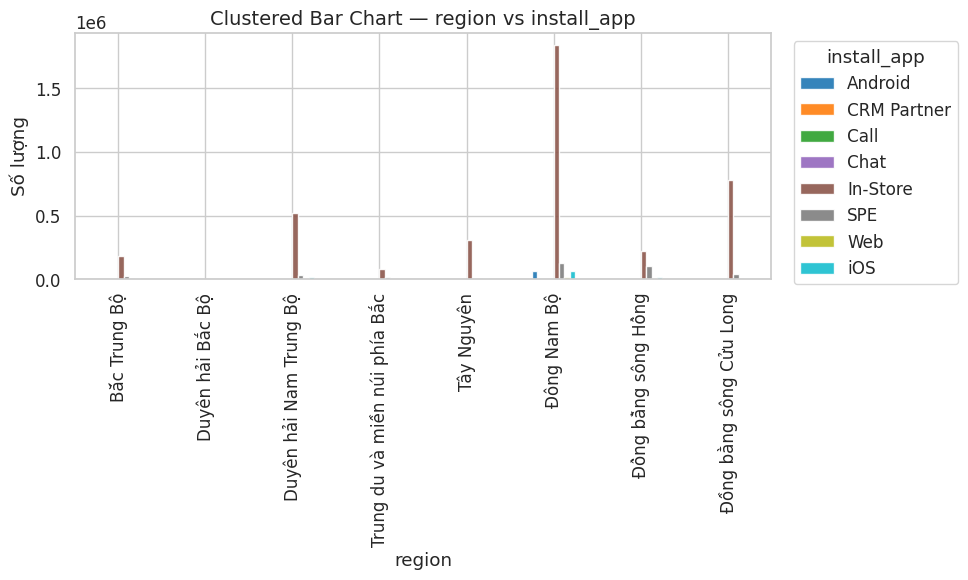


📊 Phân tích cặp (region, district)
────────────────────────────
🔹 Bảng tần suất:
district                     1     12  Biên Hòa  Bình Chánh  Bình Tân  \
region                                                                  
Bắc Trung Bộ                0      5         0          10        12   
Duyên hải Nam Trung Bộ       0      0         4           0         0   
Đông Nam Bộ              65854  81979    125386       84416    104618   
Đồng bằng sông Cửu Long      0      0         0           1      1228   

district                 Thuận An  Thủ Đức  Tân Phú  
region                                               
Bắc Trung Bộ                   0        4        4  
Duyên hải Nam Trung Bộ          6        0        0  
Đông Nam Bộ                 71381   195597   102830  
Đồng bằng sông Cửu Long         0        0        1  

🔹 Chi-square = 8515.122, p = 0.0000e+00, dof = 21
➡️ Kết luận: Hai biến có mối liên hệ **có ý nghĩa thống kê**.


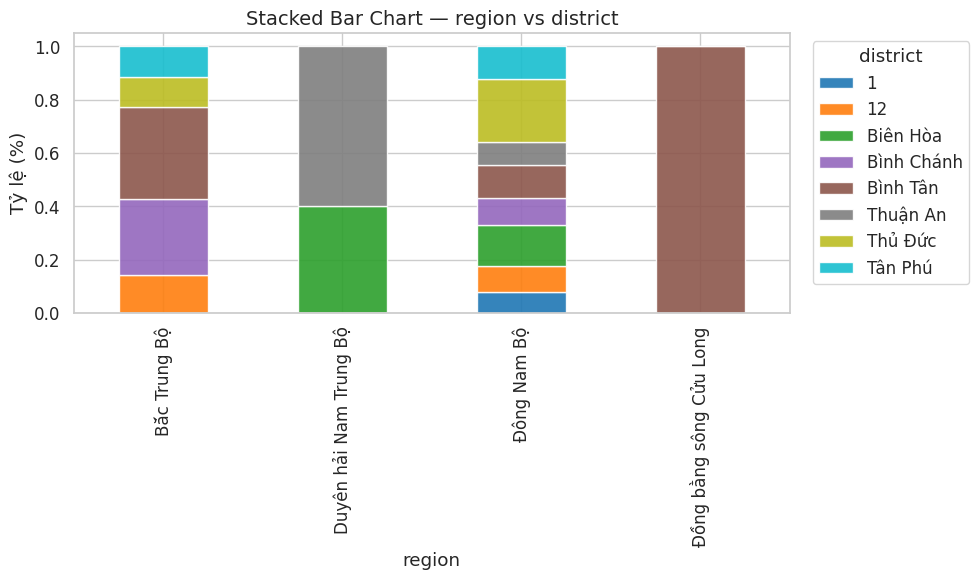

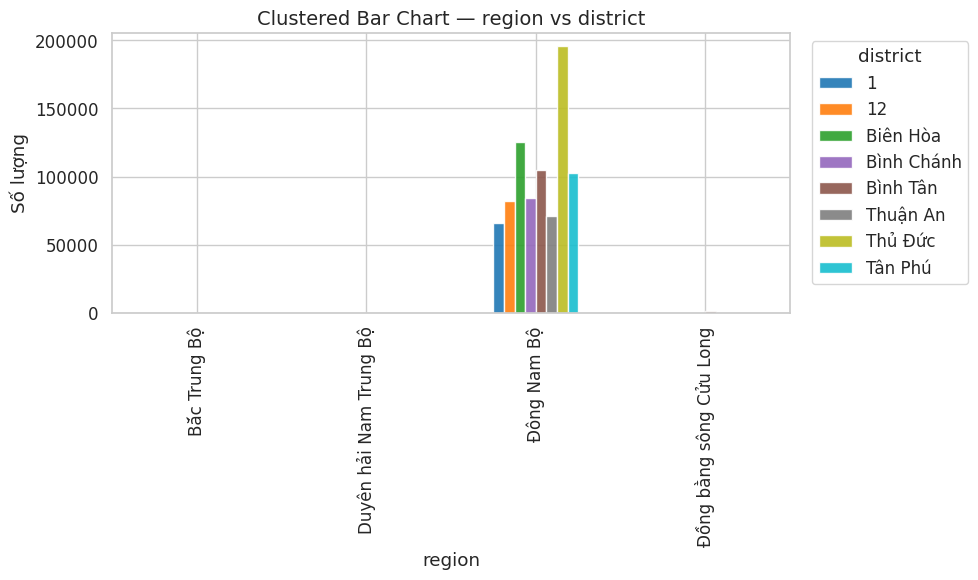


📊 Phân tích cặp (location_name, install_app)
────────────────────────────
🔹 Bảng tần suất:
install_app                    Android  CRM Partner  Call  Chat  In-Store  \
location_name                                                               
DNA - 81 - 83 Nguyễn Văn Linh      486           12    83     8     20114   
DNA - 93-95 Lê Văn Hiến            140           25    36     7     18335   
HCM - 66 Nguyễn Du                 326           14   108    11     19640   
HCM - 9 – 11 – 13 Nguyễn Trãi      623           10   133    11     17657   
HNI - 147K Đội Cấn                 287          202   235    25     10035   
HNI - 16B-4 Nguyễn Văn Lộc         357          306   198    32      7762   
HNI - 933 La Thành                 499          380   348    45      9538   
HNI - Aeon Mall Hà Đông              0            0     0     0     21745   

install_app                     SPE  Web   iOS  
location_name                                   
DNA - 81 - 83 Nguyễn Văn Linh   710  14

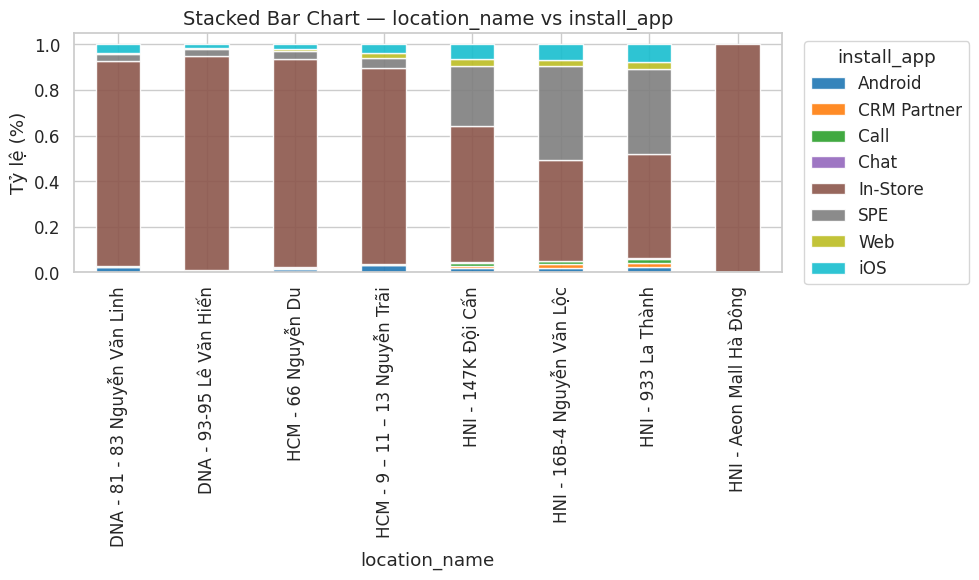

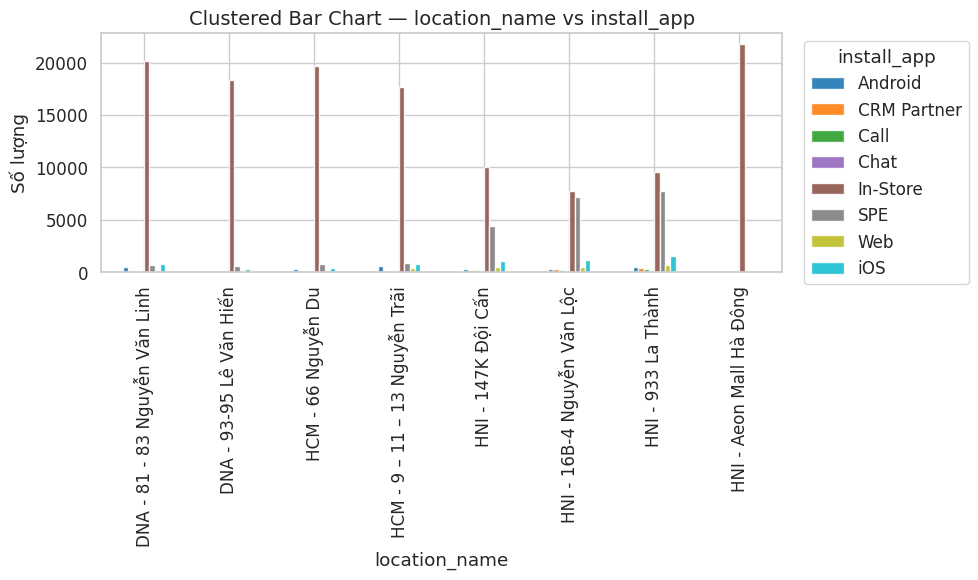


📊 Phân tích cặp (location_name, district)
────────────────────────────
🔹 Bảng tần suất:
district                           1  12  Biên Hòa  Bình Chánh  Bình Tân  \
location_name                                                              
DNA - 81 - 83 Nguyễn Văn Linh      0   0         0           0         0   
DNA - 93-95 Lê Văn Hiến            0   0         1           0         0   
HCM - 66 Nguyễn Du             20610   3         7          14         9   
HCM - 9 – 11 – 13 Nguyễn Trãi  18636  10         5          61        49   
HNI - 16B-4 Nguyễn Văn Lộc         0   1         0           0         0   

district                       Thuận An  Thủ Đức  Tân Phú  
location_name                                              
DNA - 81 - 83 Nguyễn Văn Linh         0        1        0  
DNA - 93-95 Lê Văn Hiến               0        0        0  
HCM - 66 Nguyễn Du                    3       98       72  
HCM - 9 – 11 – 13 Nguyễn Trãi         3       65      193  
HNI - 16B-4 Nguyễn

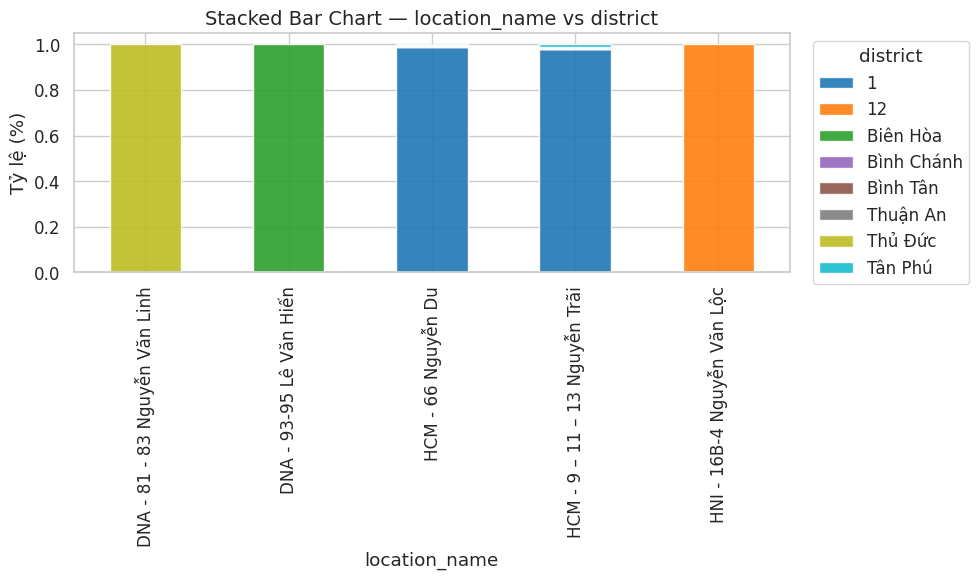

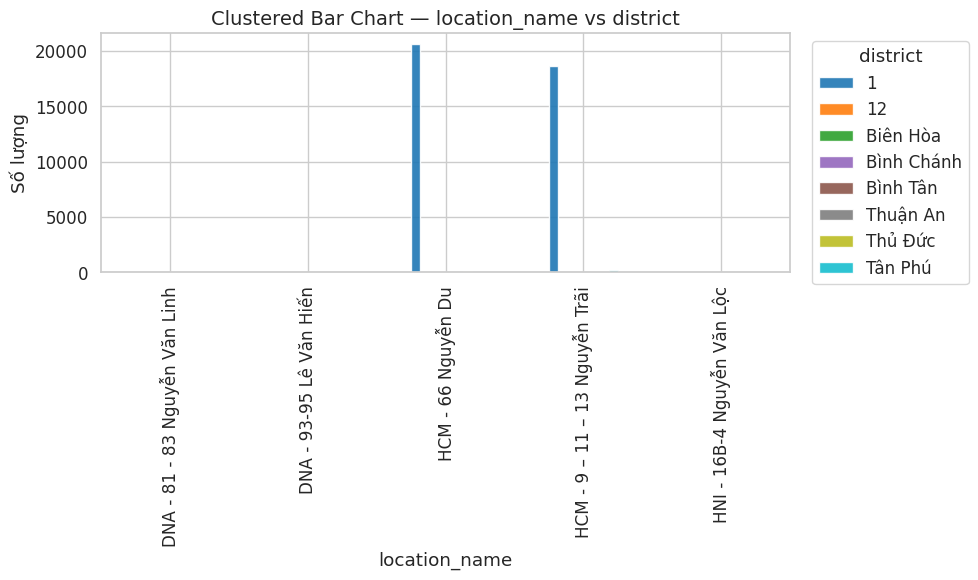


📊 Phân tích cặp (install_app, district)
────────────────────────────
🔹 Bảng tần suất:
district         1     12  Biên Hòa  Bình Chánh  Bình Tân  Thuận An  Thủ Đức  \
install_app                                                                    
Android        422   1258      2705        3968      3577      1345     3466   
CRM Partner      9    175        69          53        49        48      185   
Call           339    238       140         260       226       134      647   
Chat            25     19        16          15        15        11       45   
In-Store     60744  70703    113549       70635     90310     64867   165850   
SPE           2290   6076      5612        4804      7463      2842    16392   
Web            878    881       375         766       924       350     1897   
iOS           1146   2633      2923        3926      3293      1789     7112   

district     Tân Phú  
install_app           
Android        14646  
CRM Partner       28  
Call             149

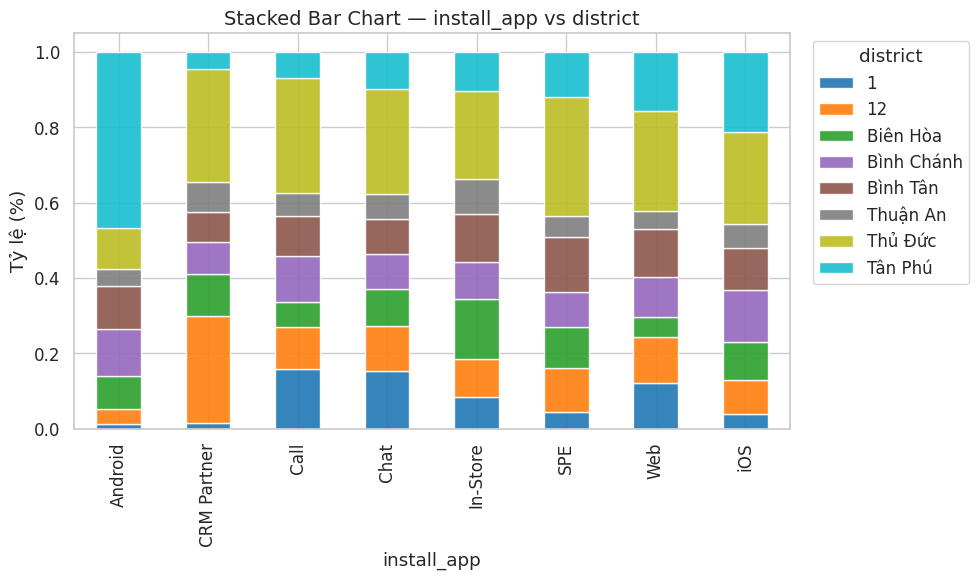

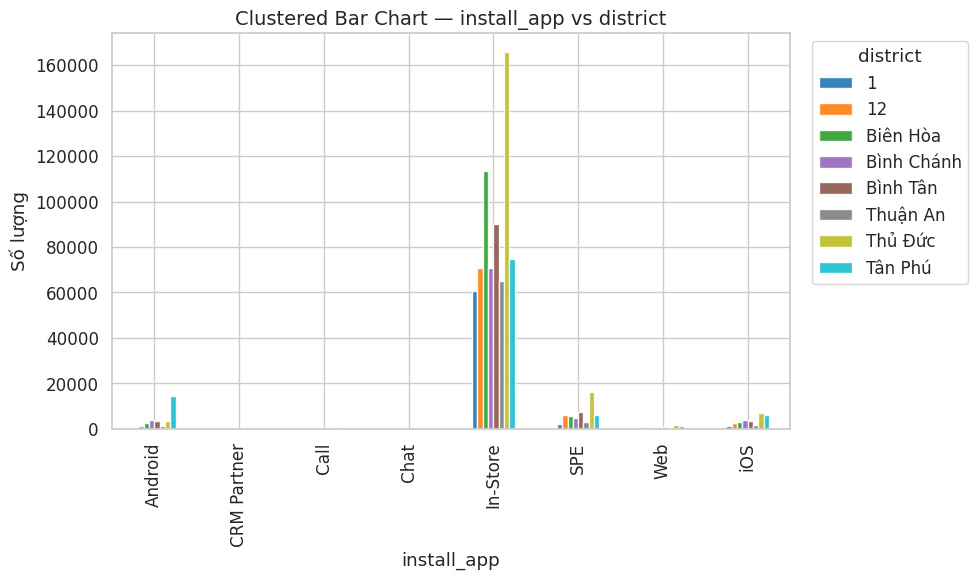

In [9]:
import polars as pl
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency

def analyze_category_category(df_item, cat1, cat2, top_k=10):
    """
    Phân tích thống kê & trực quan hóa giữa hai biến categorical:
    - Chi-square test (kiểm định độc lập)
    - Stacked Bar Chart (phân bố theo tỷ lệ)
    - Clustered Bar Chart (so sánh số lượng)
    """

    # --- Chuẩn bị dữ liệu ---
    df_plot = (
        df_item
        .select([cat1, cat2])
        .drop_nulls()
    ).to_pandas()

    if df_plot.empty:
        print(f"[⚠️] Không có dữ liệu hợp lệ cho ({cat1}, {cat2})")
        return

    # Lấy top category phổ biến nhất của mỗi biến
    top_cat1 = df_plot[cat1].value_counts().nlargest(top_k).index
    top_cat2 = df_plot[cat2].value_counts().nlargest(top_k).index
    df_top = df_plot[df_plot[cat1].isin(top_cat1) & df_plot[cat2].isin(top_cat2)]

    # --- 1️⃣ Thống kê: Cross-tab + Chi-square test ---
    crosstab = pd.crosstab(df_top[cat1], df_top[cat2])
    chi2, p, dof, expected = chi2_contingency(crosstab)

    print(f"\n📊 Phân tích cặp ({cat1}, {cat2})")
    print("────────────────────────────")
    print("🔹 Bảng tần suất:")
    print(crosstab)
    print(f"\n🔹 Chi-square = {chi2:.3f}, p = {p:.4e}, dof = {dof}")
    if p < 0.05:
        print("➡️ Kết luận: Hai biến có mối liên hệ **có ý nghĩa thống kê**.")
    else:
        print("➡️ Kết luận: Không tìm thấy mối liên hệ đáng kể.")

    # --- 2️⃣ Visualization ---

    sns.set(style="whitegrid", font_scale=1.1)
    palette = sns.color_palette("tab10", n_colors=len(top_cat2))

    # ==============================
    # 🔹 STACKED BAR CHART
    # ==============================
    crosstab_ratio = crosstab.div(crosstab.sum(axis=1), axis=0)

    crosstab_ratio.plot(
        kind="bar",
        stacked=True,
        figsize=(10, 6),
        colormap="tab10",
        alpha=0.9
    )
    plt.title(f"Stacked Bar Chart — {cat1} vs {cat2}", fontsize=14)
    plt.xlabel(cat1)
    plt.ylabel("Tỷ lệ (%)")
    plt.legend(title=cat2, bbox_to_anchor=(1.02, 1), loc="upper left", frameon=True)
    plt.tight_layout()
    plt.show()

    # ==============================
    # 🔹 CLUSTERED BAR CHART
    # ==============================
    crosstab.plot(
        kind="bar",
        figsize=(10, 6),
        colormap="tab10",
        alpha=0.9
    )
    plt.title(f"Clustered Bar Chart — {cat1} vs {cat2}", fontsize=14)
    plt.xlabel(cat1)
    plt.ylabel("Số lượng")
    plt.legend(title=cat2, bbox_to_anchor=(1.02, 1), loc="upper left", frameon=True)
    plt.tight_layout()
    plt.show()


for i, cat1 in enumerate(category_cols):
    for cat2 in category_cols[i+1:]:
        analyze_category_category(df_user, cat1, cat2, top_k=8)
